In [1]:
import numpy as np
import pandas
import pm4py
from matplotlib import pyplot as plt
from sklearn.mixture import GaussianMixture
import scipy.stats as stats
import ot
import os
from tqdm import tqdm
import collections
import matplotlib.dates as md
import importlib
import pickle
import random

pandas.set_option('display.max_columns', None)
#pandas.set_option('display.max_rows', None)


import sys
sys.path.append('../../TaskExecutionTimeMining/')
from drbart_parser import *
from event_log_transformer import *

#sys.path.append('../../Evaluation')
sys.path.append('../../Evaluation/')
from PCR_evaluation.dumas_evaluation import *

In [10]:
with open('../transformed_event_logs/PCR_start_end_test.pickle', 'rb') as f:
    test_event_log = pickle.load(f)

In [11]:
with open('../../../models/pcr_dumas/dumas_model.pickle', 'rb') as f:
    dumas_model = pickle.load(f)

In [12]:
import conduct_evaluation
#sample_dumas = SampleOutcomes_Dumas_Normal(test_event_log, dumas_model)

evaluator = conduct_evaluation.ConductEvaluation(dumas_model, SampleOutcomes_Dumas_Normal, {},
                                     test_event_log)

In [13]:
lieklihoods = evaluator.sample_cases(False)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1235/1235 [26:12<00:00,  1.27s/it]


In [14]:
lieklihoods

{10056: 3.231393709368451e-05,
 10066: 3.3571995228662185e-05,
 10069: 3.1843638849401785e-05,
 10075: 3.2021262871517086e-05,
 10076: 3.1520502024127215e-05,
 10086: 3.236419223428101e-05,
 10089: 3.3765170936757044e-05,
 10096: 3.3184436196673195e-05,
 10098: 3.195649122826715e-05,
 10099: 3.2293576824665334e-05,
 10100: 3.229108014907127e-05,
 10108: 3.383996237231028e-05,
 10112: 3.431804854475326e-05,
 10115: 2.9760892291761454e-05,
 10121: 3.2745262863390945e-05,
 10130: 3.2686528829297205e-05,
 10131: 3.2185597010503775e-05,
 10134: 3.34035464247931e-05,
 10142: 3.215962946702966e-05,
 10145: 3.085097489344923e-05,
 10162: 3.311392201808576e-05,
 10165: 2.1522603788932384e-05,
 10170: 2.1711391868577714e-05,
 10172: 2.9047606938073e-05,
 10178: 3.1496878872621074e-05,
 10179: 3.4034247148416e-05,
 10181: 3.406218320498916e-05,
 10199: 3.172794406089653e-05,
 10201: 1.9866702828428834e-05,
 10204: 3.041224846116567e-05,
 10205: 3.2620192165451096e-05,
 10212: 3.160808592644638e-0

In [17]:
sum([lieklihood for lieklihood in lieklihoods.values()])

0.033319810439629116

In [15]:
sum([math.log(lieklihood) for lieklihood in lieklihoods.values()])

11515.587113321004

In [4]:
#sample_dumas = SampleOutcomes_Dumas_Normal(test_event_log, dumas_model)

num cases 4936
12331


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


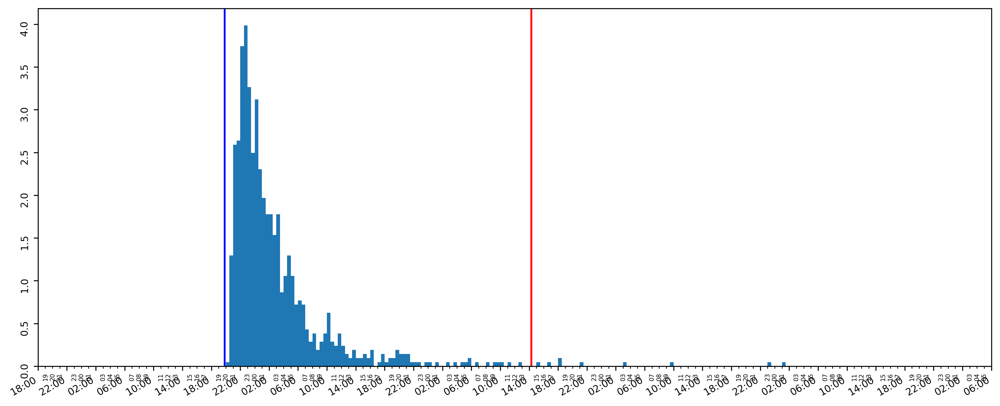

12331 2023-04-12 19:49:39.376000 2023-04-14 14:17:42.330000 [0.01385113] 0.0 2023-04-12 20:12:07.697172 2023-04-16 01:04:05.904299 3 days, 4:51:58.207127
11259


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


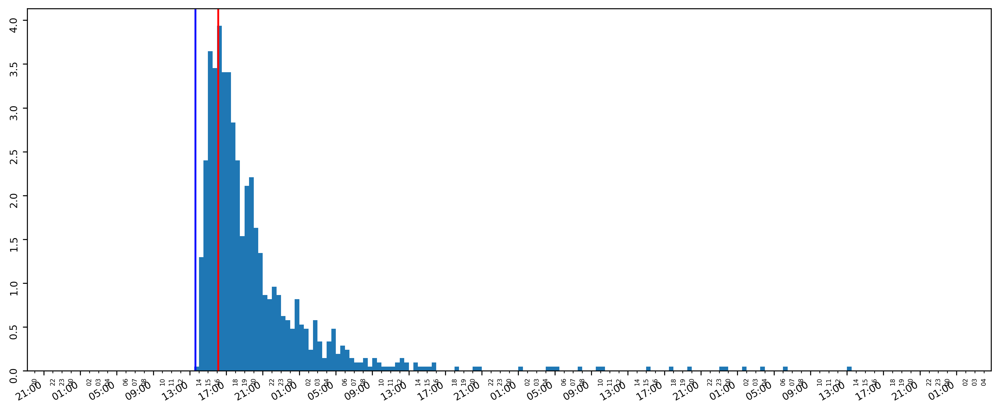

11259 2023-04-09 13:36:45.013000 2023-04-09 16:07:39.325000 [2.5686772] 0.0 2023-04-09 13:52:38.244978 2023-04-12 13:04:58.902710 2 days, 23:12:20.657732
12774


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


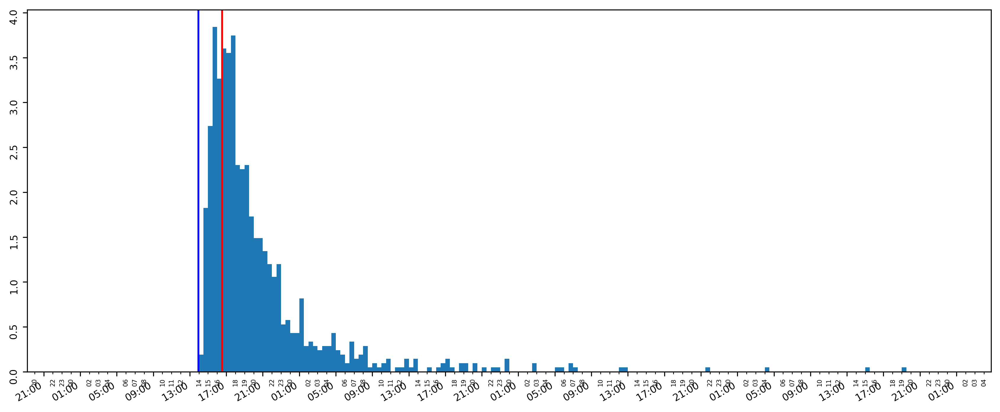

12774 2023-04-15 13:56:46.057000 2023-04-15 16:32:22.655000 [2.5983617] 65.7777282714844 2023-04-15 14:27:32.823932 2023-04-18 19:18:21.209406 3 days, 4:50:48.385474
14149


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


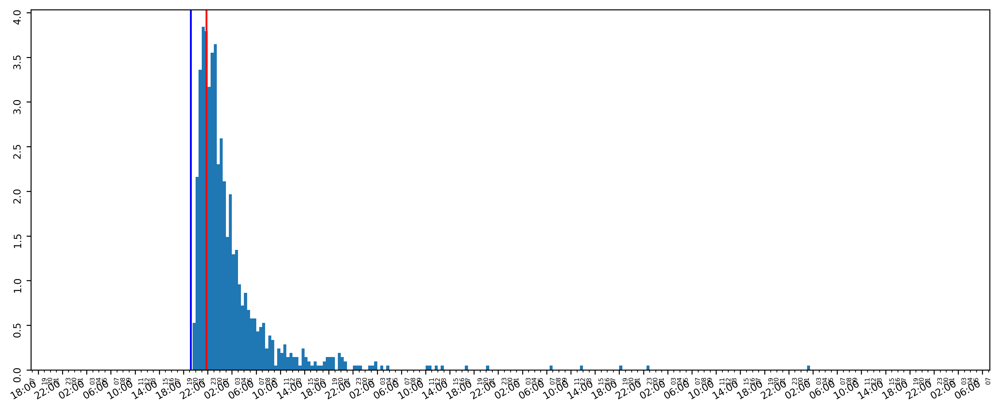

14149 2023-04-24 19:12:25.180000 2023-04-24 21:47:25.433000 [2.60017411] 0.0 2023-04-24 19:34:22.137582 2023-04-29 01:10:00.445298 4 days, 5:35:38.307716
12594


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


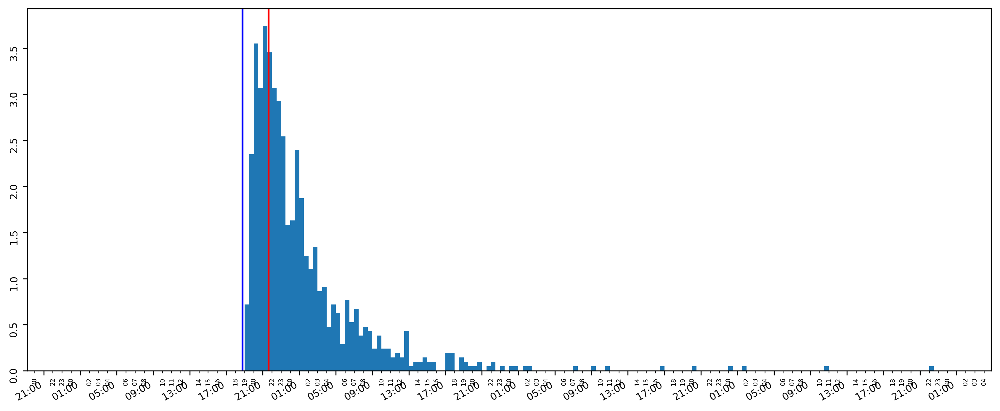

12594 2023-04-14 18:47:20.059000 2023-04-14 21:38:36.028000 [2.66438276] 0.0 2023-04-14 19:11:40.080958 2023-04-17 22:25:10.990758 3 days, 3:13:30.909800
14233


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


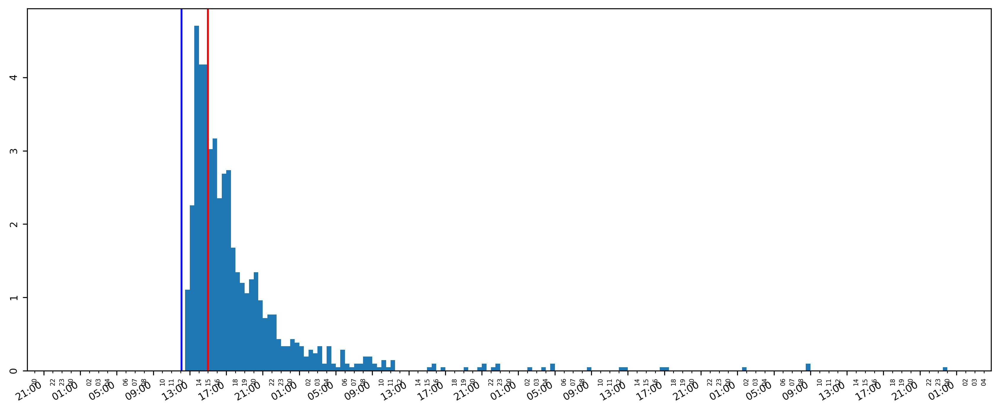

14233 2023-04-25 12:06:04.029000 2023-04-25 14:59:46.628000 [2.73698456] 0.0 2023-04-25 12:33:38.167092 2023-04-28 23:50:31.399022 3 days, 11:16:53.231930
11130


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


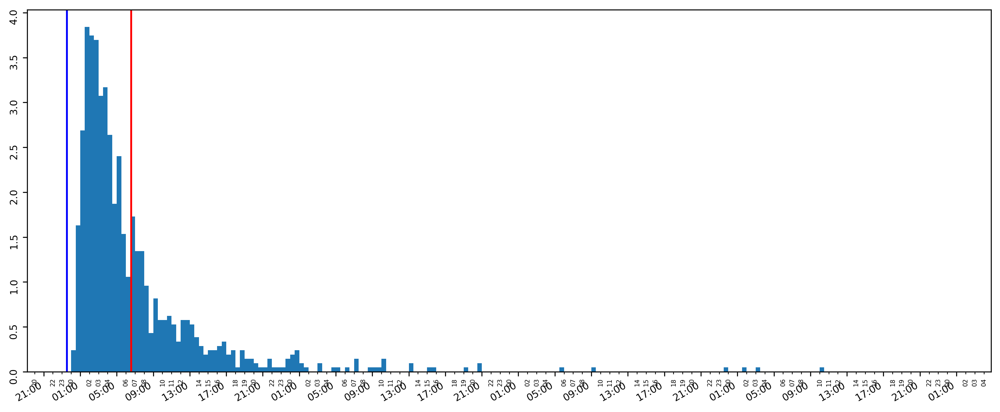

11130 2023-04-06 23:32:44.060000 2023-04-07 06:35:01.860000 [1.59480048] 0.0 2023-04-07 00:11:57.837448 2023-04-10 10:19:40.772239 3 days, 10:07:42.934791
13320


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


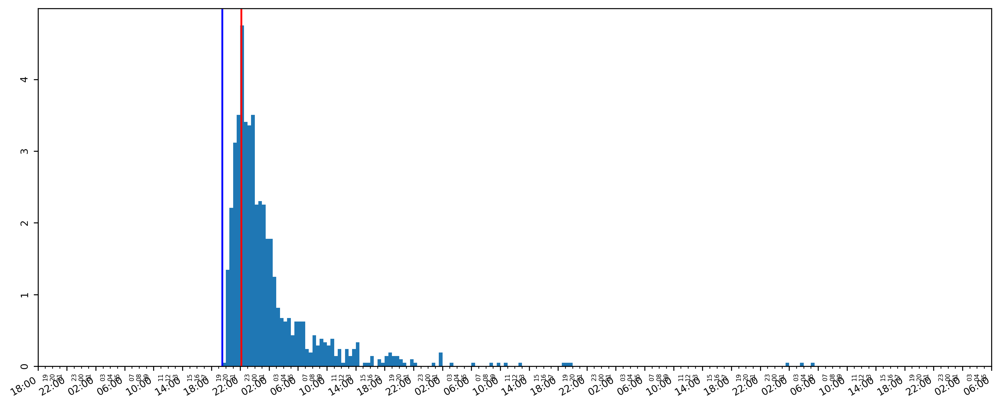

13320 2023-04-18 19:31:14.655000 2023-04-18 22:09:36.252000 [2.70833099] 0.0 2023-04-18 19:59:26.275429 2023-04-22 05:18:26.819950 3 days, 9:19:00.544521
714


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


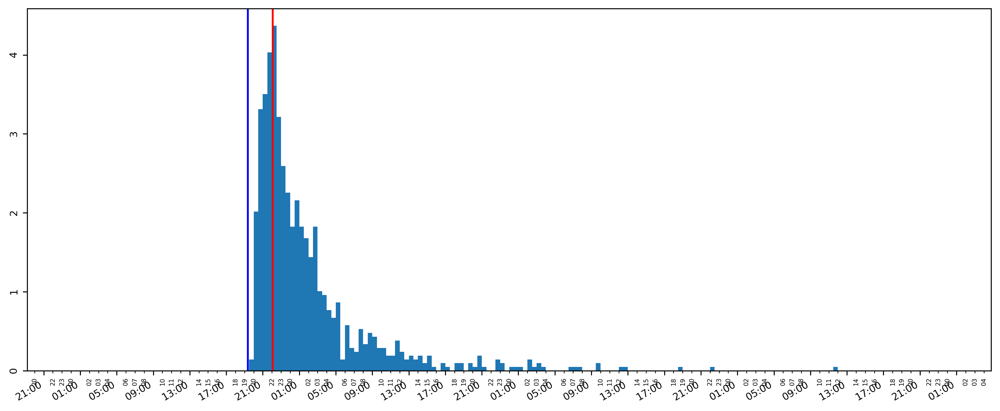

714 2023-04-11 19:21:47.533000 2023-04-11 22:05:43.893000 [2.76624042] 0.0 2023-04-11 19:45:22.160054 2023-04-14 11:59:34.634808 2 days, 16:14:12.474754
14485


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


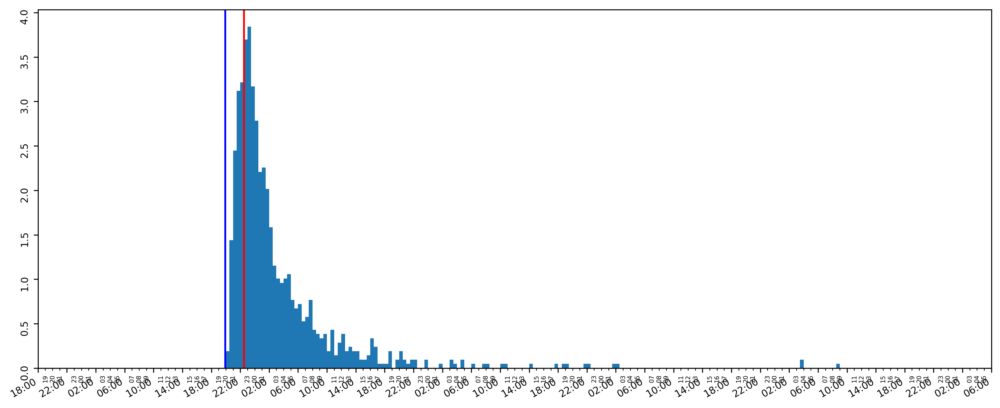

14485 2023-04-26 19:55:35.002000 2023-04-26 22:31:59.275000 [2.39561028] 0.0 2023-04-26 20:22:10.898800 2023-04-30 08:49:45.206195 3 days, 12:27:34.307395
14854


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


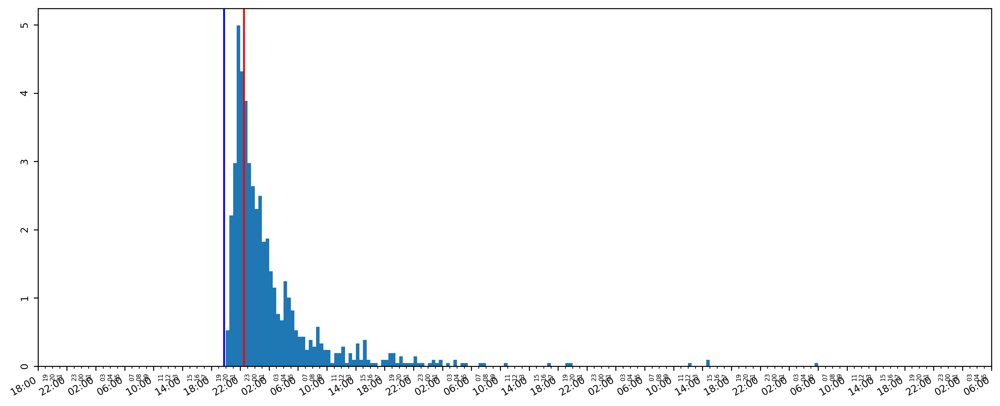

14854 2023-04-28 19:44:53.721000 2023-04-28 22:30:55.896000 [2.74001229] 0.0 2023-04-28 20:18:32.768831 2023-05-02 05:48:02.031507 3 days, 9:29:29.262676
17314


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


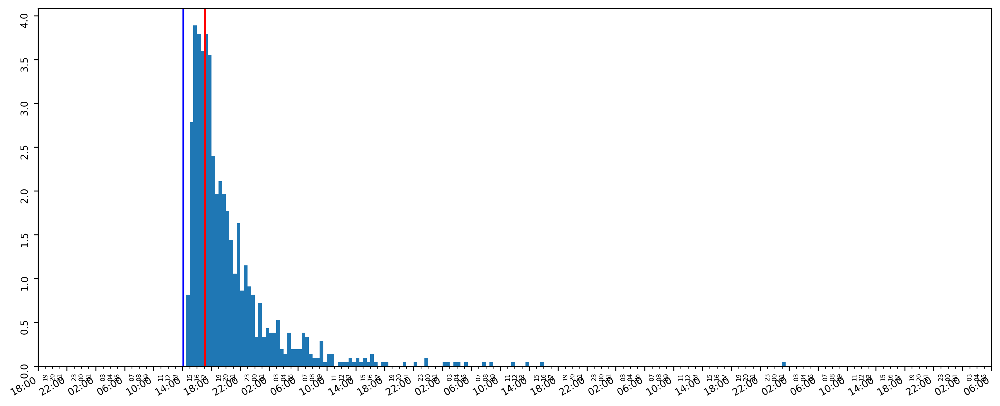

17314 2023-06-03 14:06:25.454000 2023-06-03 17:08:11.380000 [2.82115715] 0.0 2023-06-03 14:33:02.454573 2023-06-07 01:13:23.096254 3 days, 10:40:20.641681
16727


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


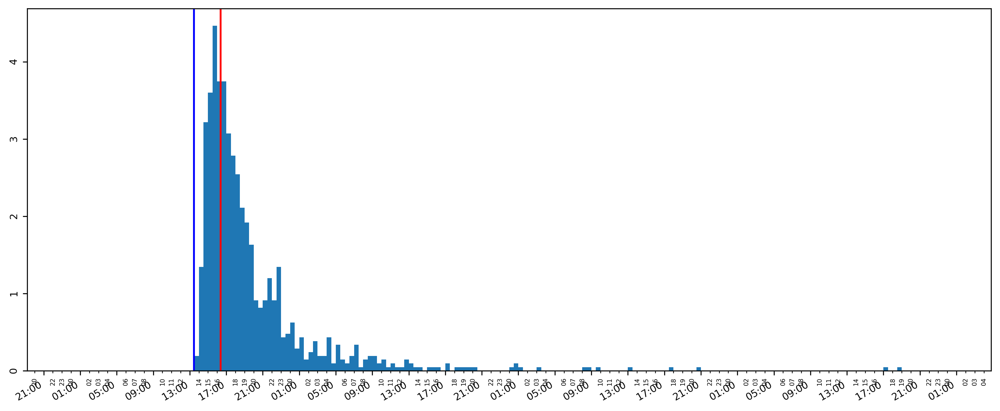

16727 2023-05-23 13:28:01.378000 2023-05-23 16:21:48.652000 [2.85354538] 0.0 2023-05-23 13:50:53.103389 2023-05-26 18:54:42.999223 3 days, 5:03:49.895834
17205


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


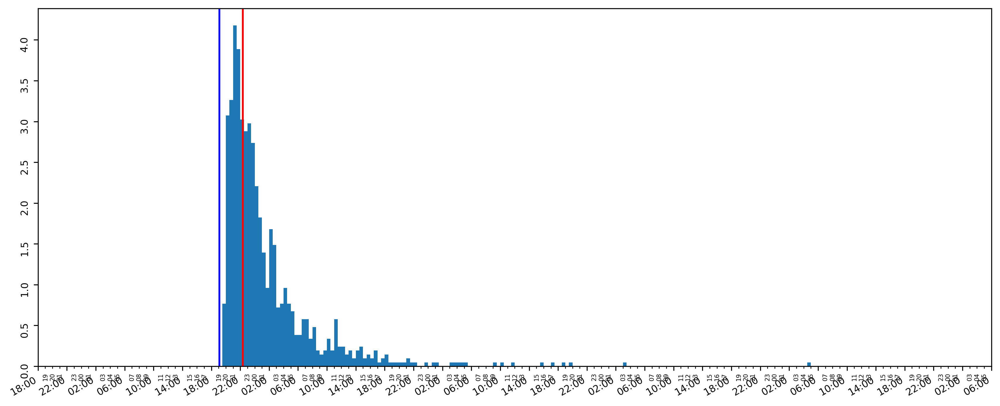

17205 2023-06-01 19:06:52.669000 2023-06-01 22:22:34.758000 [2.75751559] 0.0 2023-06-01 19:30:49.115798 2023-06-05 04:36:35.407222 3 days, 9:05:46.291424
16828


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


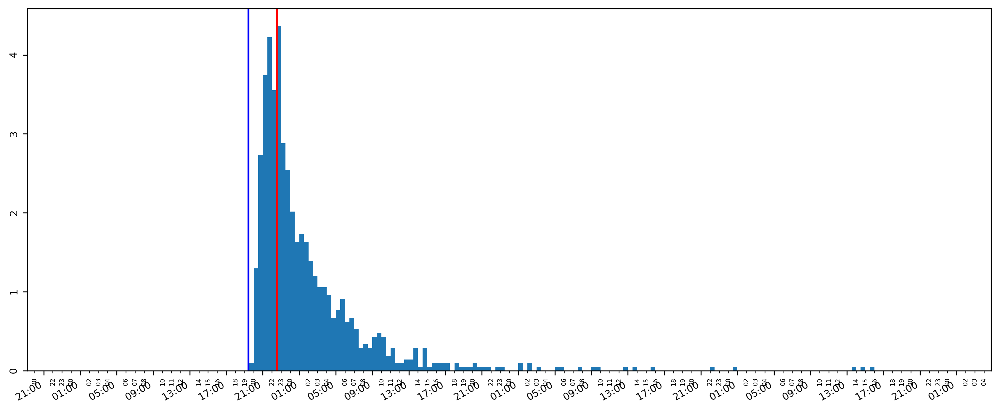

16828 2023-05-24 19:25:42.592000 2023-05-24 22:34:23.039000 [2.77761275] 0.0 2023-05-24 19:41:18.336880 2023-05-27 15:49:19.908083 2 days, 20:08:01.571203
16055


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


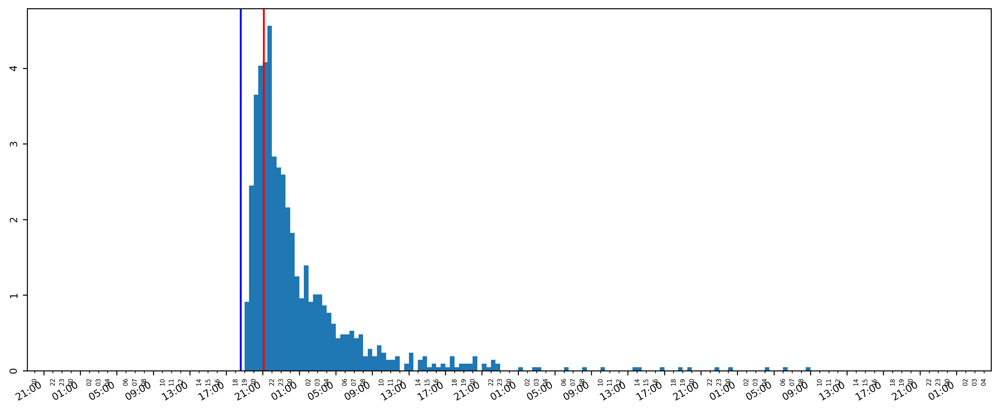

16055 2023-05-11 18:35:10.572000 2023-05-11 21:06:19.503000 [2.73448121] 0.0 2023-05-11 19:05:11.117562 2023-05-14 08:46:43.269236 2 days, 13:41:32.151674
14639


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


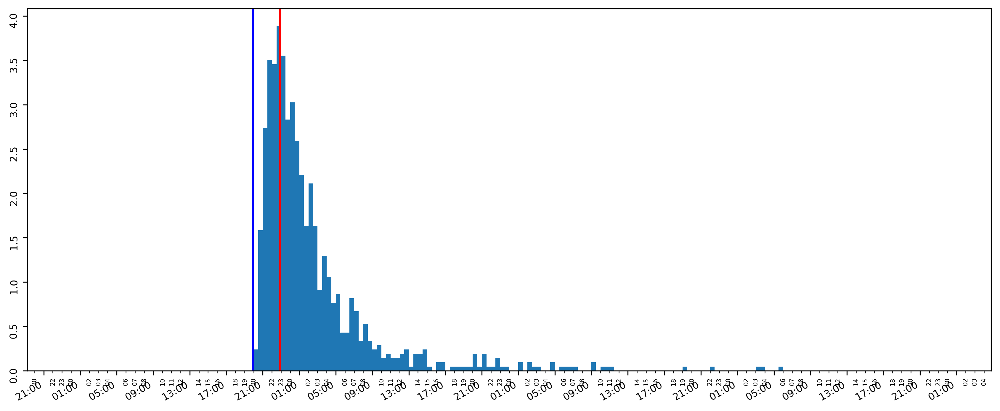

14639 2023-04-27 19:57:46.239000 2023-04-27 22:53:00.265000 [2.76281048] 0.0 2023-04-27 20:17:55.539589 2023-04-30 05:50:55.026317 2 days, 9:32:59.486728
15412


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


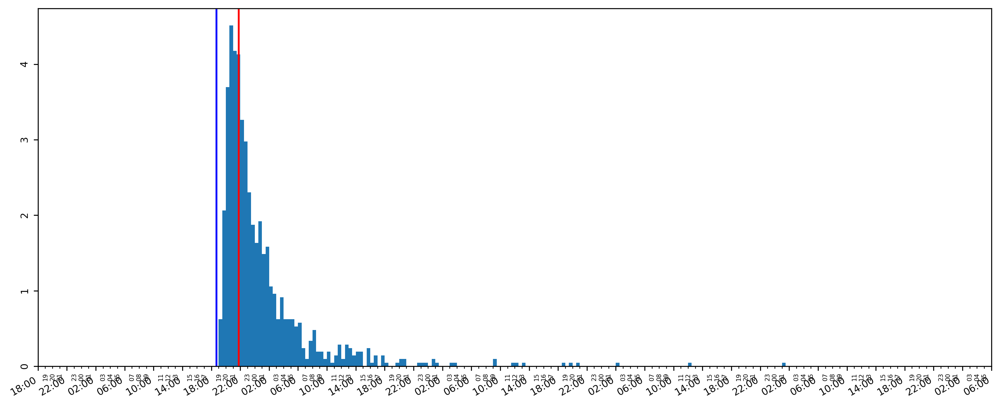

15412 2023-05-04 18:43:01.930000 2023-05-04 21:47:26.078000 [2.89571738] 0.0 2023-05-04 19:11:44.484751 2023-05-08 01:29:37.182347 3 days, 6:17:52.697596
12382


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


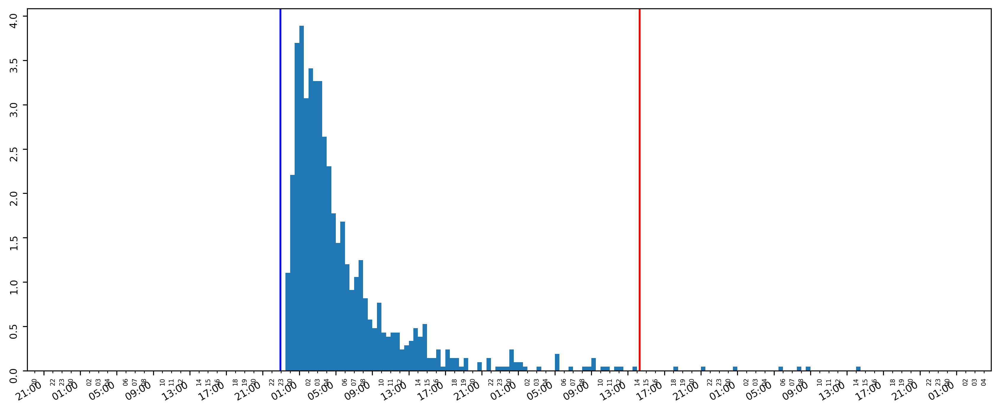

12382 2023-04-12 22:55:15.711000 2023-04-14 14:17:43.938000 [0.0119325] 0.0 2023-04-12 23:36:29.414210 2023-04-15 14:22:43.521491 2 days, 14:46:14.107281
14886


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


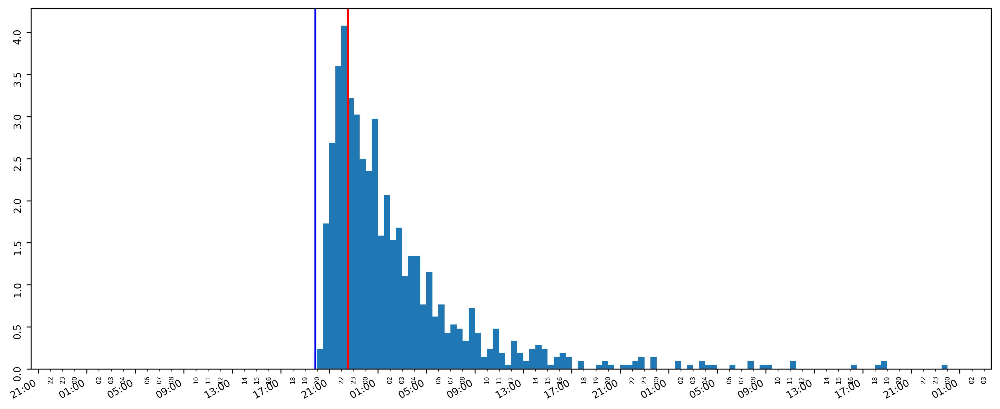

14886 2023-04-28 19:51:29.394000 2023-04-28 22:30:56.336000 [2.61340336] 0.0 2023-04-28 20:17:32.060363 2023-04-30 23:42:07.914476 2 days, 3:24:35.854113
14667


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


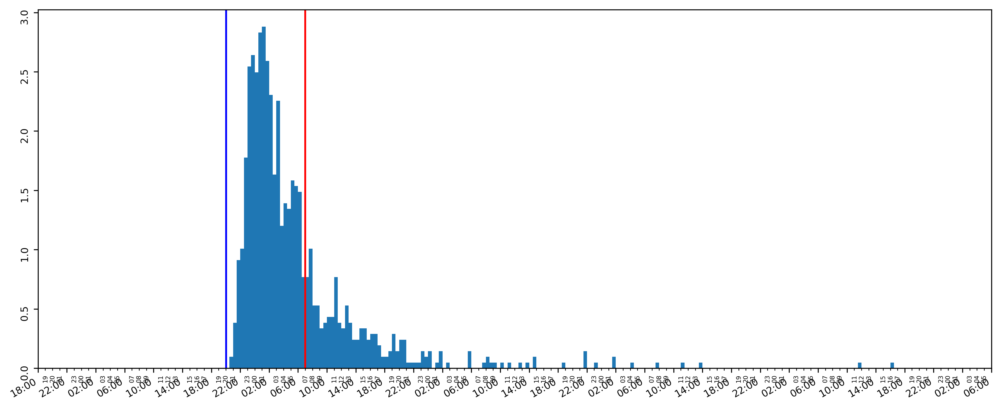

14667 2023-04-27 20:03:38.601000 2023-04-28 07:00:42.666000 [1.01157252] 0.0 2023-04-27 20:41:14.477149 2023-05-01 16:21:18.175779 3 days, 19:40:03.698630
12211


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


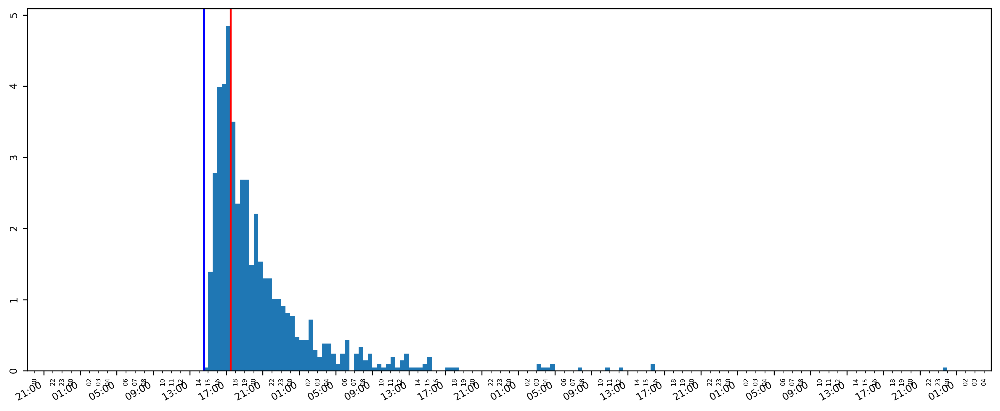

12211 2023-04-12 14:33:00.292000 2023-04-12 17:28:02.705000 [2.94772256] 0.0 2023-04-12 14:59:18.404151 2023-04-15 23:39:08.697126 3 days, 8:39:50.292975
16312


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


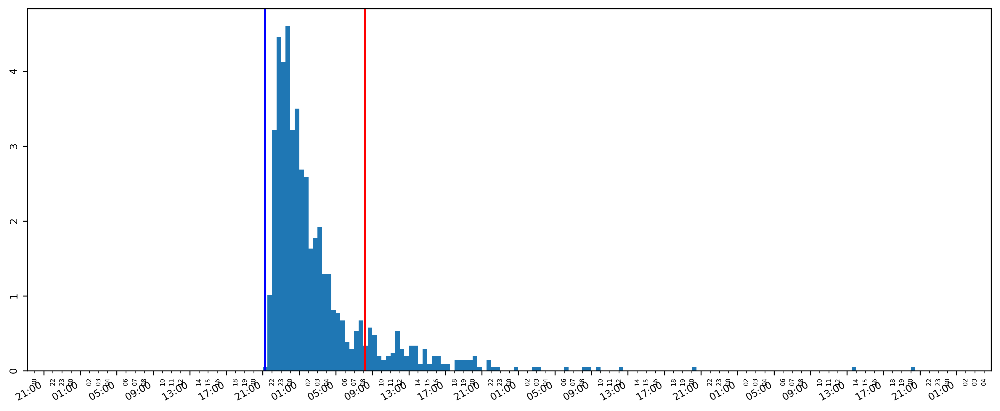

16312 2023-05-15 21:14:13.268000 2023-05-16 08:11:31.810000 [0.44666287] 0.0 2023-05-15 21:29:58.342178 2023-05-18 20:00:21.312536 2 days, 22:30:22.970358
635


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


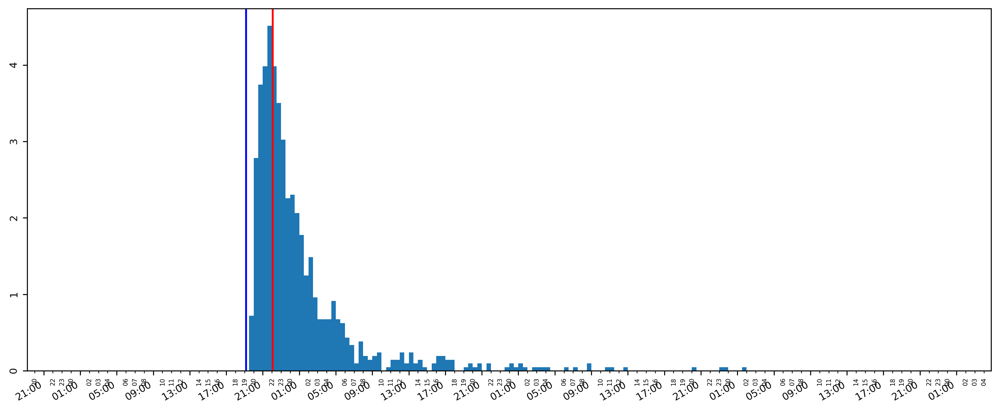

635 2023-04-11 19:09:50.903000 2023-04-11 22:05:42.990000 [3.07227205] 0.0 2023-04-11 19:42:47.339141 2023-04-14 01:50:46.703231 2 days, 6:07:59.364090
11089


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


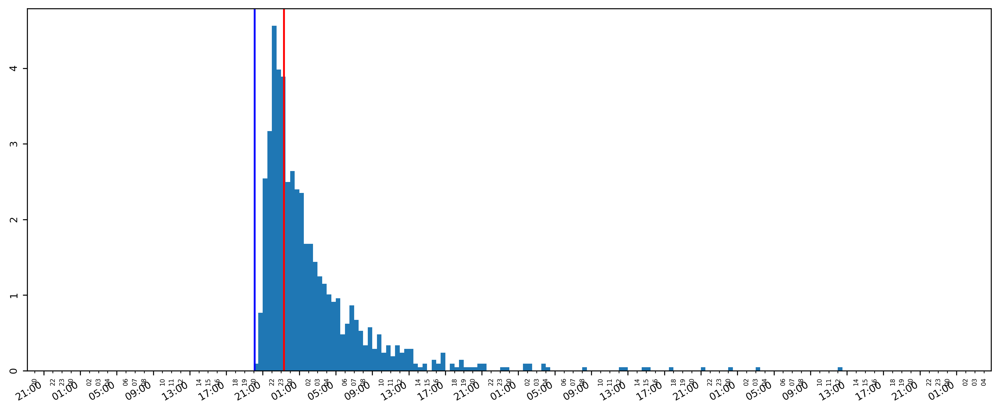

11089 2023-04-06 20:07:24.025000 2023-04-06 23:19:20.954000 [2.84972182] 0.0 2023-04-06 20:22:53.775419 2023-04-09 12:15:56.275586 2 days, 15:53:02.500167
12983


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


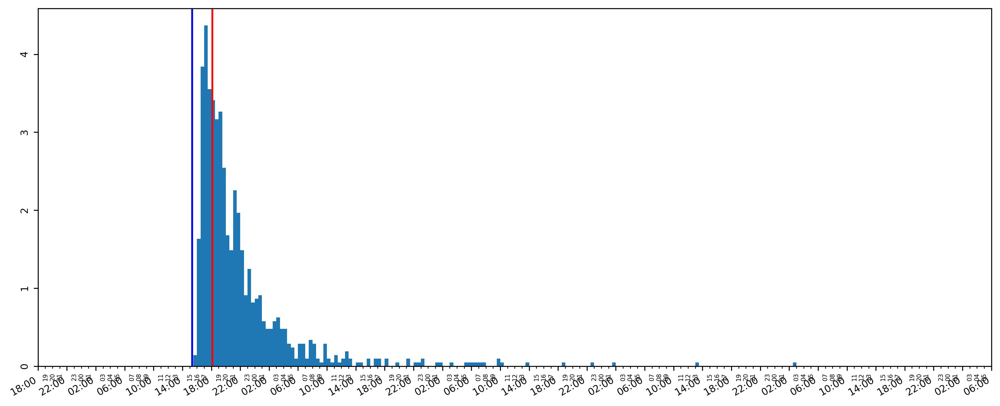

12983 2023-04-17 15:19:50.642000 2023-04-17 18:07:46.973000 [2.62190785] 0.0 2023-04-17 15:42:02.333661 2023-04-21 02:39:33.911359 3 days, 10:57:31.577698
10590


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


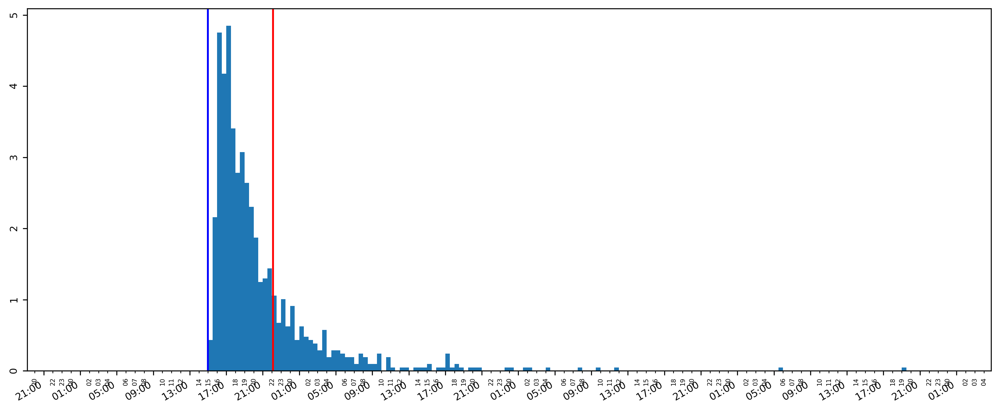

10590 2023-04-04 14:59:52.903000 2023-04-04 22:06:45.408000 [1.22517845] 0.0 2023-04-04 15:20:50.901237 2023-04-07 19:12:35.116847 3 days, 3:51:44.215610
13492


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


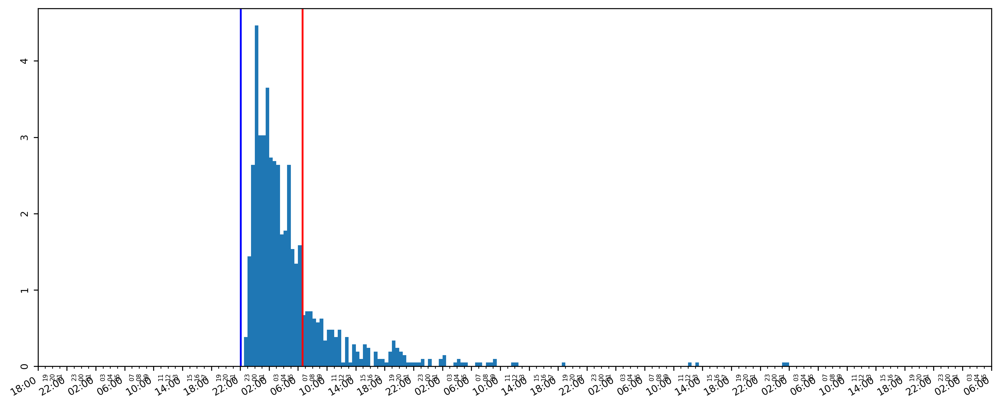

13492 2023-04-19 22:05:34.104000 2023-04-20 06:37:37.174000 [1.18332886] 0.0 2023-04-19 22:41:51.944791 2023-04-23 01:50:05.310389 3 days, 3:08:13.365598
13641


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


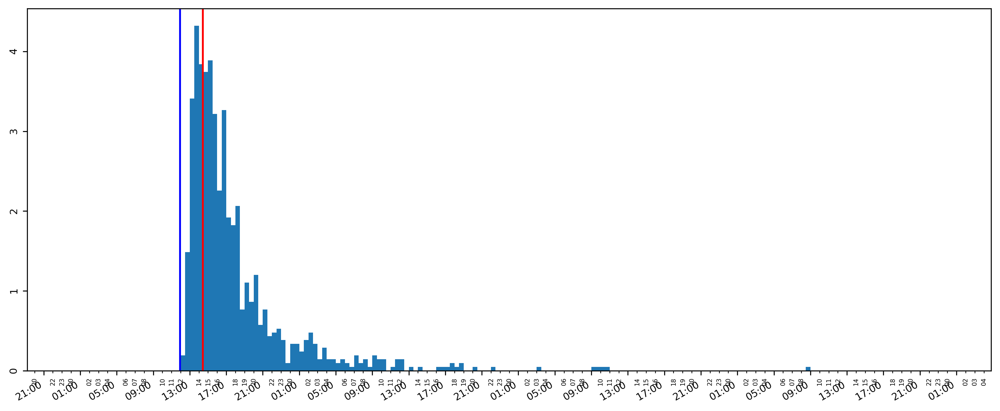

13641 2023-04-21 11:55:45.710000 2023-04-21 14:26:15.366000 [2.989616] 0.0 2023-04-21 12:12:25.818577 2023-04-24 08:56:25.631087 2 days, 20:43:59.812510
15893


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


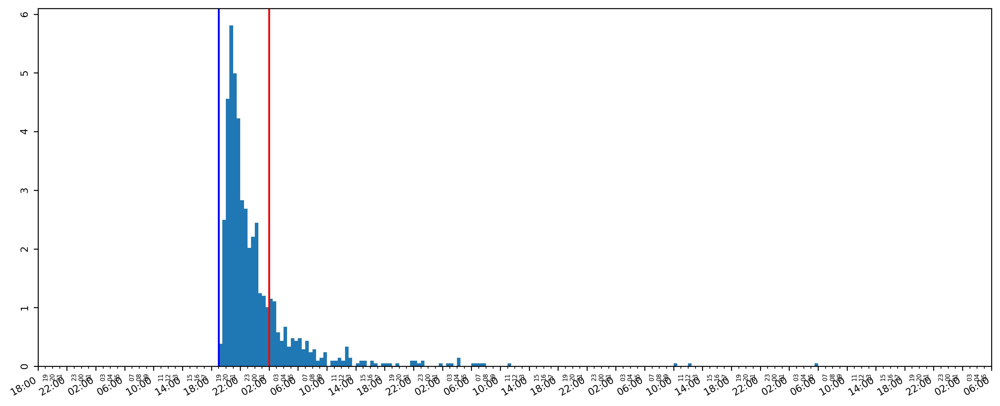

15893 2023-05-09 19:01:29.944000 2023-05-10 02:01:32.466000 [1.18980845] 0.0 2023-05-09 19:19:01.392374 2023-05-13 05:31:22.401568 3 days, 10:12:21.009194
10711


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


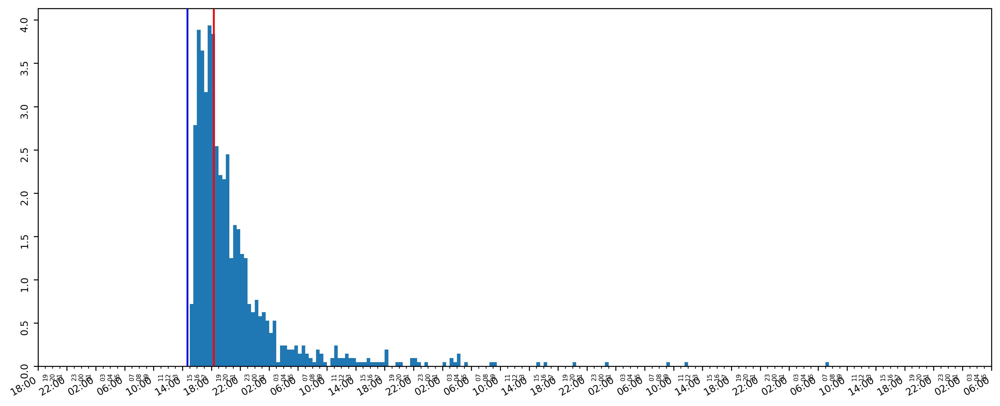

10711 2023-04-05 14:41:02.576000 2023-04-05 18:20:39.126000 [2.64014853] 0.0 2023-04-05 15:04:04.643760 2023-04-09 07:18:11.322605 3 days, 16:14:06.678845
13704


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


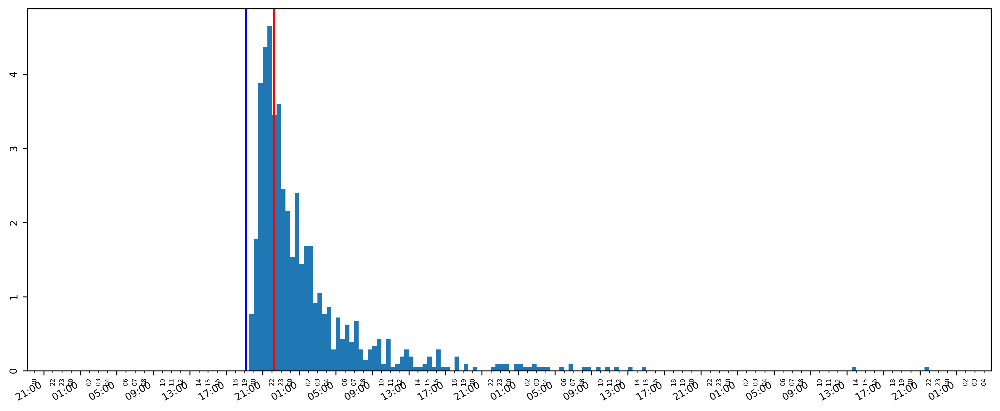

13704 2023-04-21 19:09:41.315000 2023-04-21 22:15:12.121000 [2.84361248] 12.132552337646485 2023-04-21 19:37:03.877684 2023-04-24 21:46:38.564756 3 days, 2:09:34.687072
14811


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


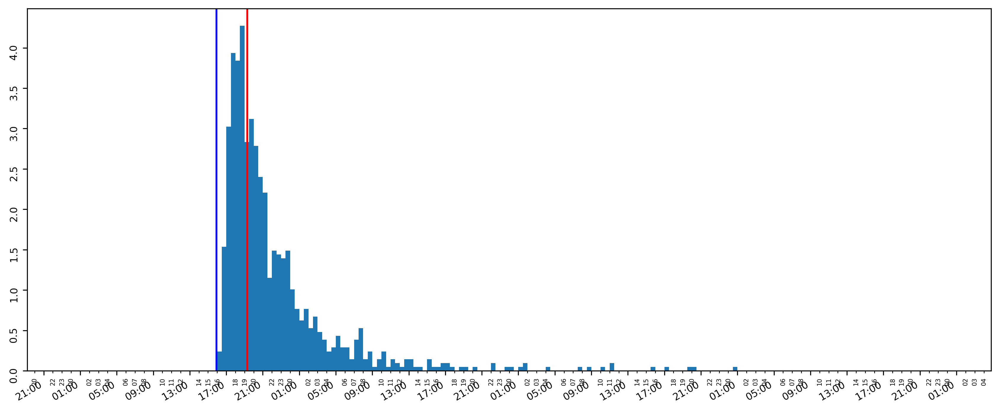

14811 2023-04-28 15:55:31.557000 2023-04-28 19:17:39.105000 [2.82066265] 0.0 2023-04-28 16:19:36.730383 2023-05-01 00:40:14.378196 2 days, 8:20:37.647813
11235


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


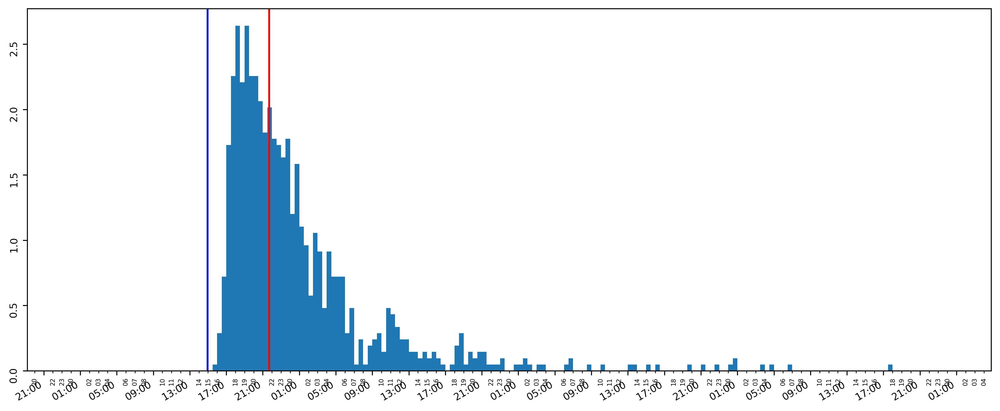

11235 2023-04-07 14:56:20.406000 2023-04-07 21:42:53.575000 [1.84944227] 0.0 2023-04-07 15:49:25.081363 2023-04-10 17:53:06.832701 3 days, 2:03:41.751338
17906


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


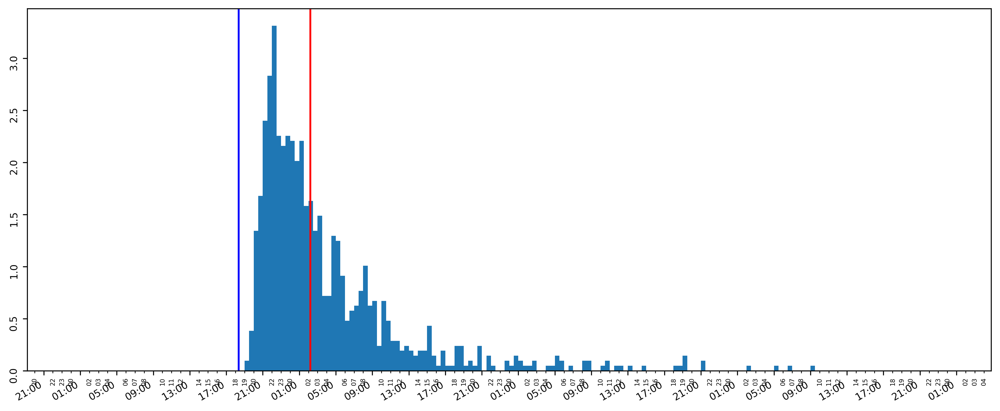

17906 2023-06-09 18:21:48.357000 2023-06-10 02:12:08.902000 [1.61054194] 0.0 2023-06-09 19:14:41.246800 2023-06-12 09:11:31.169717 2 days, 13:56:49.922917
17897


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


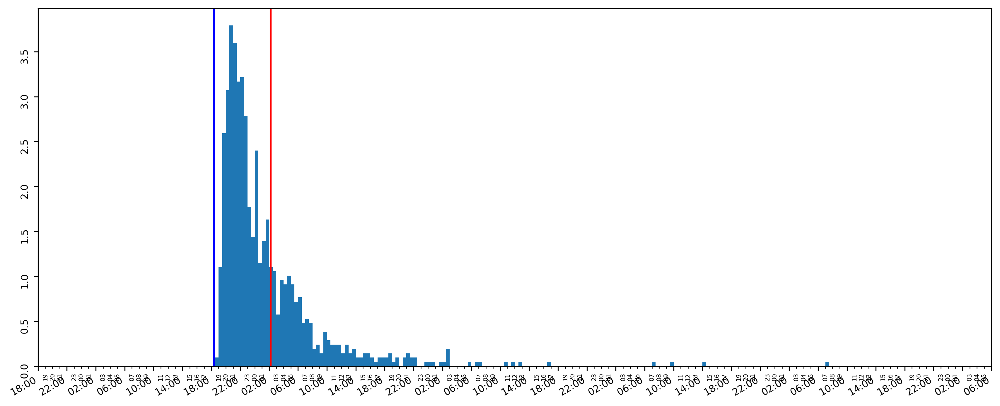

17897 2023-06-09 18:20:23.266000 2023-06-10 02:11:45.365000 [1.28615706] 0.0 2023-06-09 18:47:49.714645 2023-06-13 07:27:21.630734 3 days, 12:39:31.916089
12346


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


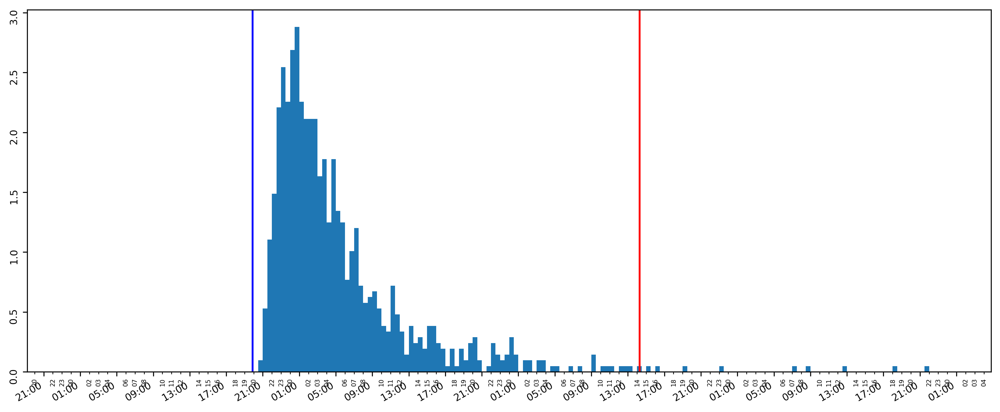

12346 2023-04-12 19:52:02.106000 2023-04-14 14:17:42.974000 [0.02631496] 0.0 2023-04-12 20:54:29.589773 2023-04-15 21:50:55.810423 3 days, 0:56:26.220650
11136


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


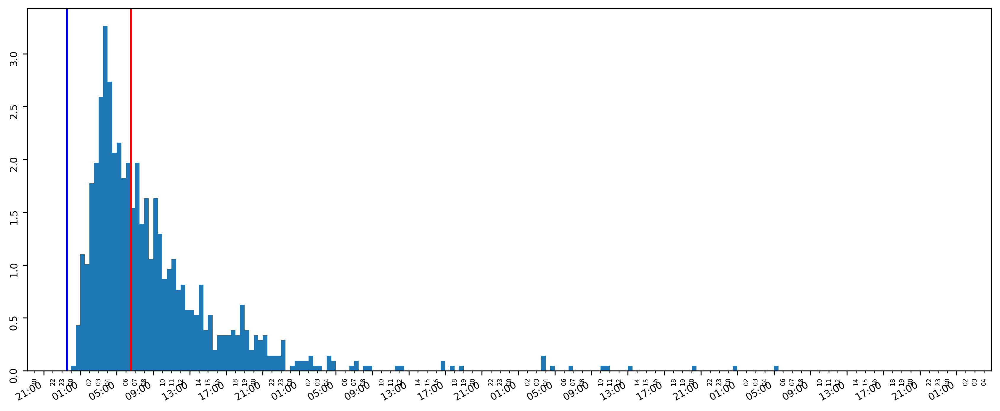

11136 2023-04-06 23:34:04.172000 2023-04-07 06:35:33.665000 [1.81306942] 0.0 2023-04-07 00:25:52.871471 2023-04-10 05:10:10.347281 3 days, 4:44:17.475810
12702


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


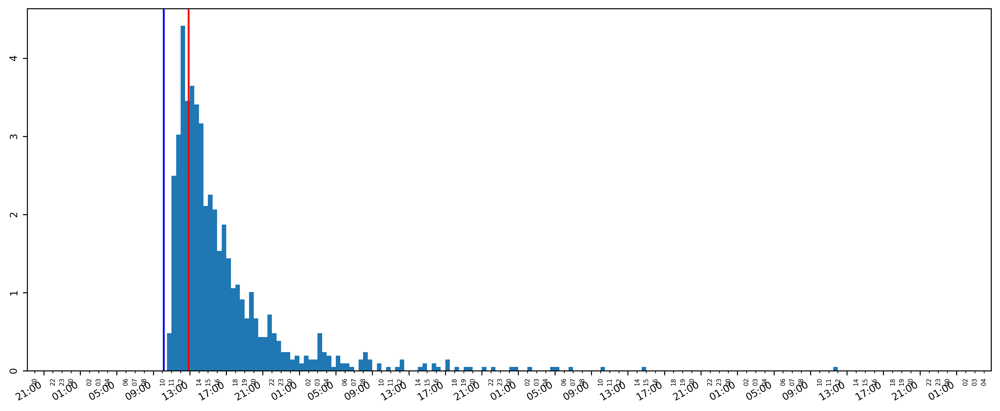

12702 2023-04-15 10:09:29.670000 2023-04-15 12:51:50.883000 [2.76503241] 0.0 2023-04-15 10:34:11.397037 2023-04-18 11:40:21.381669 3 days, 1:06:09.984632
10774


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


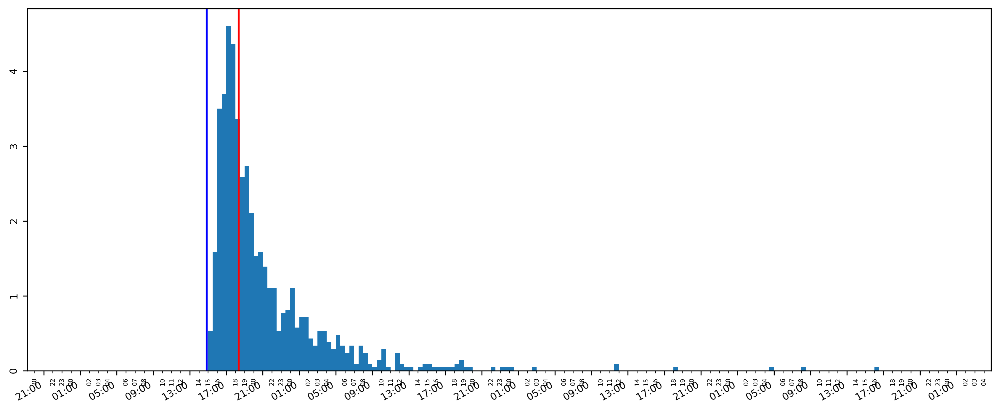

10774 2023-04-05 14:51:17.066000 2023-04-05 18:20:39.144000 [2.84762831] 0.0 2023-04-05 15:11:27.176448 2023-04-08 16:00:31.455081 3 days, 0:49:04.278633
10524


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


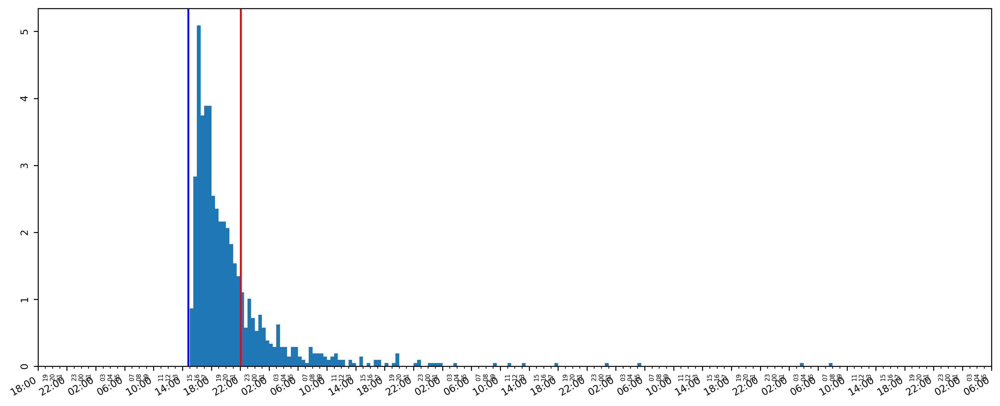

10524 2023-04-04 14:49:28.778000 2023-04-04 22:05:30.645000 [1.29637201] 0.0 2023-04-04 15:08:58.662250 2023-04-08 07:30:04.101118 3 days, 16:21:05.438868
546


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


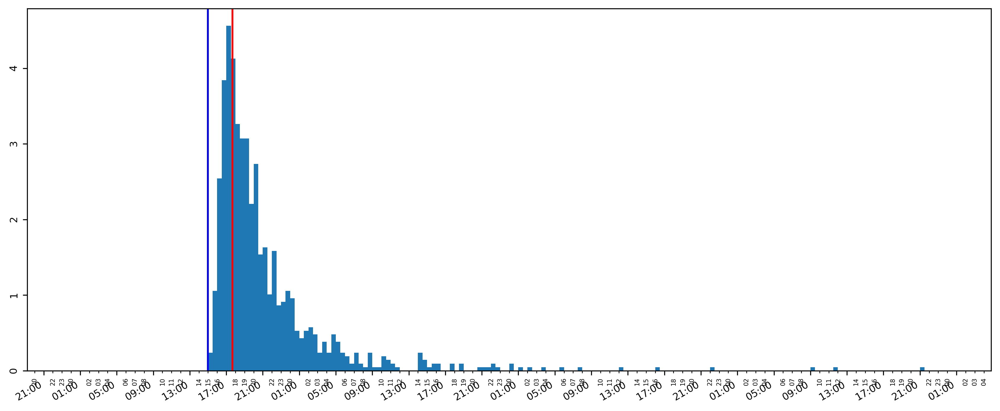

546 2023-04-11 14:59:01.080000 2023-04-11 17:41:10.978000 [2.8021087] 0.0 2023-04-11 15:17:15.074636 2023-04-14 21:17:53.265784 3 days, 6:00:38.191148
15973


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


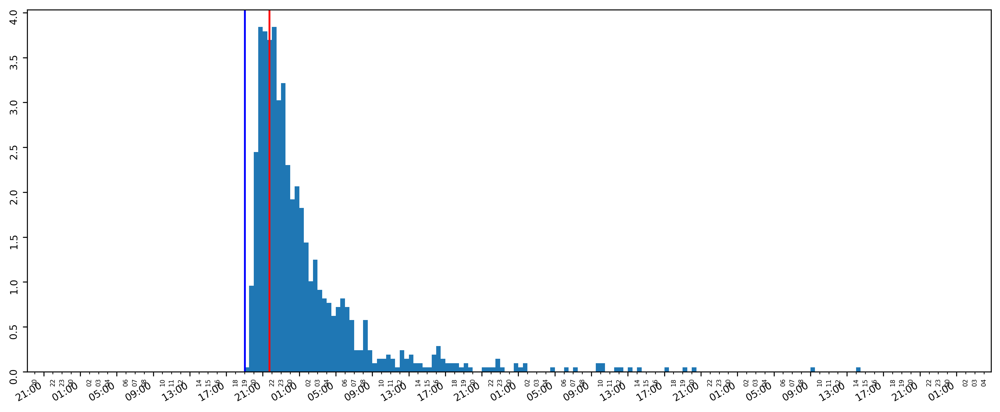

15973 2023-05-10 19:03:02.023000 2023-05-10 21:43:01.947000 [2.72130604] 0.0 2023-05-10 19:26:42.562036 2023-05-13 14:04:15.671404 2 days, 18:37:33.109368
14511


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


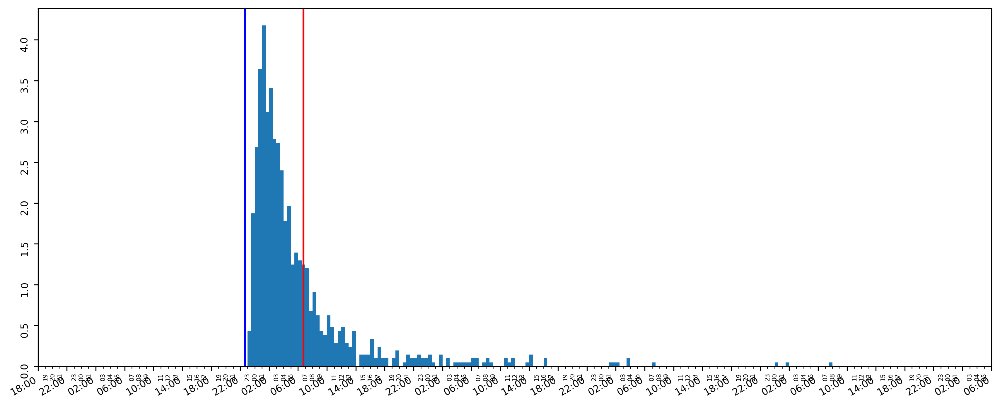

14511 2023-04-26 22:39:25.853000 2023-04-27 06:45:49.865000 [1.2421665] 0.0 2023-04-26 23:00:16.175719 2023-04-30 07:52:45.135935 3 days, 8:52:28.960216
14535


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


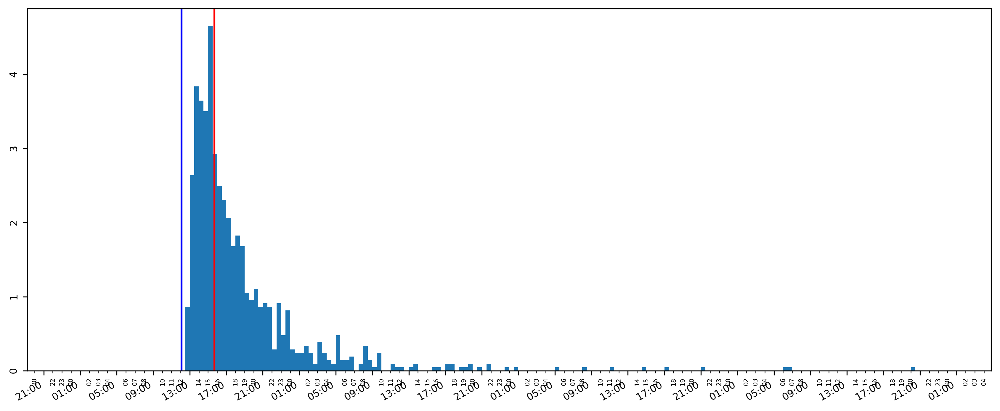

14535 2023-04-27 12:05:55.328000 2023-04-27 15:41:04.992000 [2.69109073] 0.0 2023-04-27 12:34:09.695879 2023-04-30 20:19:21.358926 3 days, 7:45:11.663047
14884


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


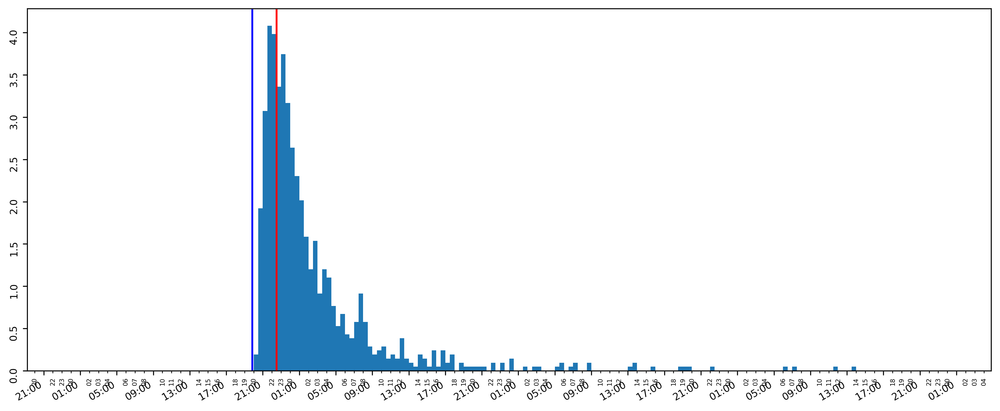

14884 2023-04-28 19:51:10.965000 2023-04-28 22:30:56.156000 [2.65425735] 0.0 2023-04-28 20:17:53.672651 2023-05-01 13:52:44.042966 2 days, 17:34:50.370315
13202


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


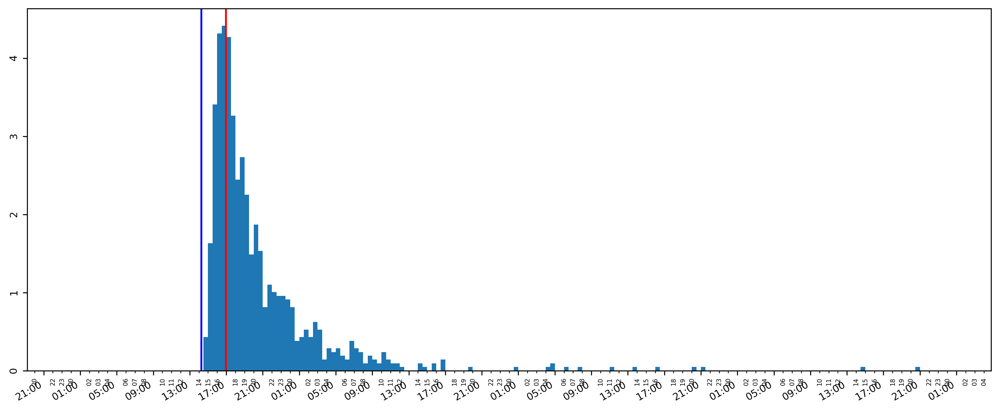

13202 2023-04-18 14:16:41.851000 2023-04-18 16:58:17.393000 [2.84321834] 0.0 2023-04-18 14:34:31.197045 2023-04-21 20:54:41.520372 3 days, 6:20:10.323327
12444


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


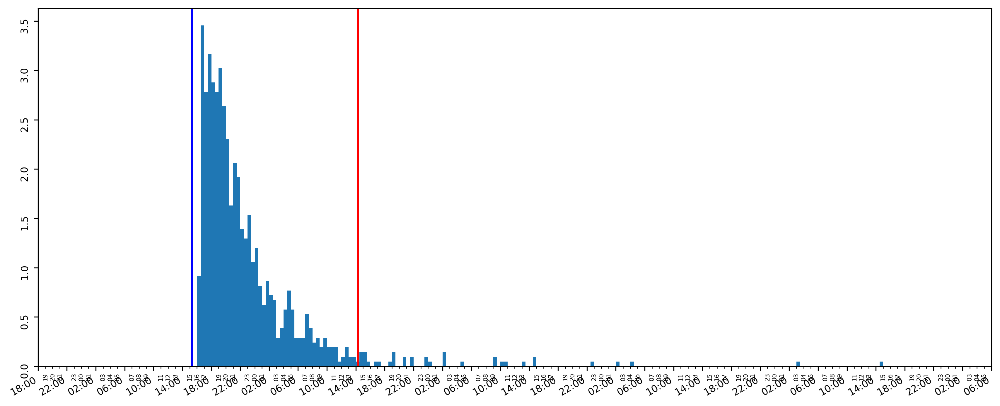

12444 2023-04-13 15:18:10.539000 2023-04-14 14:17:47.577000 [0.09449956] 0.0 2023-04-13 16:04:14.295357 2023-04-17 14:41:43.718739 3 days, 22:37:29.423382
15506


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


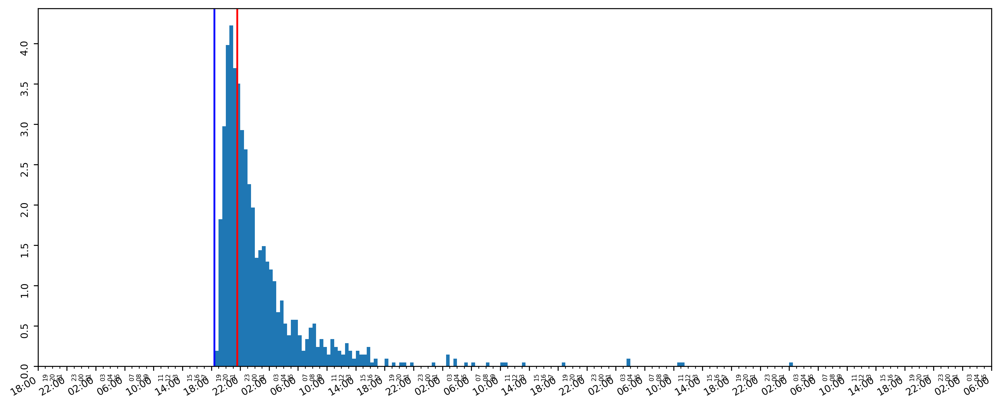

15506 2023-05-05 18:25:19.998000 2023-05-05 21:33:58.904000 [2.76806292] 0.0 2023-05-05 18:49:07.697920 2023-05-09 02:11:08.883307 3 days, 7:22:01.185387
14552


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


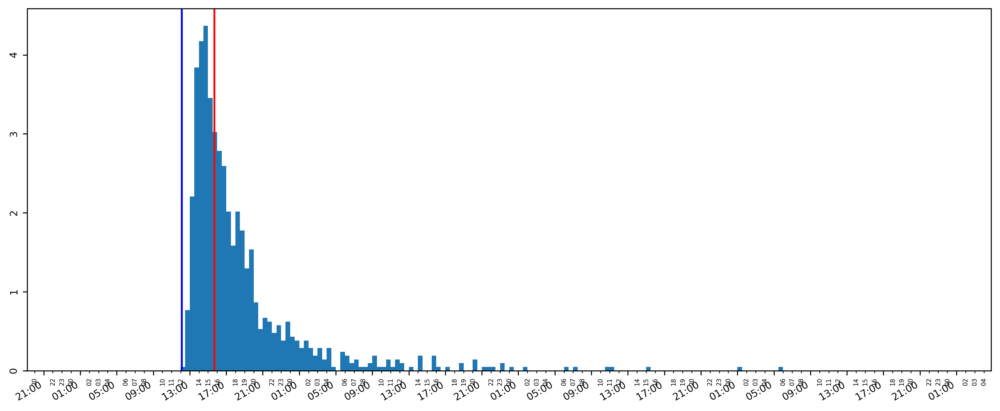

14552 2023-04-27 12:07:43.611000 2023-04-27 15:41:05.424000 [2.81807049] 0.0 2023-04-27 12:26:34.844157 2023-04-30 05:37:47.719038 2 days, 17:11:12.874881
11269


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


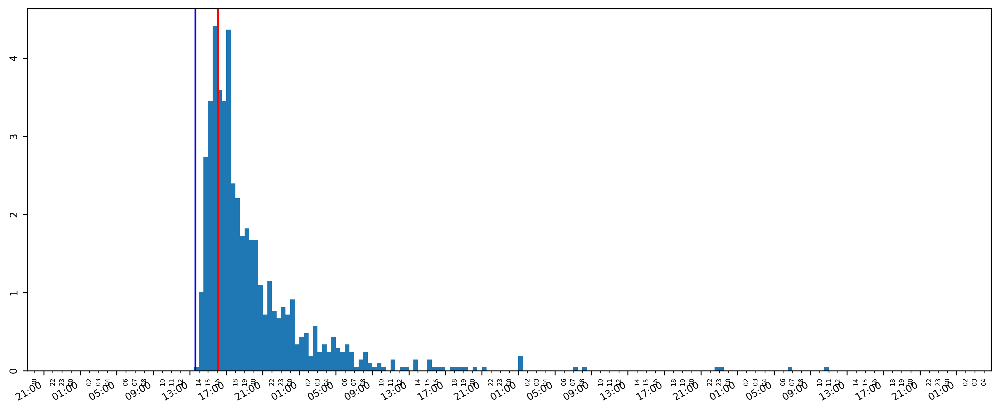

11269 2023-04-09 13:38:12.963000 2023-04-09 16:07:39.605000 [2.84377855] 0.0 2023-04-09 13:54:47.953794 2023-04-12 10:48:58.027067 2 days, 20:54:10.073273
15618


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


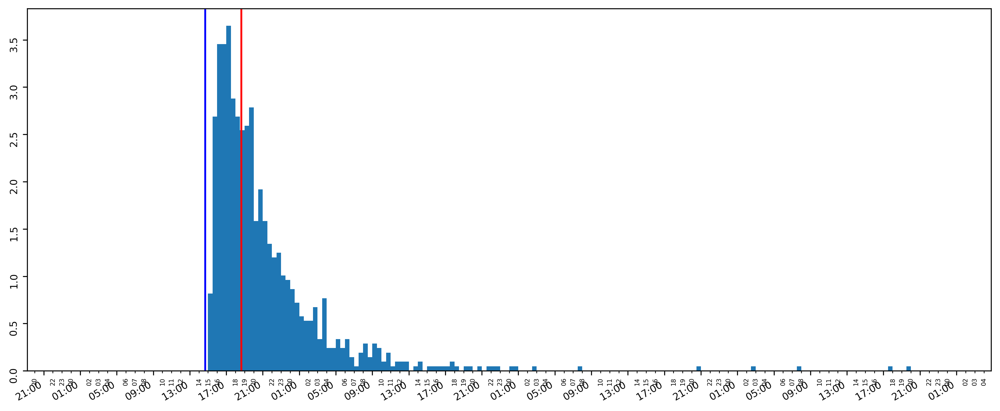

15618 2023-05-08 14:41:32.853000 2023-05-08 18:39:37.749000 [2.51431946] 0.0 2023-05-08 15:04:12.606565 2023-05-11 19:45:40.626644 3 days, 4:41:28.020079
16698


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


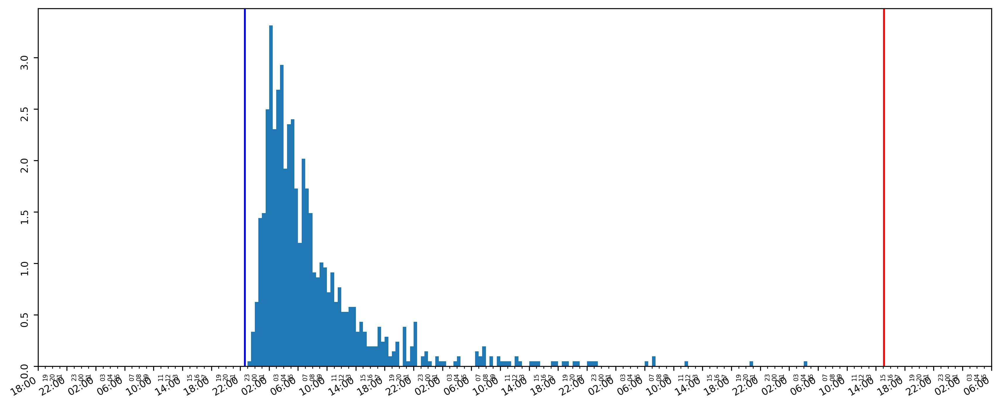

16698 2023-05-22 22:38:24.131000 2023-05-26 15:08:08.435000 [1.14480964e-08] 0.0 2023-05-22 23:15:58.713163 2023-05-26 04:13:22.436755 3 days, 4:57:23.723592
16500


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


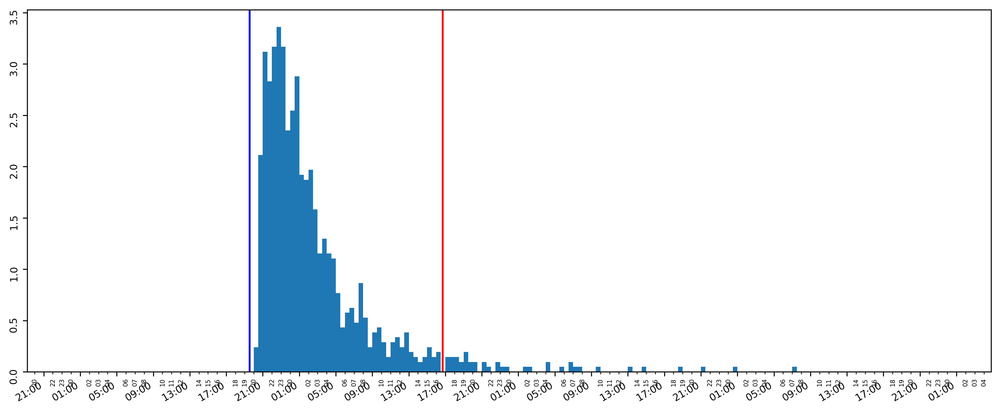

16500 2023-05-19 19:32:52.298000 2023-05-20 16:43:30.205000 [0.13661658] 0.0 2023-05-19 20:01:10.291269 2023-05-22 07:15:47.046641 2 days, 11:14:36.755372
16768


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


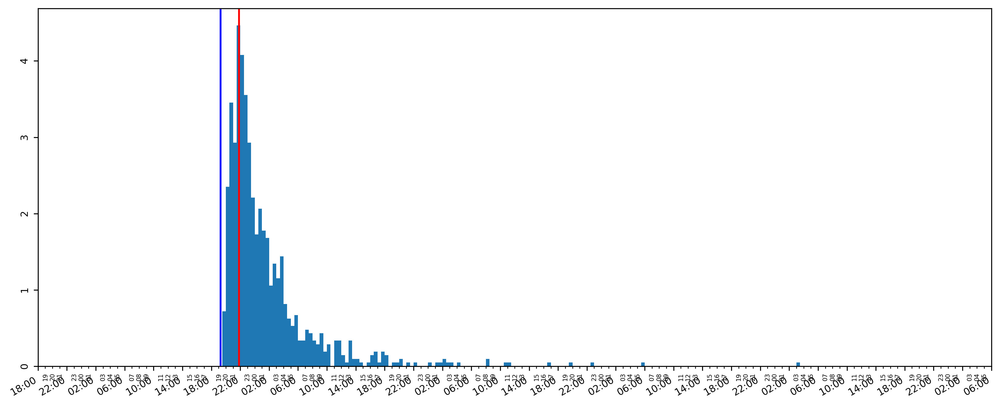

16768 2023-05-23 19:15:39.801000 2023-05-23 21:50:14.549000 [2.8114727] 13.335720062255865 2023-05-23 19:48:30.451111 2023-05-27 03:07:17.253250 3 days, 7:18:46.802139
15206


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


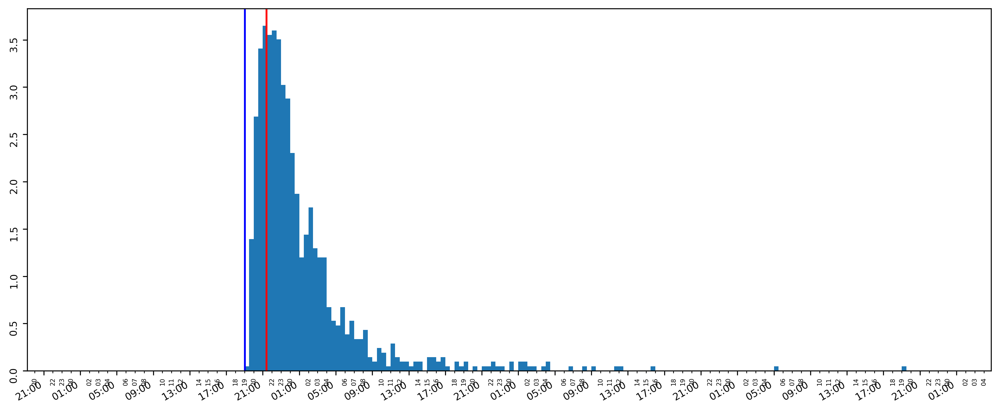

15206 2023-05-02 19:03:16.211000 2023-05-02 21:24:52.861000 [2.760231] 0.0 2023-05-02 19:26:21.333437 2023-05-05 19:14:57.594744 2 days, 23:48:36.261307
10057


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


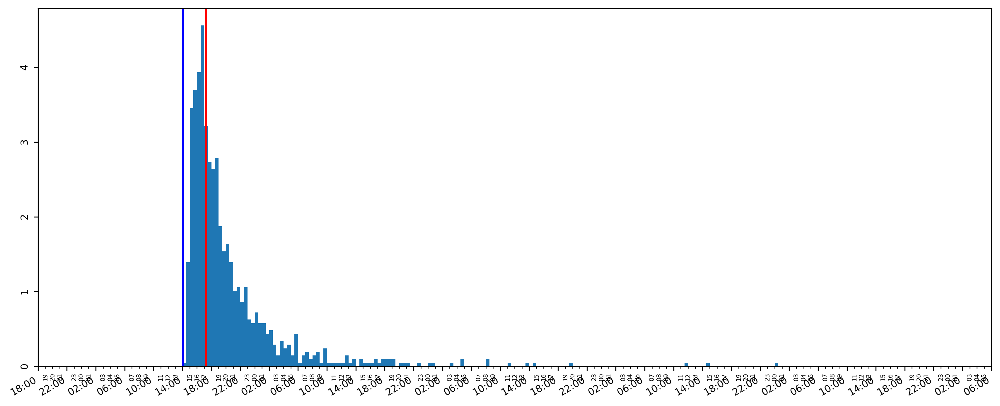

10057 2023-04-03 14:03:01.365000 2023-04-03 17:13:51.655000 [2.72793223] 0.0 2023-04-03 14:21:51.702040 2023-04-07 00:22:43.357485 3 days, 10:00:51.655445
16020


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


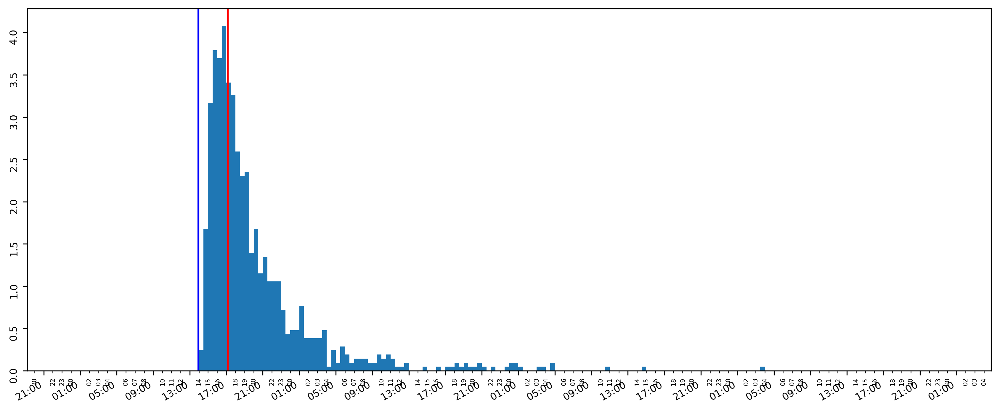

16020 2023-05-11 13:57:17.134000 2023-05-11 17:08:57.414000 [2.93139613] 70.18154296875002 2023-05-11 14:17:11.432690 2023-05-14 03:57:11.807997 2 days, 13:40:00.375307
16990


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


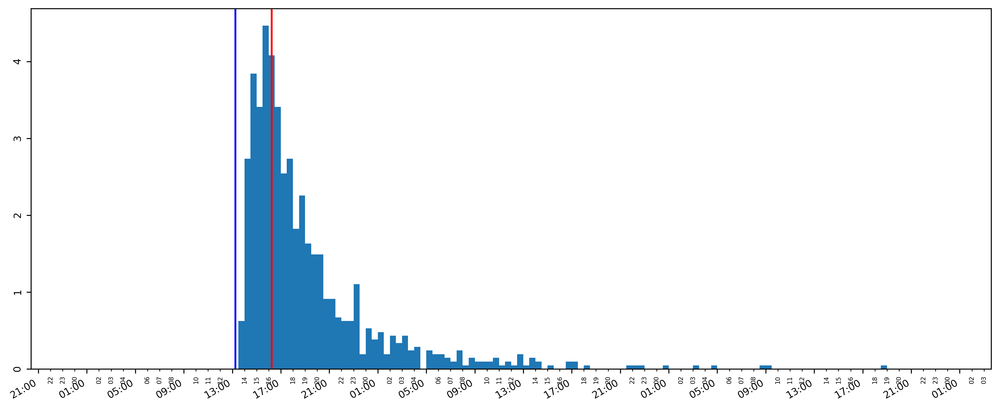

16990 2023-05-27 13:15:11.214000 2023-05-27 16:15:24.941000 [3.11947706] 0.0 2023-05-27 13:48:37.782242 2023-05-29 18:40:28.759072 2 days, 4:51:50.976830
13808


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


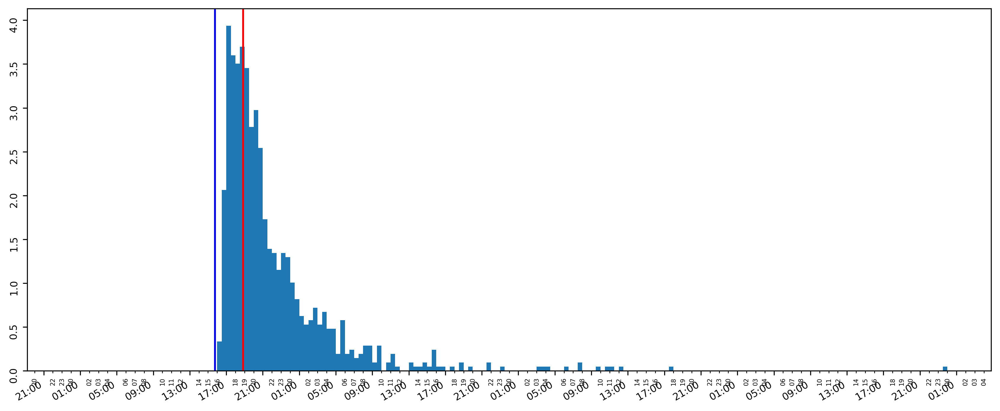

13808 2023-04-22 15:46:13.701000 2023-04-22 18:50:41.047000 [2.86041024] 0.0 2023-04-22 16:22:49.859112 2023-04-25 23:48:25.306756 3 days, 7:25:35.447644
11261


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


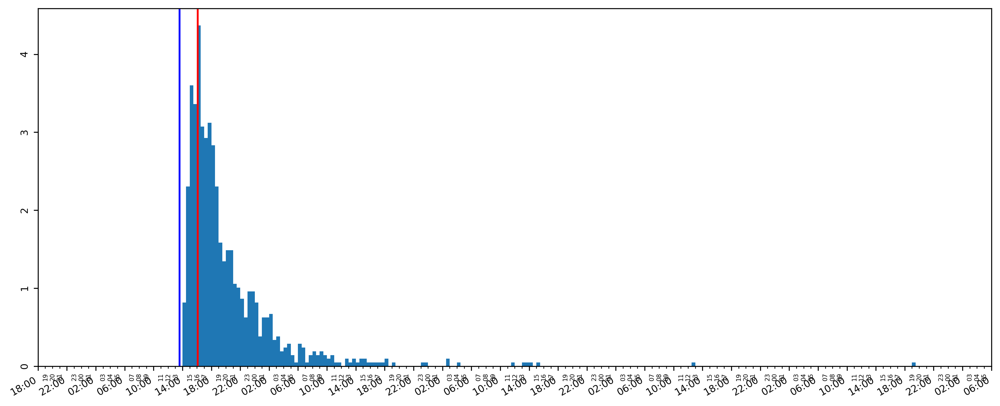

11261 2023-04-09 13:36:58.788000 2023-04-09 16:07:39.716000 [2.59375203] 0.0 2023-04-09 14:02:17.047548 2023-04-13 19:00:43.859070 4 days, 4:58:26.811522
16498


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


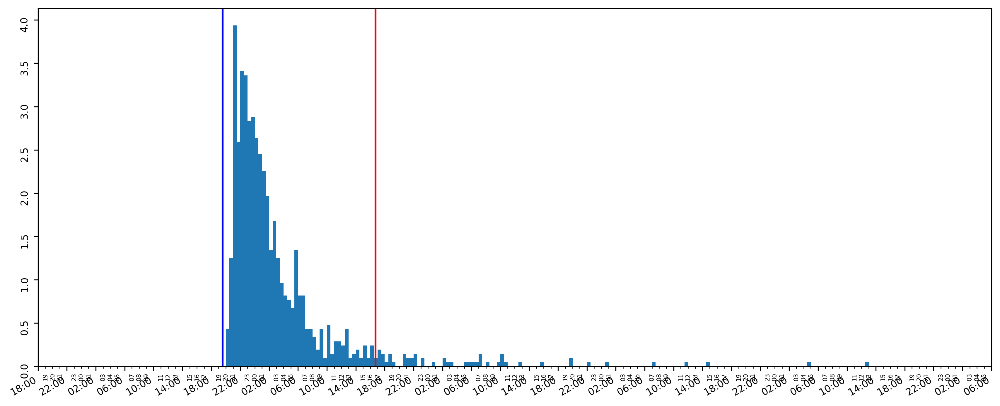

16498 2023-05-19 19:32:37.826000 2023-05-20 16:43:30.535000 [0.13966773] 0.0 2023-05-19 20:05:06.424988 2023-05-23 12:32:27.711993 3 days, 16:27:21.287005
17173


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


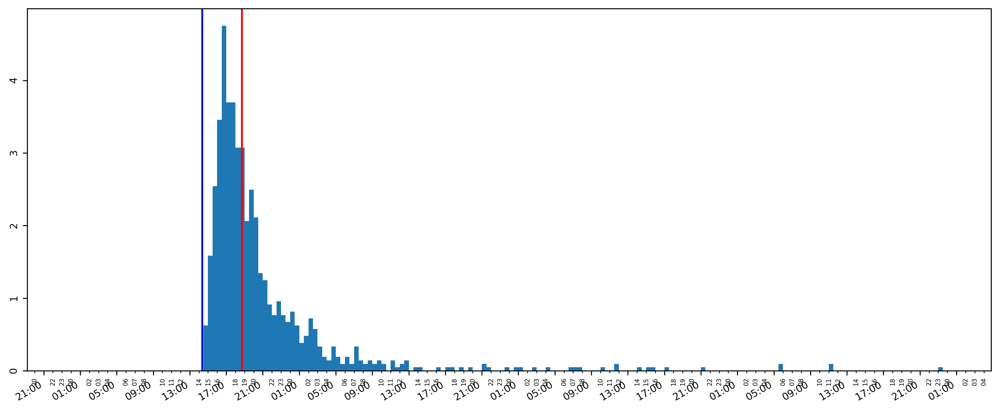

17173 2023-06-01 14:22:23.478000 2023-06-01 18:43:43.361000 [2.5637013] 0.0 2023-06-01 14:38:21.935815 2023-06-04 23:18:38.473855 3 days, 8:40:16.538040
13150


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


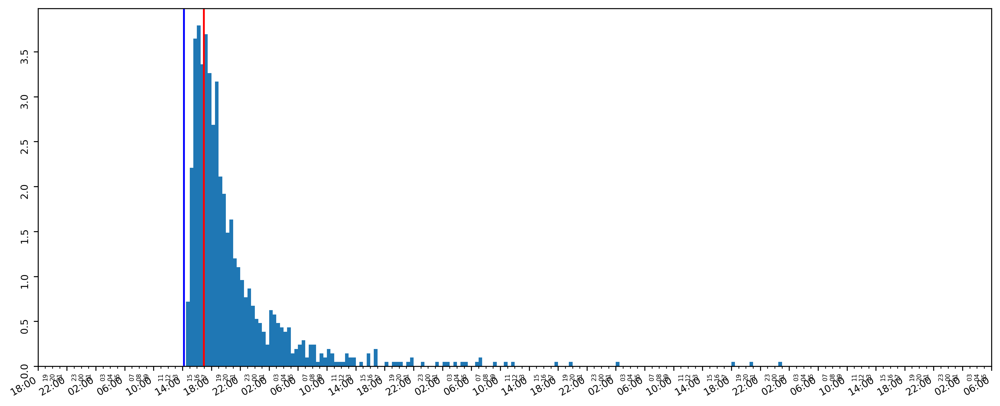

13150 2023-04-18 14:11:27.878000 2023-04-18 16:58:17.778000 [2.53899623] 0.0 2023-04-18 14:36:40.671679 2023-04-22 00:31:23.313722 3 days, 9:54:42.642043
12395


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


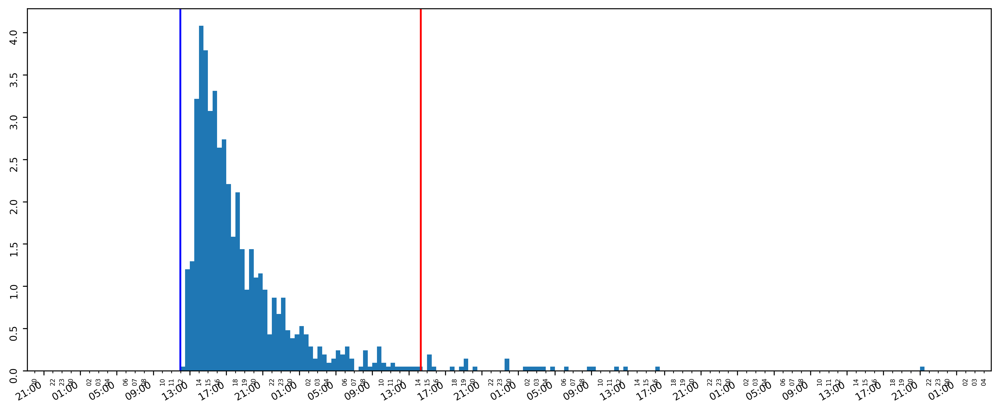

12395 2023-04-13 11:57:18.576000 2023-04-14 14:17:46.111000 [0.05384955] 0.0 2023-04-13 12:28:58.339419 2023-04-16 21:28:44.268276 3 days, 8:59:45.928857
17052


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


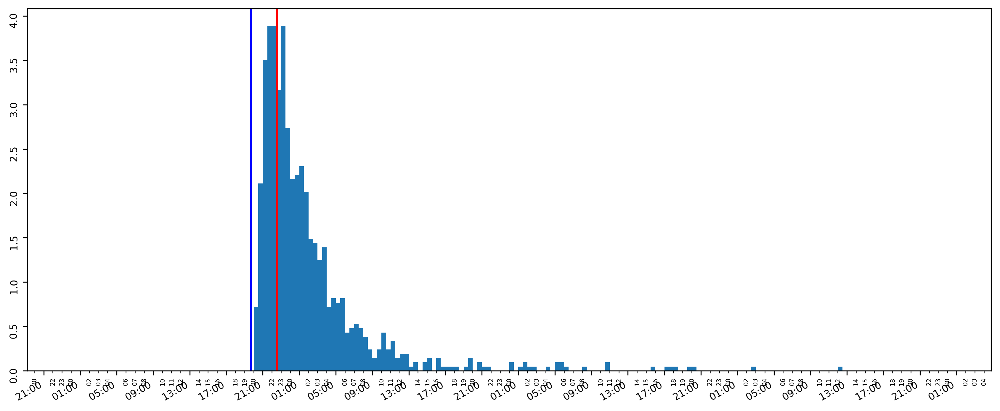

17052 2023-05-30 19:40:53.743000 2023-05-30 22:32:06.562000 [2.7973318] 0.0 2023-05-30 20:05:30.359947 2023-06-02 12:05:57.334637 2 days, 16:00:26.974690
13286


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


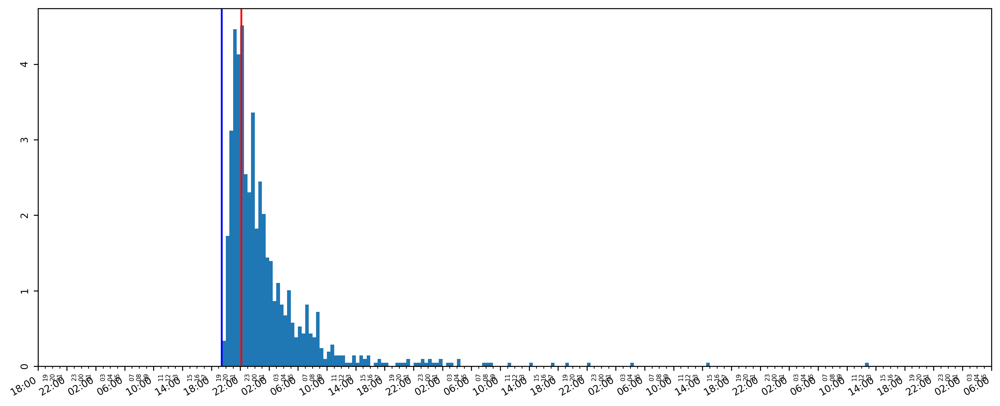

13286 2023-04-18 19:25:42.925000 2023-04-18 22:09:36.441000 [2.78179439] 0.0 2023-04-18 19:46:28.484863 2023-04-22 12:32:40.460984 3 days, 16:46:11.976121
13961


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


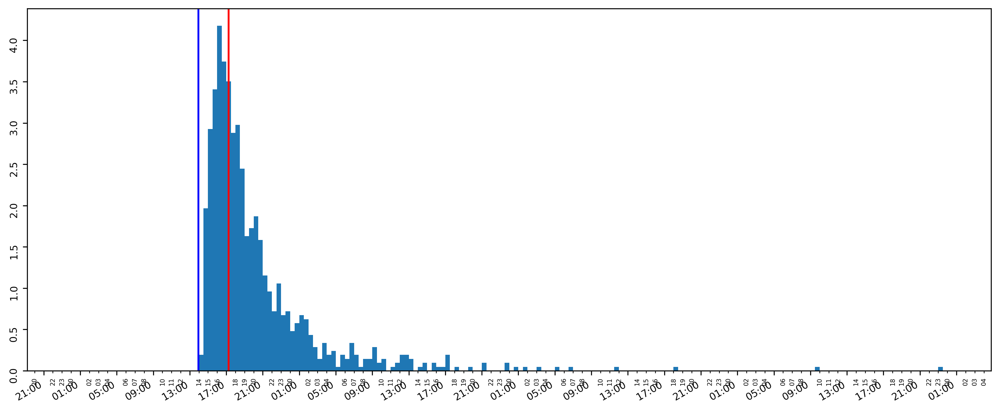

13961 2023-04-23 13:56:00.391000 2023-04-23 17:15:16.716000 [2.83549017] 0.0 2023-04-23 14:12:39.555613 2023-04-26 23:09:41.190422 3 days, 8:57:01.634809
14679


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


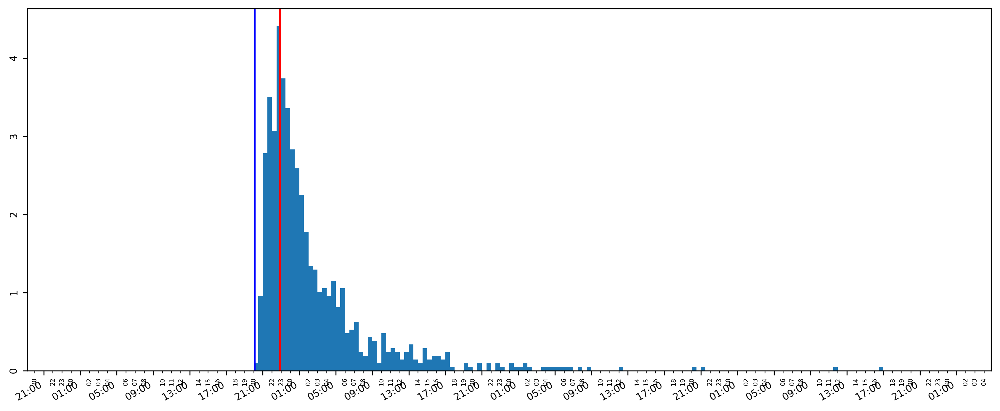

14679 2023-04-27 20:06:30.403000 2023-04-27 22:52:59.937000 [2.81930272] 0.0 2023-04-27 20:24:34.958804 2023-04-30 16:55:46.578896 2 days, 20:31:11.620092
16122


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


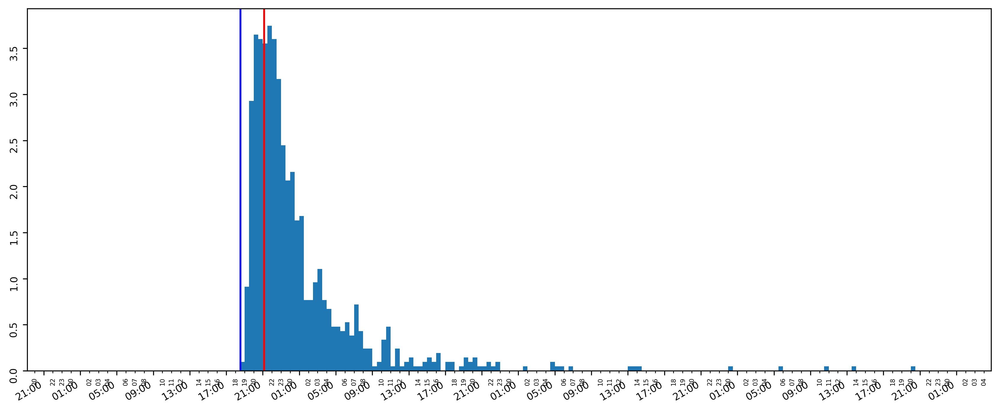

16122 2023-05-12 18:32:55.212000 2023-05-12 21:09:45.431000 [2.73948458] 0.0 2023-05-12 18:50:55.887124 2023-05-15 20:00:41.451293 3 days, 1:09:45.564169
15278


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


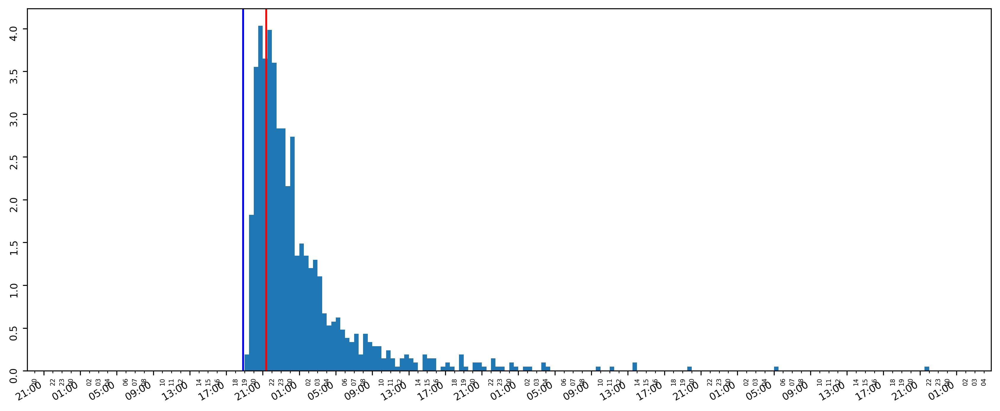

15278 2023-05-03 18:51:18.044000 2023-05-03 21:21:52.041000 [2.86257305] 0.0 2023-05-03 19:04:30.704189 2023-05-06 21:32:11.286064 3 days, 2:27:40.581875
16364


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


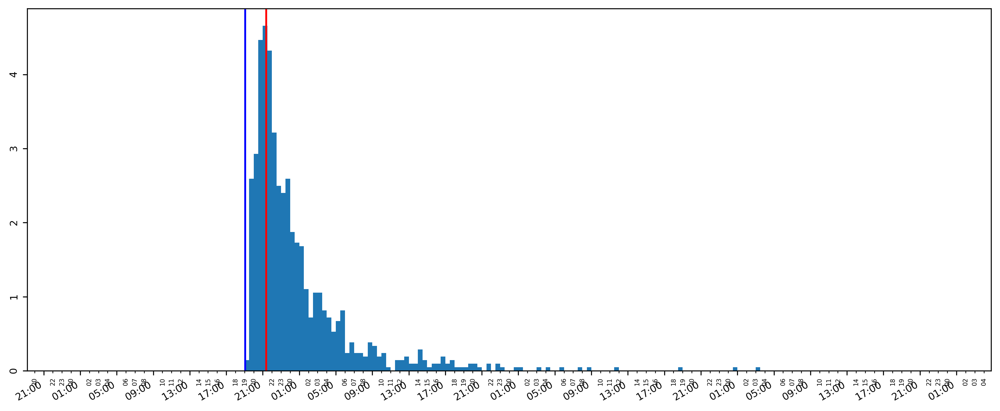

16364 2023-05-16 19:04:53.948000 2023-05-16 21:22:24.107000 [3.08075265] 0.0 2023-05-16 19:23:50.921617 2023-05-19 03:17:28.745936 2 days, 7:53:37.824319
12771


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


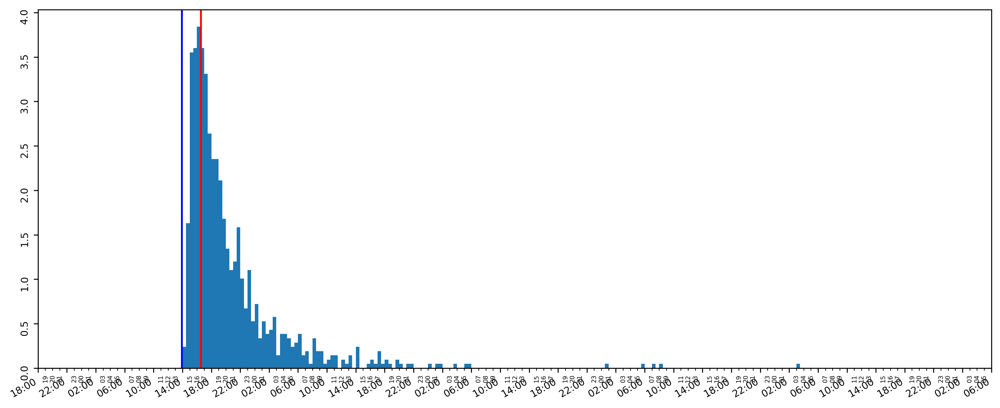

12771 2023-04-15 13:56:02.002000 2023-04-15 16:32:23.287000 [2.56354166] 0.0 2023-04-15 14:10:26.352206 2023-04-19 03:07:57.277166 3 days, 12:57:30.924960
12323


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


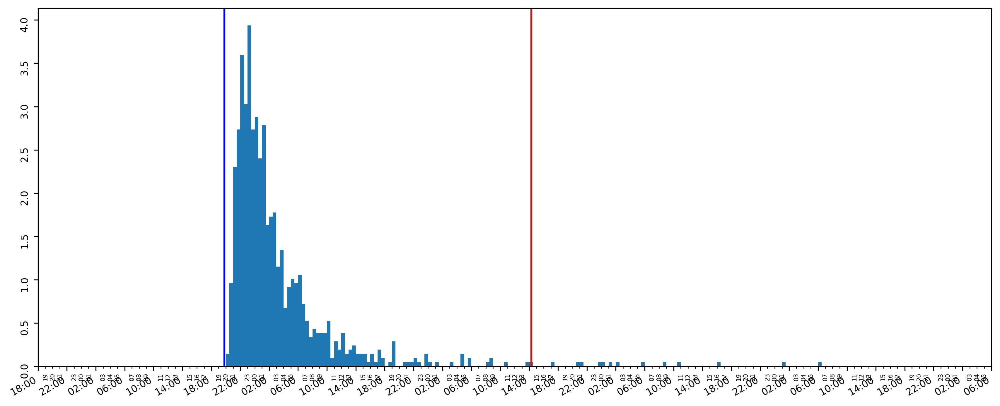

12323 2023-04-12 19:48:28.943000 2023-04-14 14:17:42.330000 [0.01214977] 0.0 2023-04-12 20:26:15.187585 2023-04-16 06:08:43.790550 3 days, 9:42:28.602965
15225


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


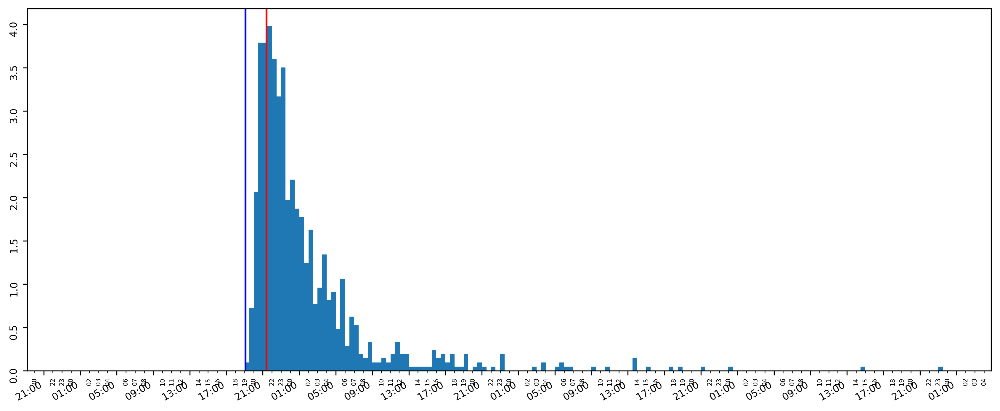

15225 2023-05-02 19:06:15.628000 2023-05-02 21:24:54.035000 [2.55183196] 0.0 2023-05-02 19:22:23.983248 2023-05-05 23:12:31.442170 3 days, 3:50:07.458922
16451


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


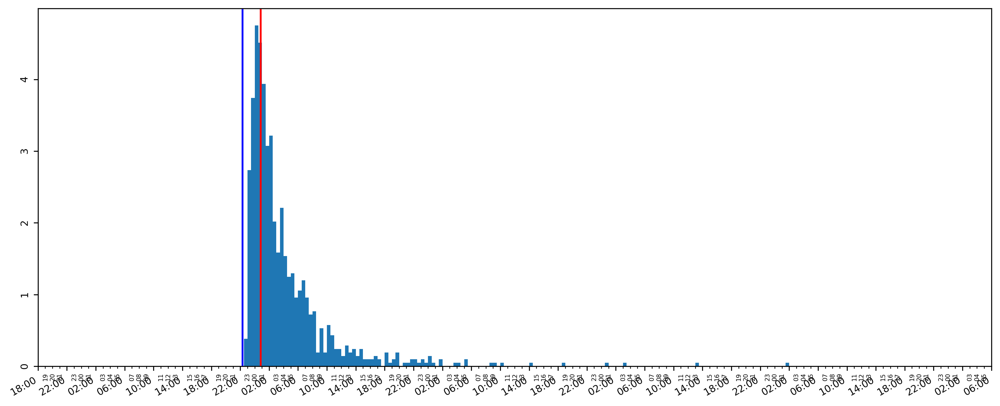

16451 2023-05-17 22:20:04.374000 2023-05-18 00:50:12.901000 [3.02741368] 0.0 2023-05-17 22:48:50.901414 2023-05-21 01:59:15.567917 3 days, 3:10:24.666503
13683


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


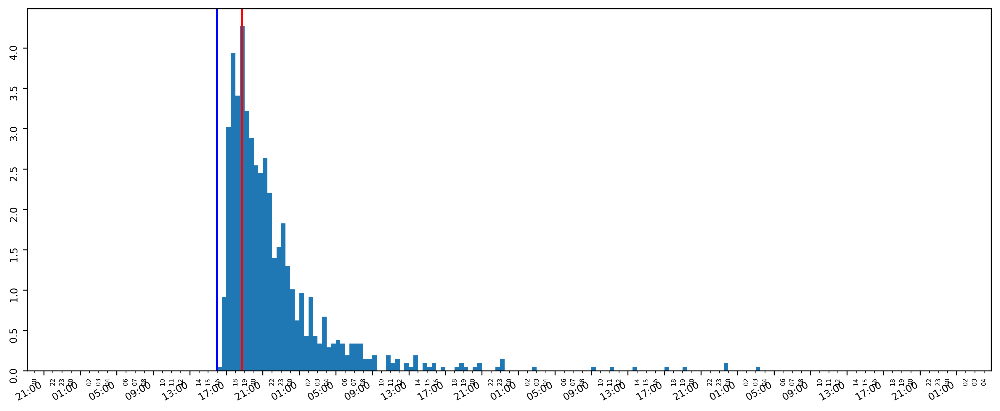

13683 2023-04-21 15:59:16.120000 2023-04-21 18:42:31.017000 [2.82036565] 0.0 2023-04-21 16:23:06.498449 2023-04-24 03:02:36.577755 2 days, 10:39:30.079306
14376


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


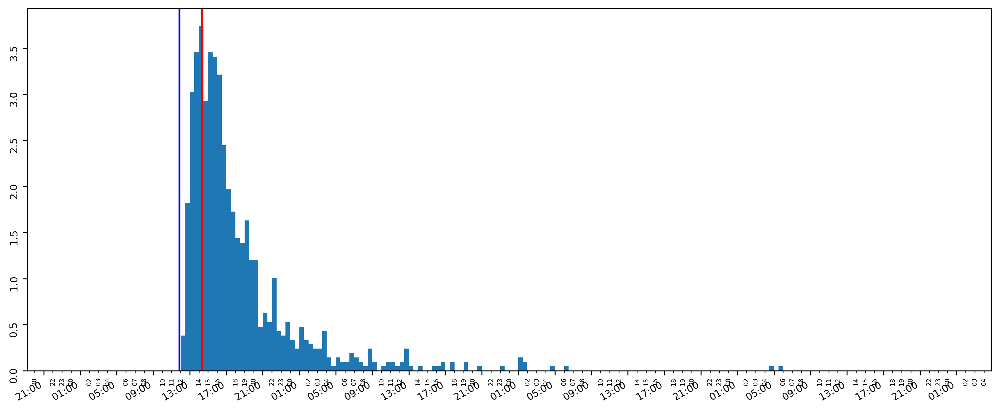

14376 2023-04-26 11:53:07.378000 2023-04-26 14:20:04.412000 [2.69933137] 0.0 2023-04-26 12:16:19.092553 2023-04-29 05:36:07.761593 2 days, 17:19:48.669040
10276


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


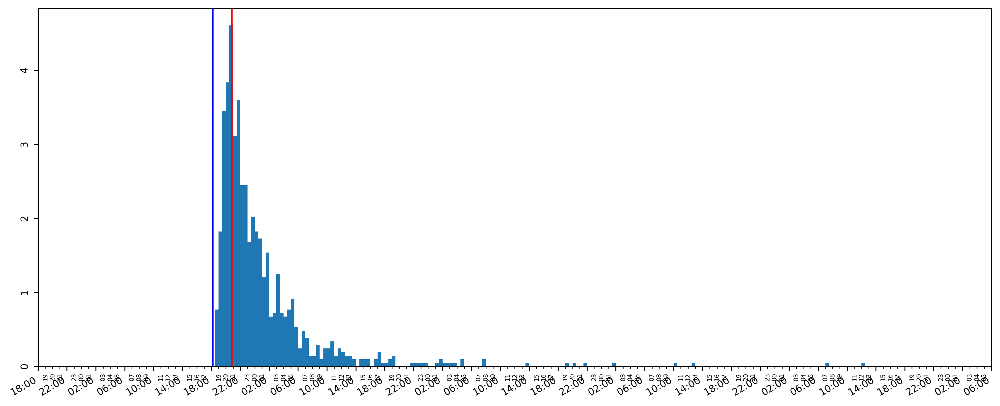

10276 2023-04-03 18:10:56.032000 2023-04-03 20:49:42.200000 [2.53485494] 15.272101593017572 2023-04-03 18:36:11.252881 2023-04-07 12:09:20.611729 3 days, 17:33:09.358848
15134


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


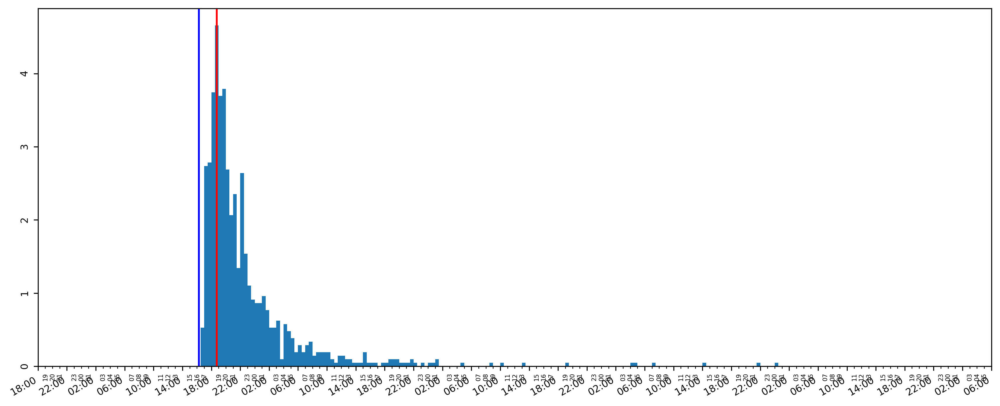

15134 2023-05-02 16:16:12.508000 2023-05-02 18:45:25.648000 [2.61613906] 0.0 2023-05-02 16:32:06.929488 2023-05-06 00:06:51.222868 3 days, 7:34:44.293380
16322


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


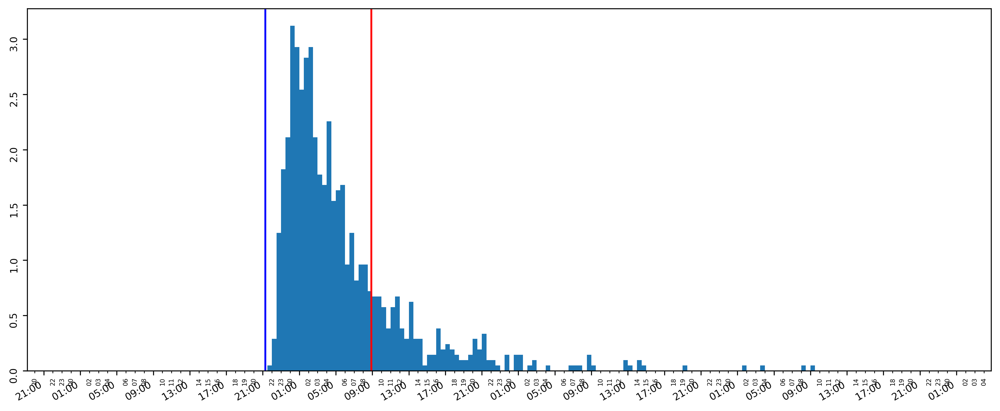

16322 2023-05-15 21:15:55.187000 2023-05-16 08:54:19.454000 [0.79869267] 0.0 2023-05-15 21:56:42.400274 2023-05-18 09:03:37.526494 2 days, 11:06:55.126220
10858


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


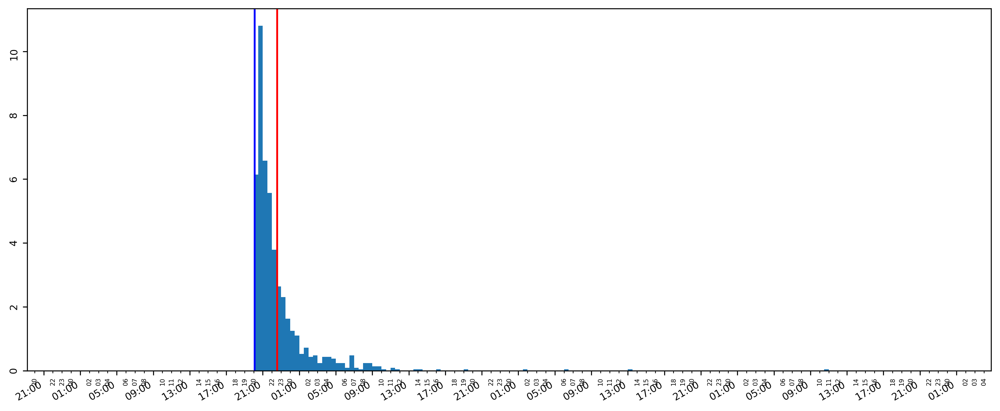

10858 2023-04-05 20:05:41.490000 2023-04-05 22:33:53.455000 [3.67420864] 0.0 2023-04-05 20:08:52.688112 2023-04-08 10:56:04.488510 2 days, 14:47:11.800398
10758


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


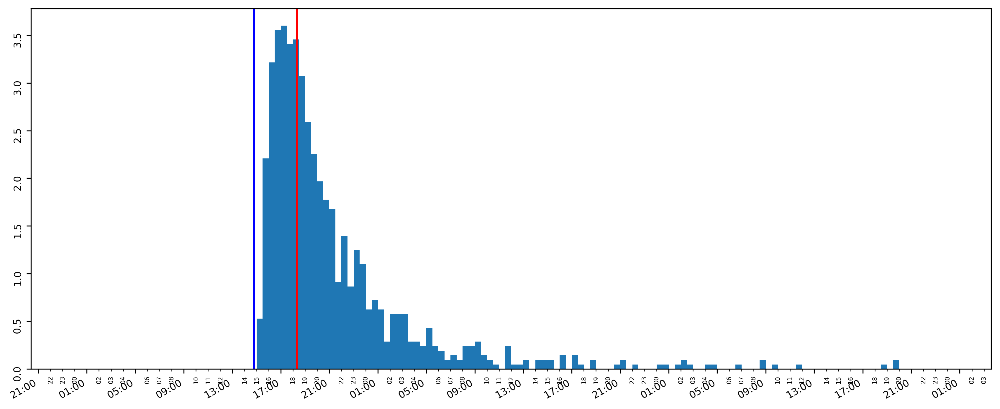

10758 2023-04-05 14:47:40.438000 2023-04-05 18:20:39.151000 [2.75479781] 0.0 2023-04-05 15:07:15.976324 2023-04-07 19:47:06.895197 2 days, 4:39:50.918873
16716


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


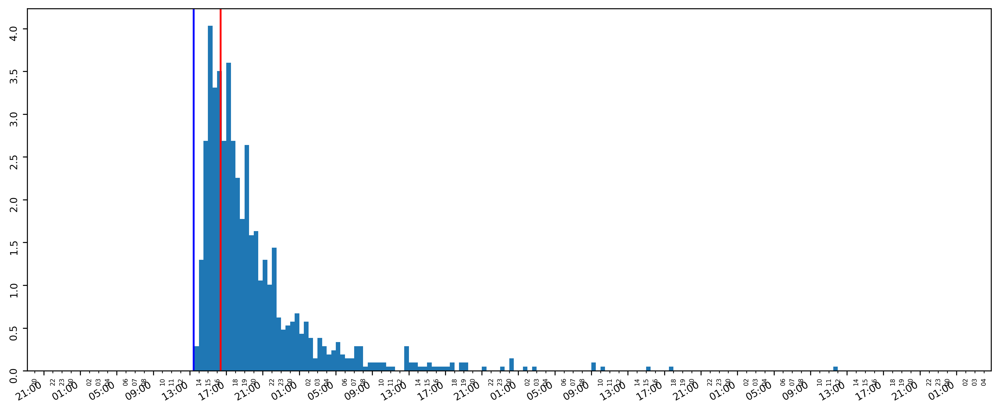

16716 2023-05-23 13:25:01.586000 2023-05-23 16:21:48.069000 [2.71310593] 0.0 2023-05-23 13:41:41.709883 2023-05-26 11:30:33.686834 2 days, 21:48:51.976951
15980


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


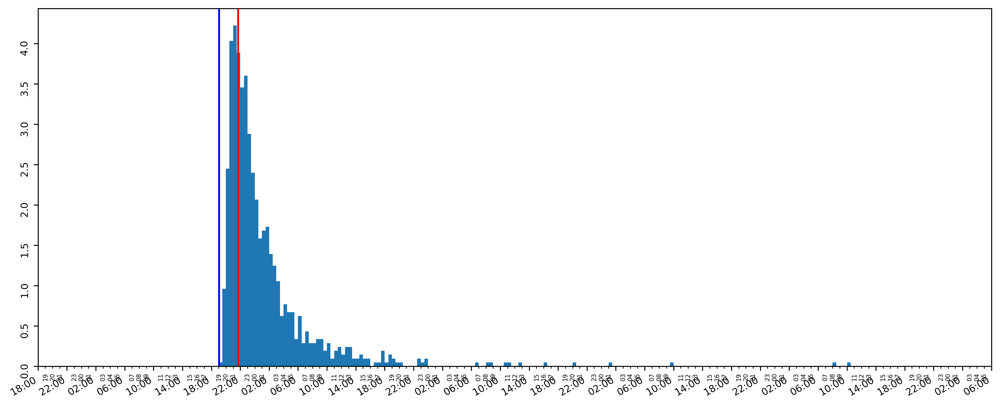

15980 2023-05-10 19:04:12.943000 2023-05-10 21:43:02.378000 [2.78350502] 0.0 2023-05-10 19:24:37.627726 2023-05-14 10:09:57.874610 3 days, 14:45:20.246884
10596


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


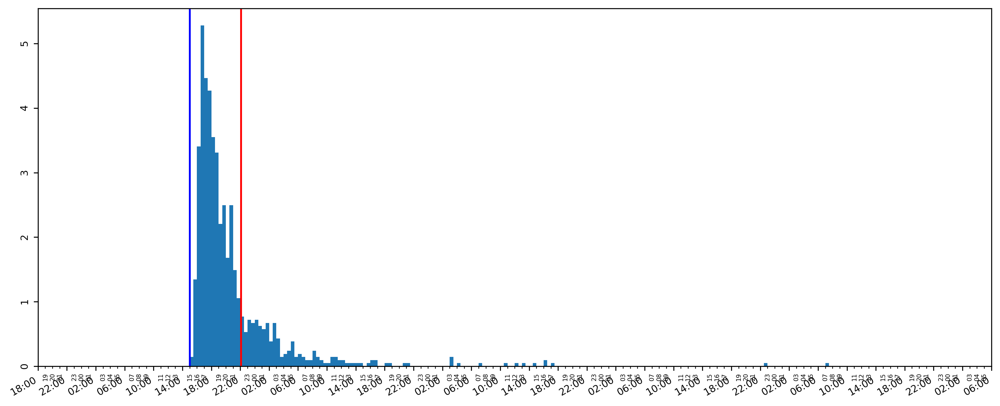

10596 2023-04-04 15:00:38.950000 2023-04-04 22:06:45.408000 [1.26420946] 0.0 2023-04-04 15:20:02.357112 2023-04-08 07:07:42.643324 3 days, 15:47:40.286212
12646


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


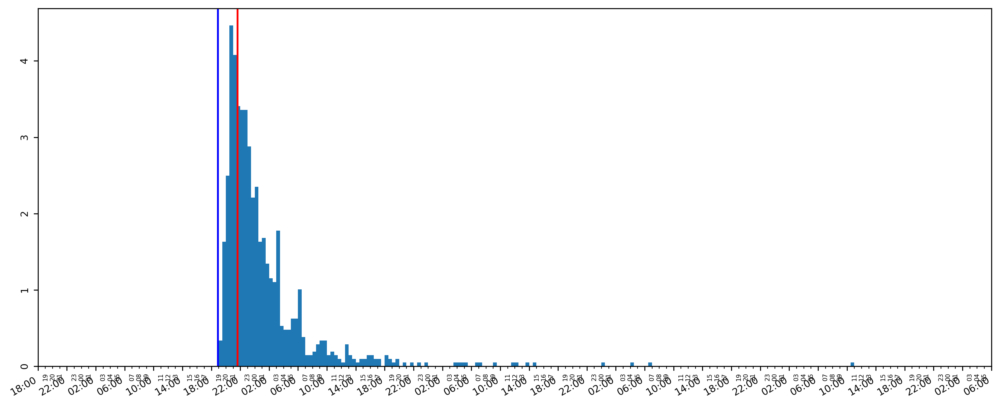

12646 2023-04-14 18:54:18.236000 2023-04-14 21:38:36.609000 [2.8143937] 0.0 2023-04-14 19:14:29.245018 2023-04-18 10:57:02.149021 3 days, 15:42:32.904003
16942


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


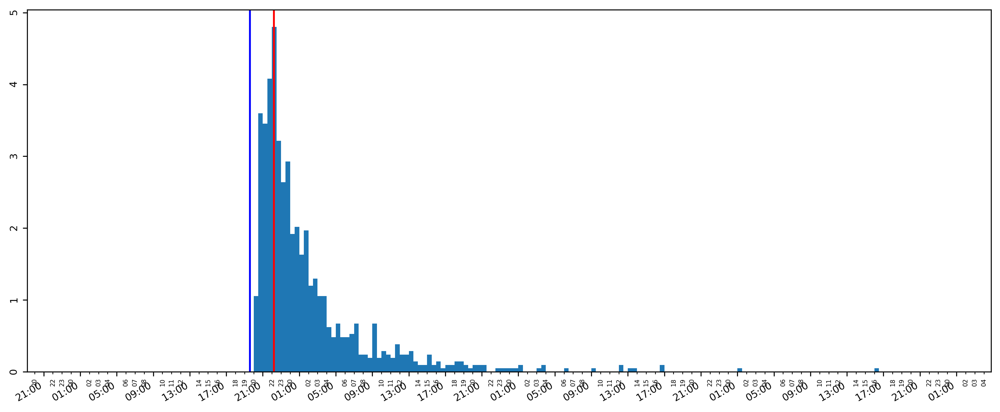

16942 2023-05-26 19:34:46.896000 2023-05-26 22:13:10.273000 [2.85536113] 0.0 2023-05-26 20:01:24.659099 2023-05-29 16:02:05.341587 2 days, 20:00:40.682488
15221


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


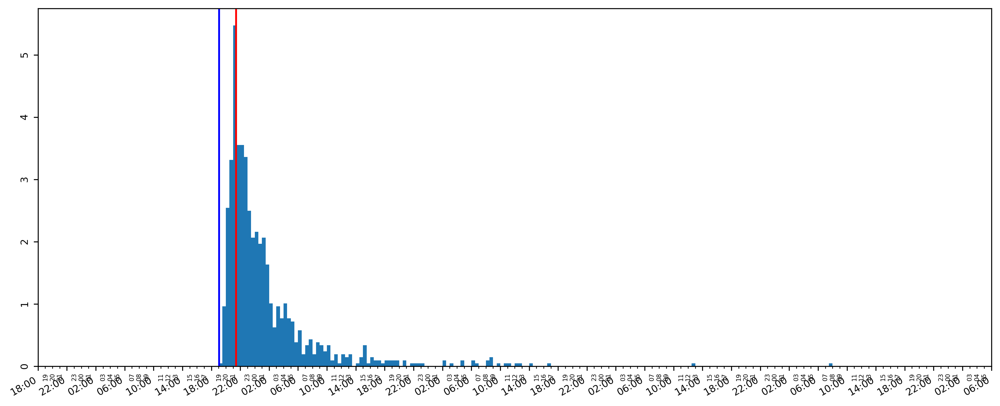

15221 2023-05-02 19:05:30.757000 2023-05-02 21:24:54.011000 [2.66575763] 0.0 2023-05-02 19:26:34.922016 2023-05-06 07:37:39.451427 3 days, 12:11:04.529411
15779


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


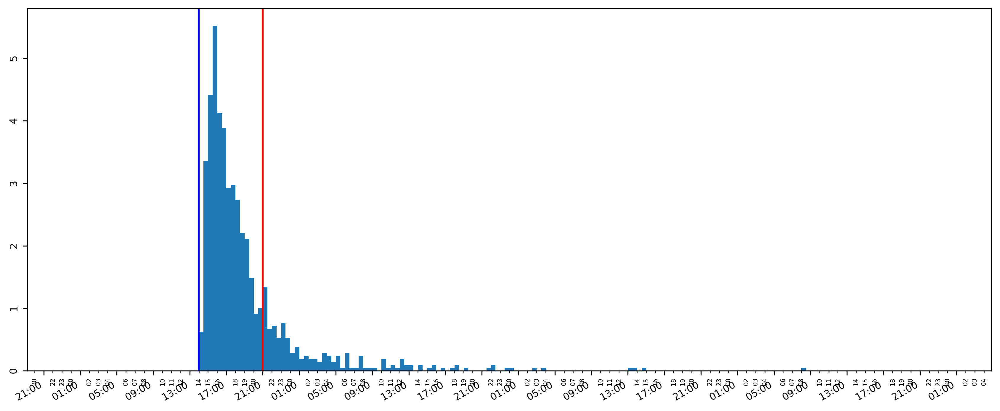

15779 2023-05-09 13:58:47.950000 2023-05-09 20:59:32.290000 [1.17845863] 0.0 2023-05-09 14:12:22.994839 2023-05-12 08:10:25.955756 2 days, 17:58:02.960917
14332


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


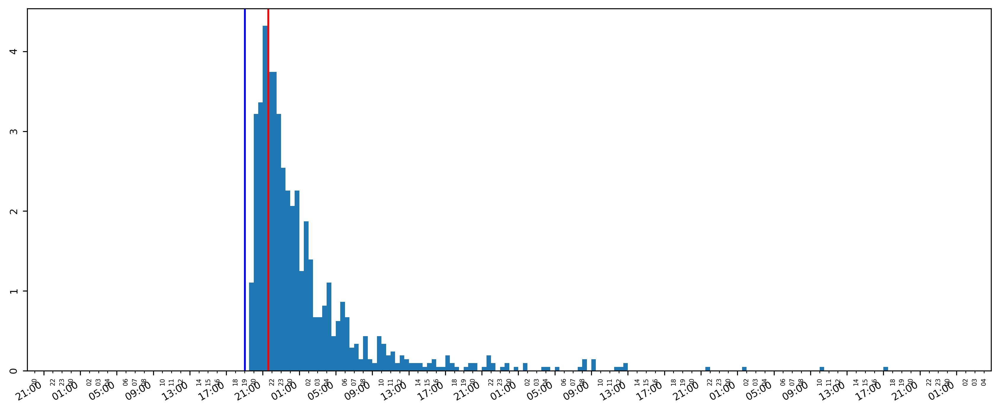

14332 2023-04-25 19:03:03.198000 2023-04-25 21:36:48.114000 [2.72068448] 0.0 2023-04-25 19:40:39.947897 2023-04-28 17:15:59.751241 2 days, 21:35:19.803344
12588


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


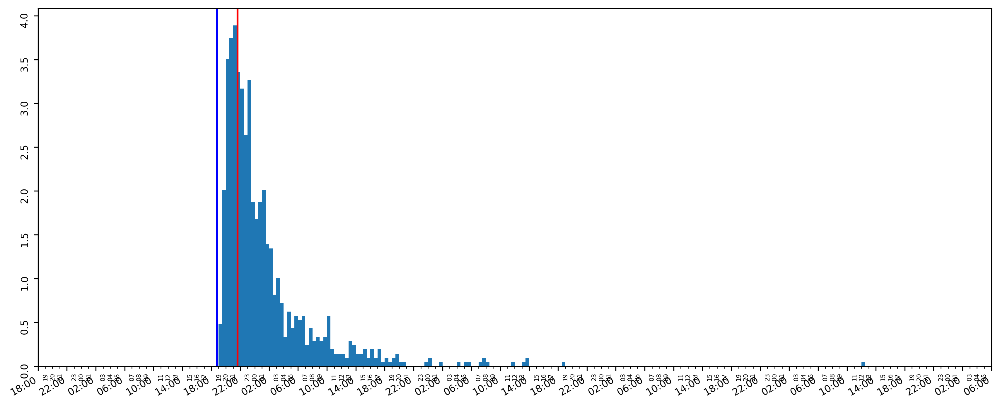

12588 2023-04-14 18:46:26.572000 2023-04-14 21:38:35.419000 [2.74456564] 0.0 2023-04-14 19:06:16.630389 2023-04-18 12:27:59.937641 3 days, 17:21:43.307252
12901


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


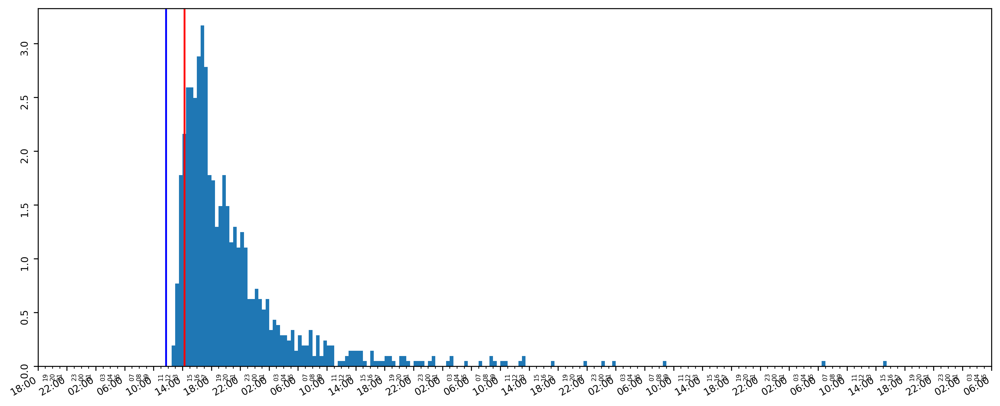

12901 2023-04-17 11:43:07.379000 2023-04-17 14:16:04.509000 [1.57610664] 0.0 2023-04-17 12:44:15.095189 2023-04-21 15:05:30.471691 4 days, 2:21:15.376502
10690


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


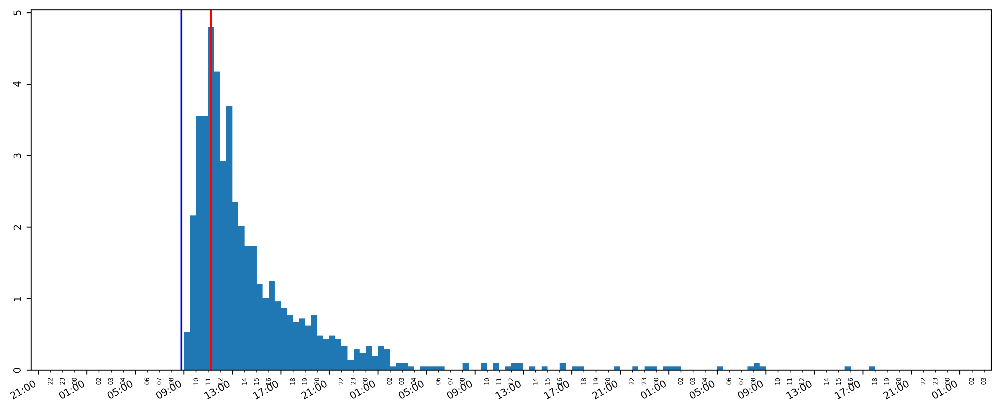

10690 2023-04-05 08:48:47.436000 2023-04-05 11:15:03.179000 [2.88776836] 0.0 2023-04-05 09:06:16.837672 2023-04-07 17:55:38.344515 2 days, 8:49:21.506843
13842


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


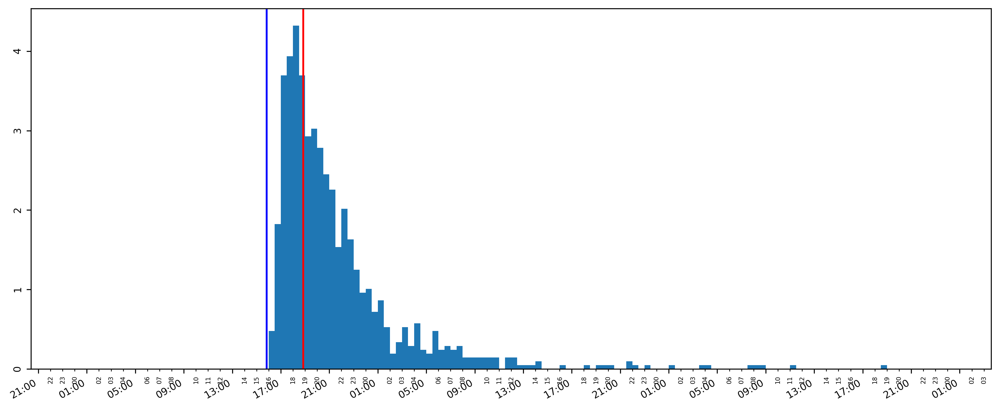

13842 2023-04-22 15:50:31.658000 2023-04-22 18:50:41.680000 [3.12354624] 0.0 2023-04-22 16:06:15.078539 2023-04-24 18:51:05.417888 2 days, 2:44:50.339349
14606


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


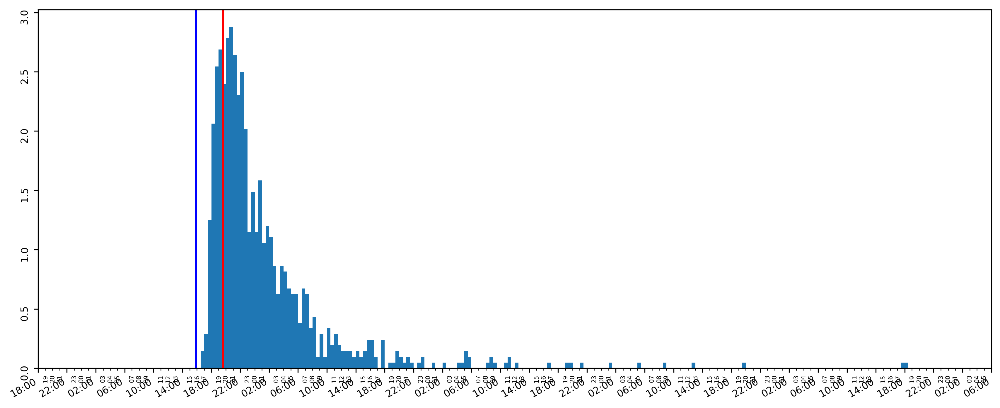

14606 2023-04-27 15:51:39.487000 2023-04-27 19:38:04.907000 [1.90624088] 0.0 2023-04-27 16:39:35.997527 2023-05-01 18:19:15.782140 4 days, 1:39:39.784613
10438


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


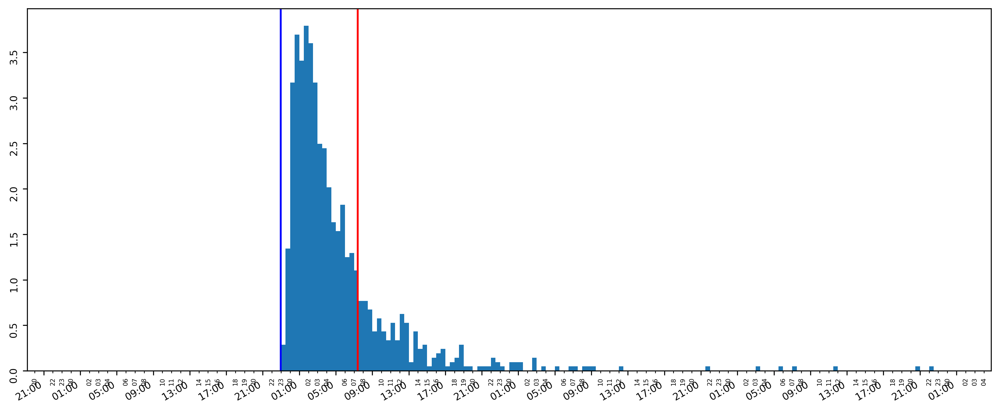

10438 2023-04-03 22:57:42.560000 2023-04-04 07:23:27.878000 [1.07176626] 0.0 2023-04-03 23:12:43.436400 2023-04-06 22:12:54.019136 2 days, 23:00:10.582736
10171


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


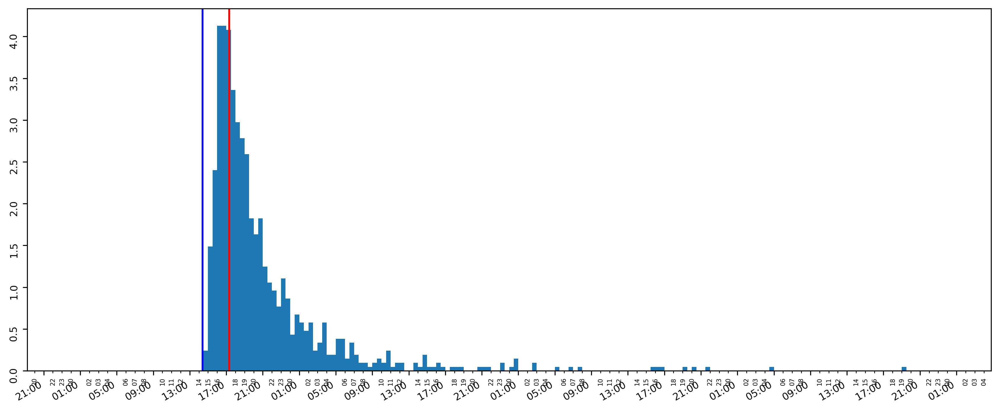

10171 2023-04-03 14:24:38.244000 2023-04-03 17:18:34.559000 [2.73001859] 30.762103271484378 2023-04-03 14:35:31.516252 2023-04-06 19:16:19.541042 3 days, 4:40:48.024790
15416


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


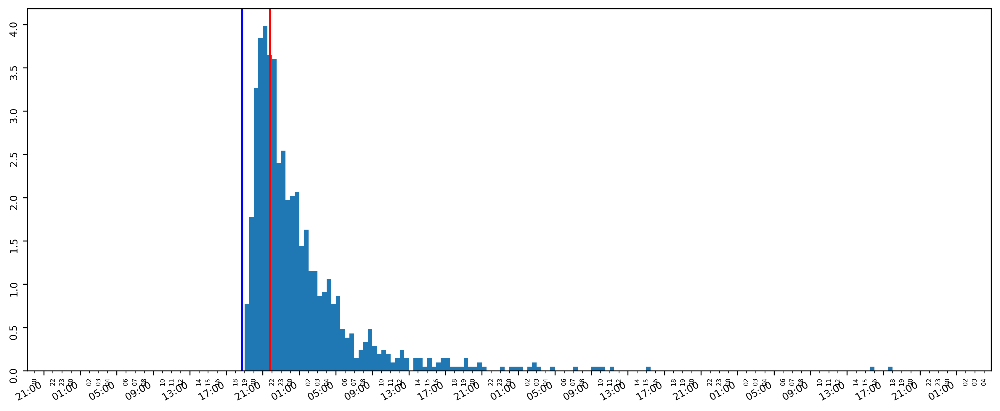

15416 2023-05-04 18:44:22.425000 2023-05-04 21:47:25.769000 [2.84270688] 0.0 2023-05-04 19:15:08.856802 2023-05-07 17:52:14.359950 2 days, 22:37:05.503148
16341


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


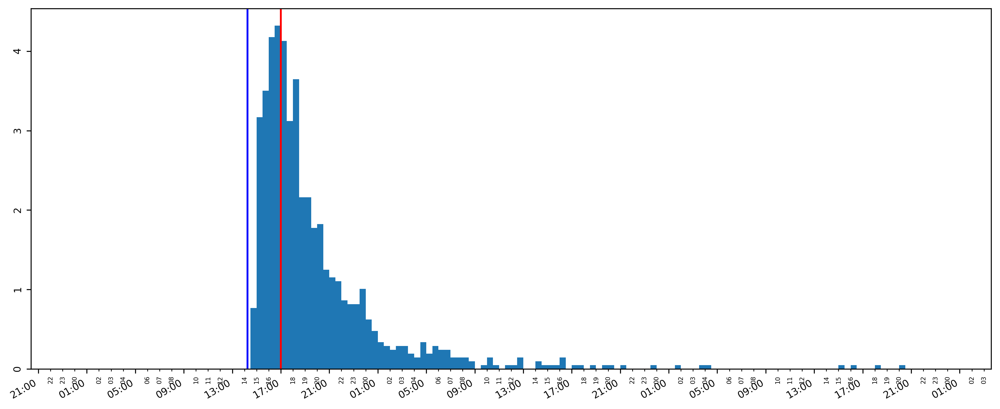

16341 2023-05-16 14:14:48.562000 2023-05-16 16:59:45.288000 [3.23477532] 0.0 2023-05-16 14:40:17.467359 2023-05-18 20:25:58.192461 2 days, 5:45:40.725102
11116


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


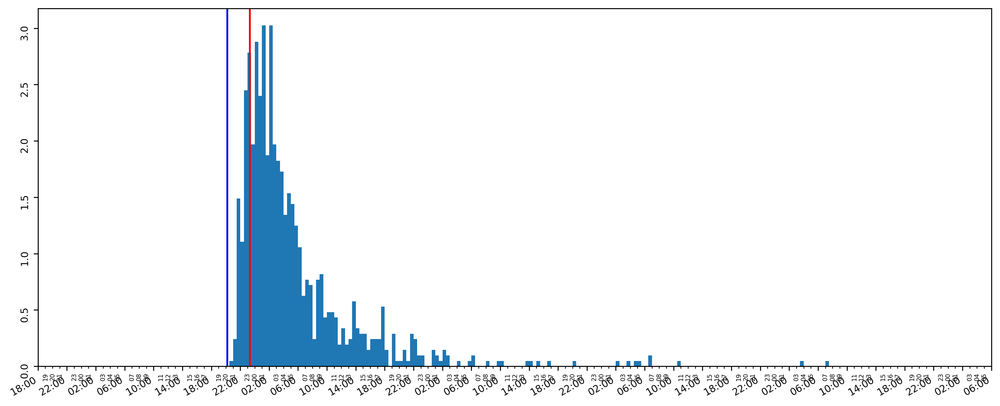

11116 2023-04-06 20:12:34.284000 2023-04-06 23:20:04.924000 [1.81450748] 0.0 2023-04-06 20:54:08.374886 2023-04-10 07:10:14.317760 3 days, 10:16:05.942874
17315


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


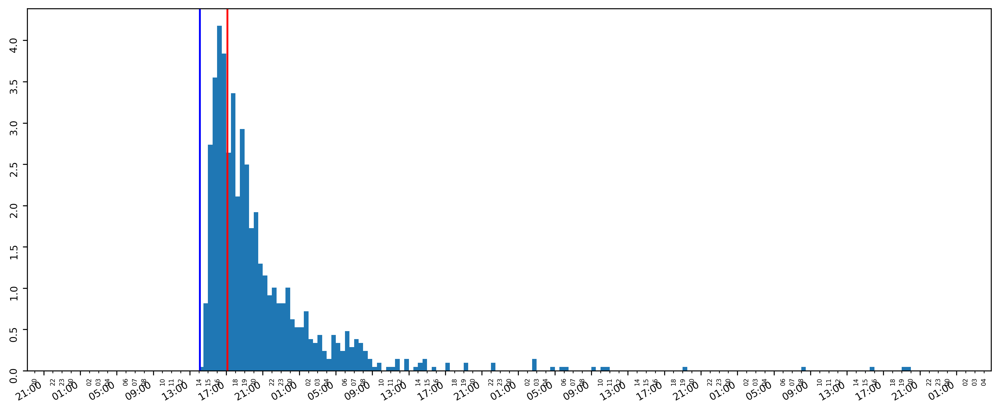

17315 2023-06-03 14:06:33.829000 2023-06-03 17:08:11.414000 [2.63114989] 0.0 2023-06-03 14:25:17.947639 2023-06-06 19:48:22.123467 3 days, 5:23:04.175828
638


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


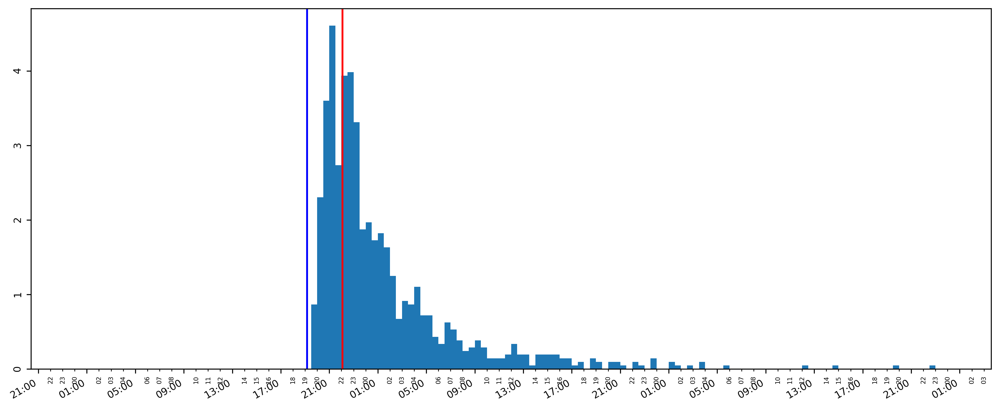

638 2023-04-11 19:10:07.932000 2023-04-11 22:05:42.282000 [3.01079586] 0.0 2023-04-11 19:32:11.097370 2023-04-13 22:41:23.595787 2 days, 3:09:12.498417
15871


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


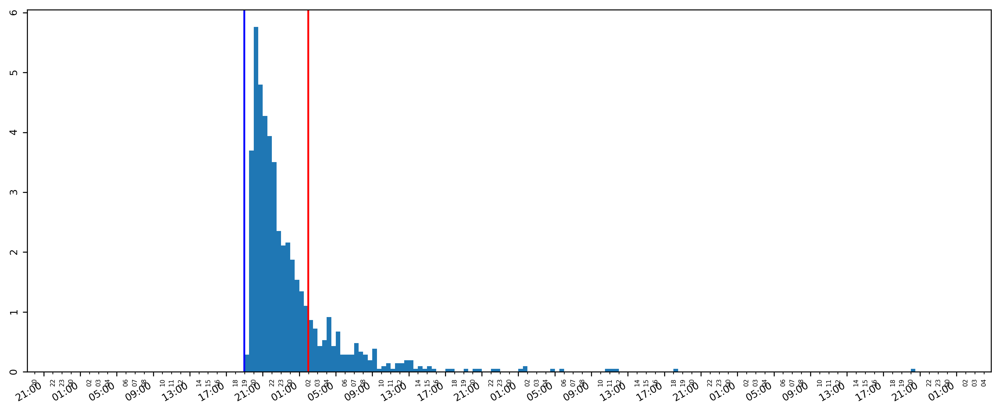

15871 2023-05-09 18:58:44.253000 2023-05-10 01:59:32.392000 [1.11136154] 0.0 2023-05-09 19:18:42.961652 2023-05-12 20:15:49.305785 3 days, 0:57:06.344133
13027


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


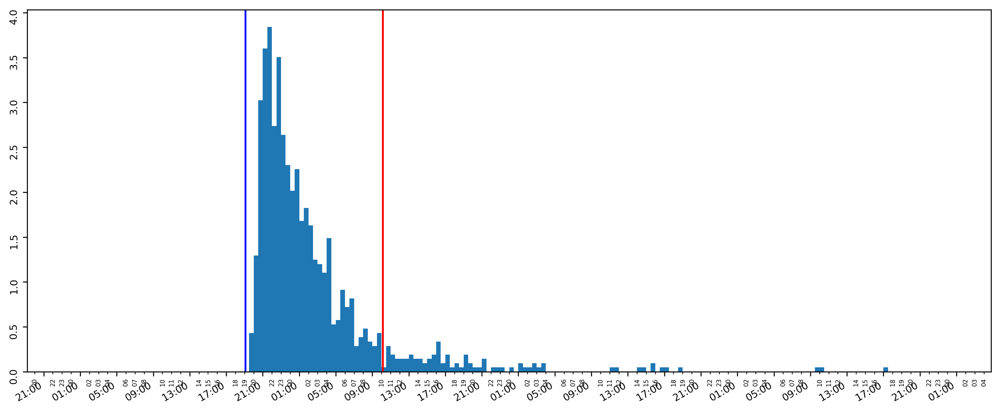

13027 2023-04-17 19:06:28.689000 2023-04-18 10:09:56.580000 [0.27650137] 0.0 2023-04-17 19:34:13.417907 2023-04-20 17:16:56.857347 2 days, 21:42:43.439440
13911


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


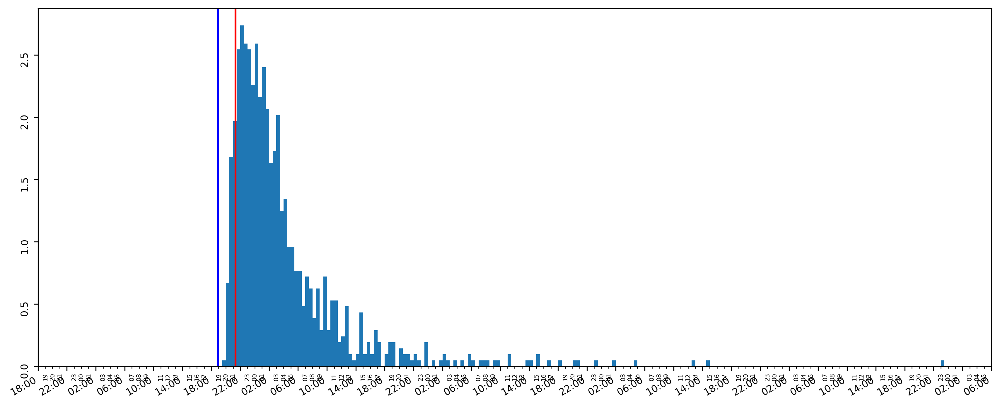

13911 2023-04-22 18:53:43.609000 2023-04-22 21:19:30.358000 [1.55839934] 0.0 2023-04-22 19:54:20.098990 2023-04-26 23:12:22.702207 4 days, 3:18:02.603217
10341


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


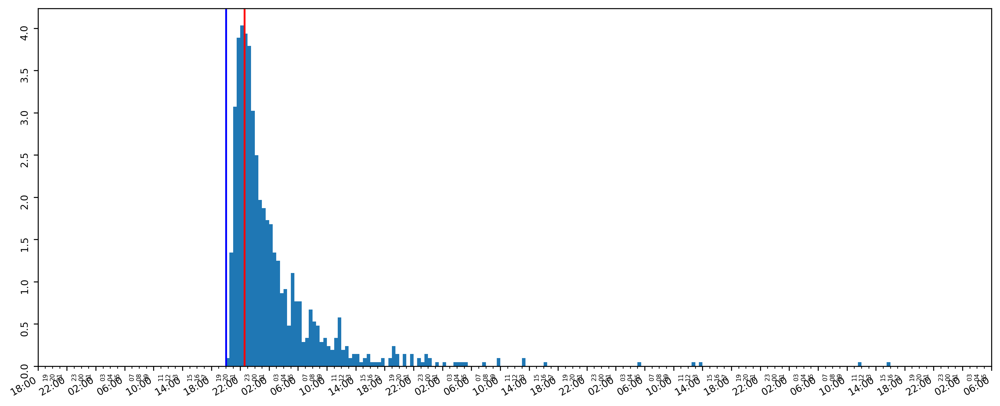

10341 2023-04-03 20:01:41.553000 2023-04-03 22:36:46.784000 [2.612616] 16.130621337890624 2023-04-03 20:23:53.391773 2023-04-07 15:42:42.919240 3 days, 19:18:49.527467
15748


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


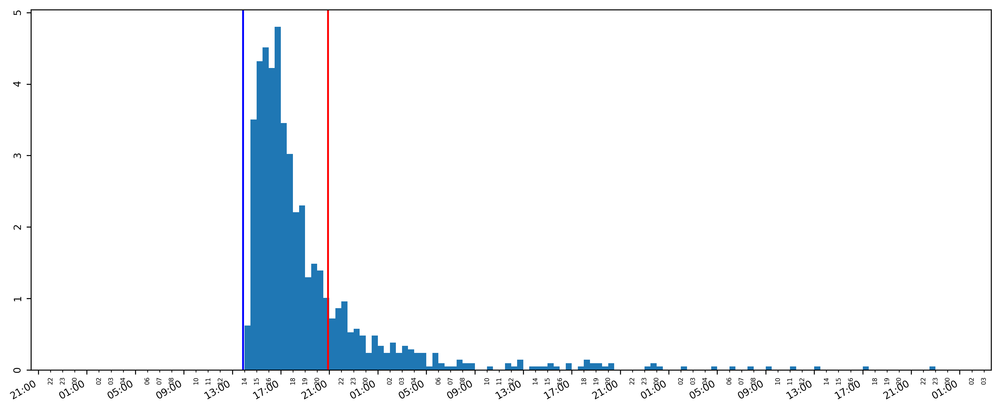

15748 2023-05-09 13:53:25.843000 2023-05-09 20:53:32.275000 [1.18382587] 44.40498046875001 2023-05-09 14:10:06.161757 2023-05-11 22:53:40.289950 2 days, 8:43:34.128193
13317


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


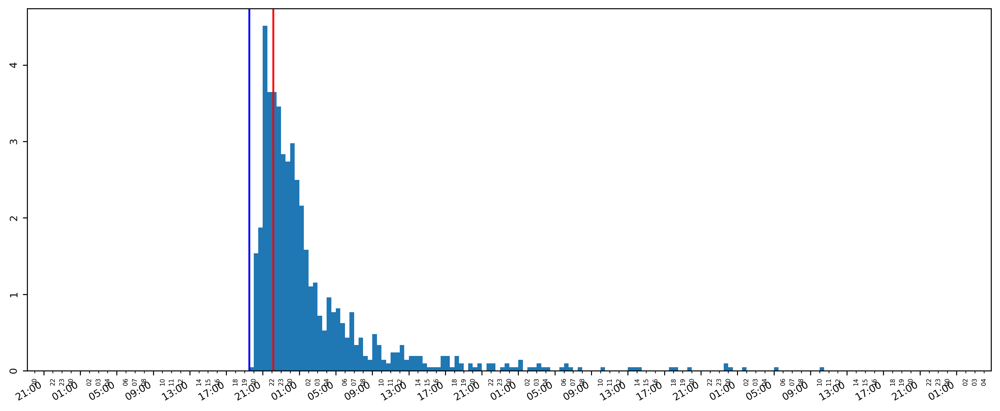

13317 2023-04-18 19:30:49.251000 2023-04-18 22:09:36.471000 [2.59604898] 0.0 2023-04-18 19:43:19.877268 2023-04-21 10:05:04.769155 2 days, 14:21:44.891887
639


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


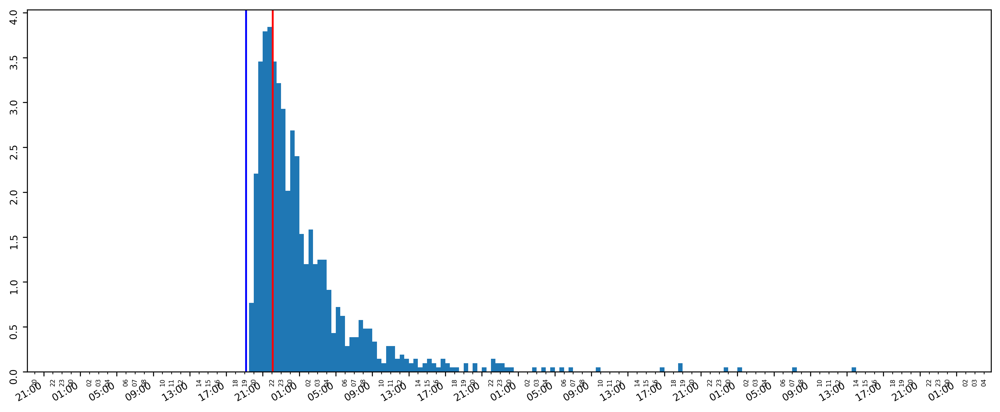

639 2023-04-11 19:10:16.456000 2023-04-11 22:05:42.812000 [2.78985244] 0.0 2023-04-11 19:33:49.728106 2023-04-14 13:55:13.479634 2 days, 18:21:23.751528
15705


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


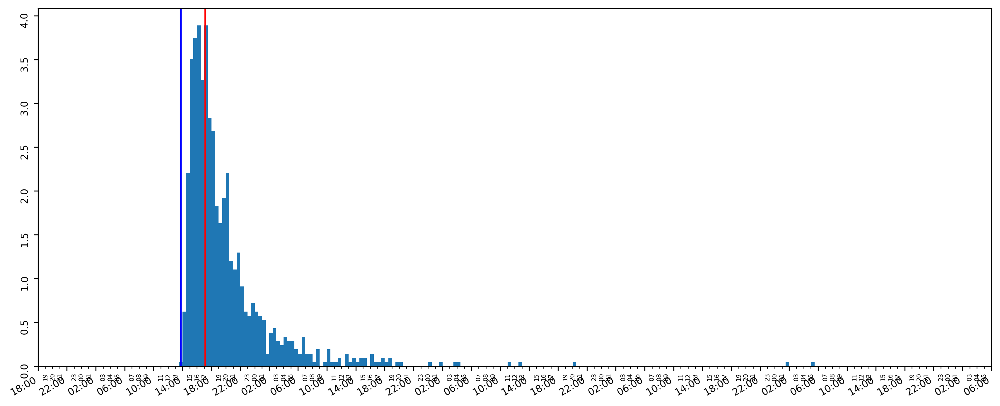

15705 2023-05-09 13:45:33.009000 2023-05-09 17:09:31.384000 [2.77941881] 0.0 2023-05-09 13:59:58.119482 2023-05-13 05:28:23.899258 3 days, 15:28:25.779776
10532


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


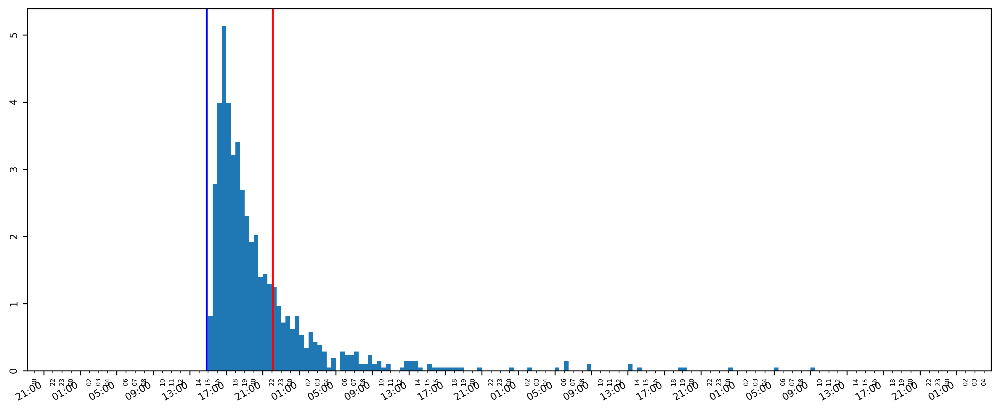

10532 2023-04-04 14:51:42.531000 2023-04-04 22:05:44.903000 [1.27120867] 0.0 2023-04-04 15:11:46.197469 2023-04-07 09:01:26.793470 2 days, 17:49:40.596001
17908


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


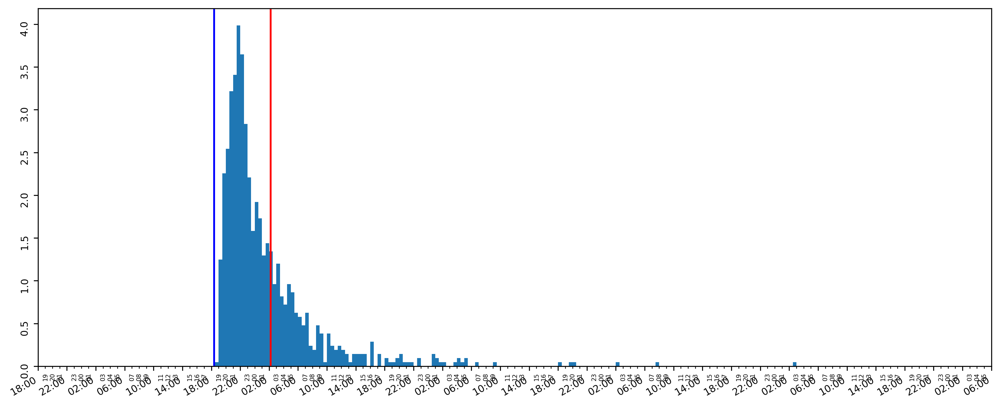

17908 2023-06-09 18:22:00.205000 2023-06-10 02:11:45.568000 [1.33368334] 0.0 2023-06-09 18:54:37.346732 2023-06-13 02:42:06.848814 3 days, 7:47:29.502082
10839


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


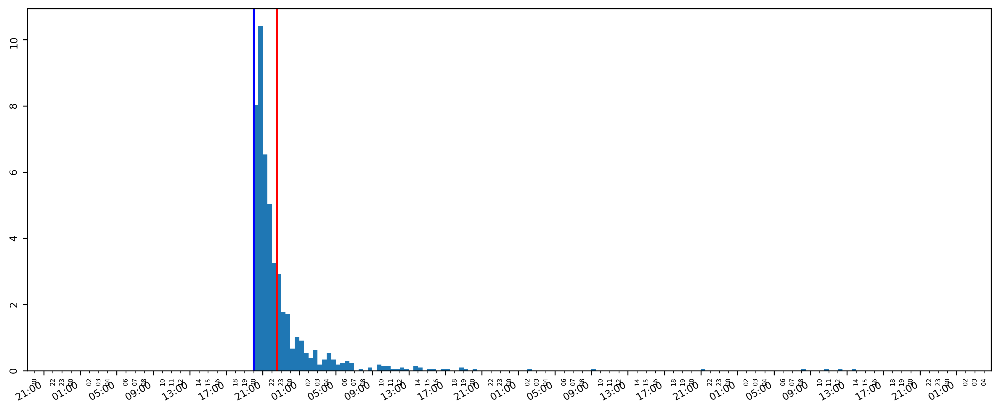

10839 2023-04-05 20:01:23.990000 2023-04-05 22:33:53.261000 [3.52501818] 0.0 2023-04-05 20:02:25.188594 2023-04-08 13:57:59.556072 2 days, 17:55:34.367478
14948


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


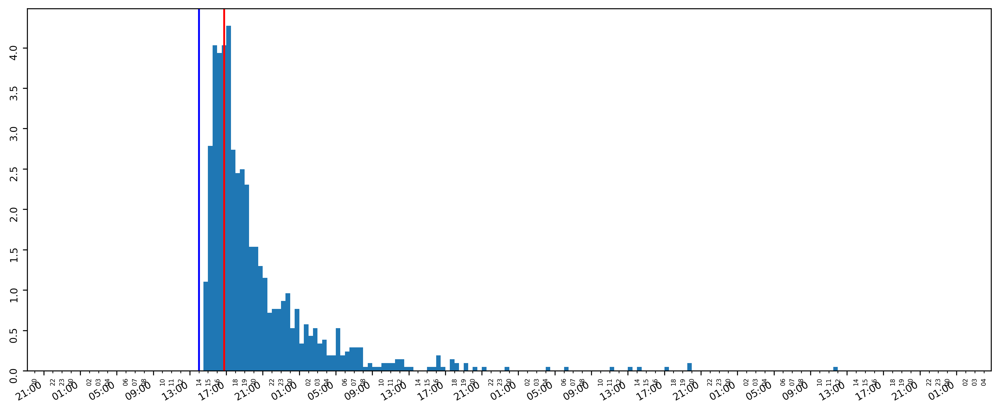

14948 2023-04-29 14:01:17.123000 2023-04-29 16:46:28.252000 [2.8728351] 46.2081871032715 2023-04-29 14:37:23.183798 2023-05-02 11:50:41.290940 2 days, 21:13:18.107142
16449


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


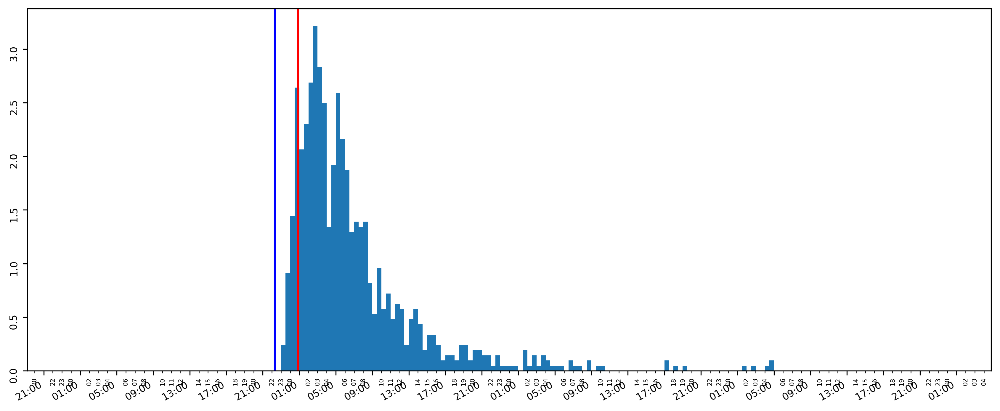

16449 2023-05-17 22:19:48.146000 2023-05-18 00:52:05.571000 [1.70233444] 0.0 2023-05-17 23:16:31.617198 2023-05-20 04:38:50.521710 2 days, 5:22:18.904512
12799


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


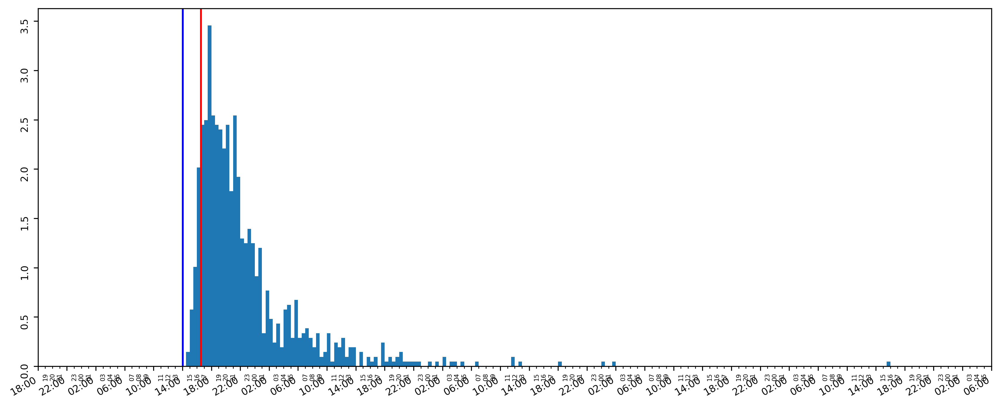

12799 2023-04-15 14:01:47.040000 2023-04-15 16:34:05.365000 [1.69951201] 0.0 2023-04-15 14:46:23.008589 2023-04-19 15:46:44.326755 4 days, 1:00:21.318166
16882


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


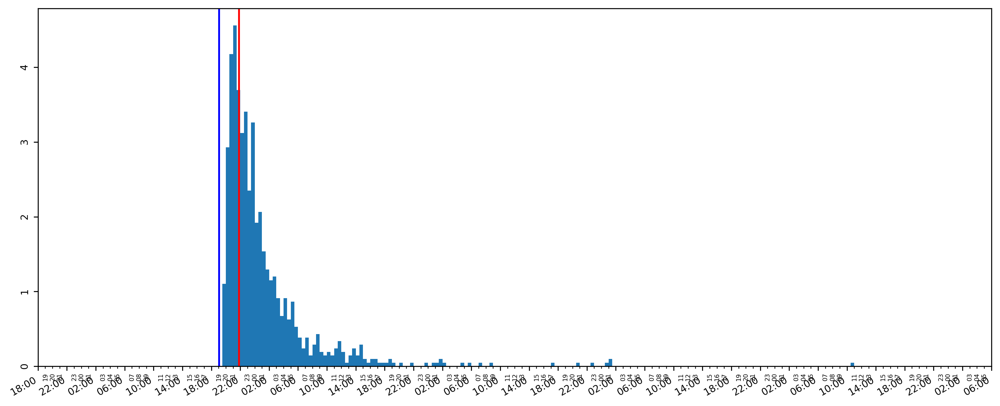

16882 2023-05-25 19:04:48.696000 2023-05-25 21:50:43.739000 [2.90228895] 0.0 2023-05-25 19:36:56.247152 2023-05-29 10:51:46.696215 3 days, 15:14:50.449063
15578


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


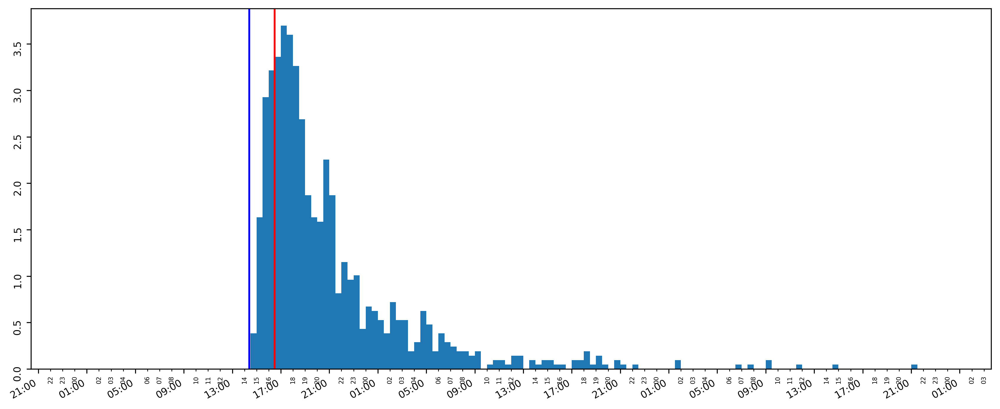

15578 2023-05-06 14:23:32.879000 2023-05-06 16:28:57.232000 [2.48272669] 0.0 2023-05-06 14:52:30.297267 2023-05-08 21:13:11.816164 2 days, 6:20:41.518897
13333


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


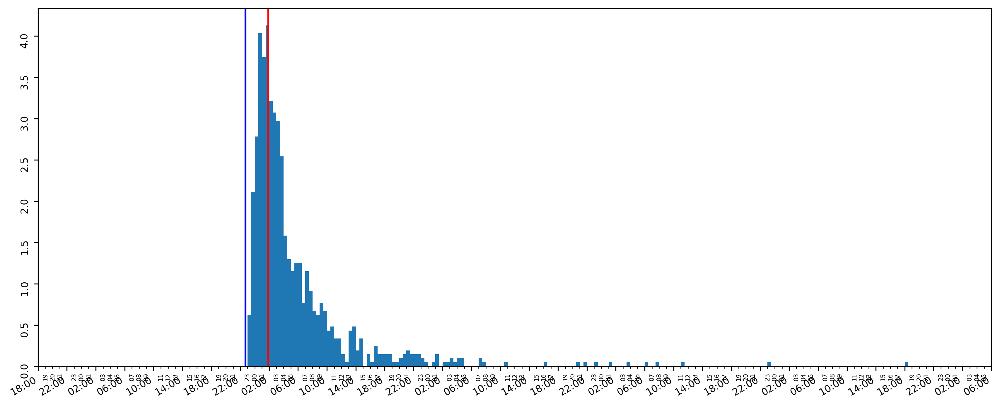

13333 2023-04-18 22:43:11.119000 2023-04-19 01:52:31.086000 [2.6675342] 0.0 2023-04-18 23:03:20.669998 2023-04-22 18:17:40.773647 3 days, 19:14:20.103649
15983


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


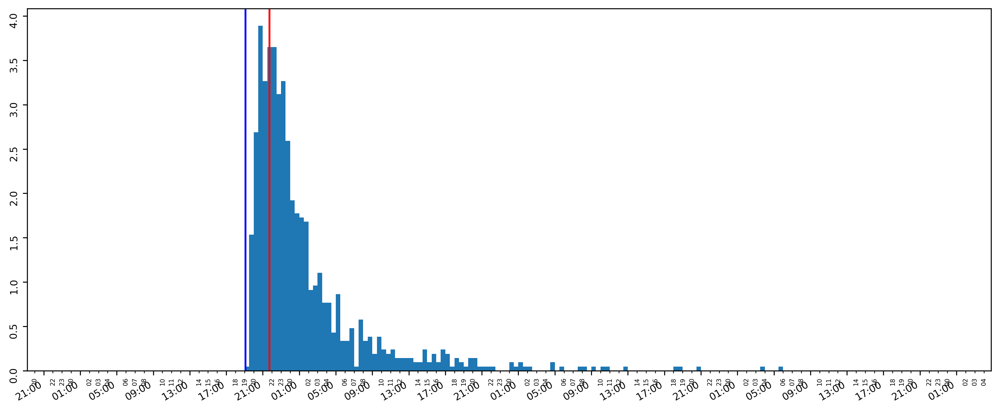

15983 2023-05-10 19:05:31.937000 2023-05-10 21:43:02.658000 [2.73794634] 0.0 2023-05-10 19:25:46.503312 2023-05-13 05:56:12.854100 2 days, 10:30:26.350788
10488


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


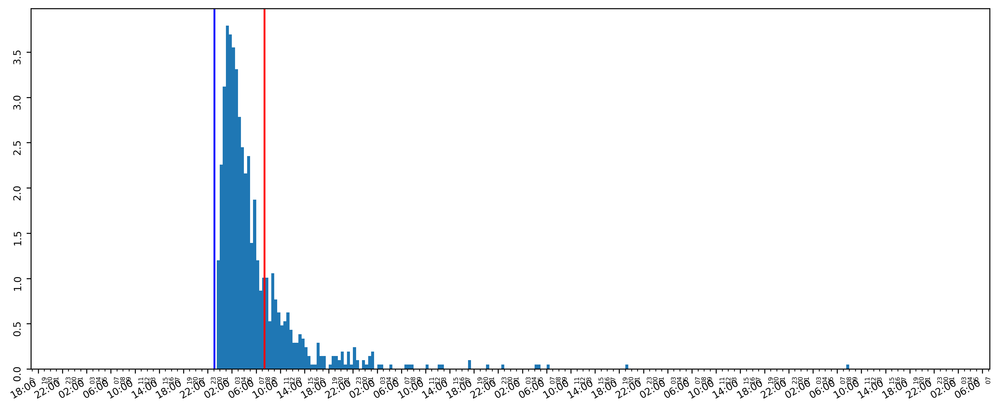

10488 2023-04-03 23:05:48.139000 2023-04-04 07:23:27.016000 [1.12694088] 0.0 2023-04-03 23:30:38.584206 2023-04-08 07:51:14.430407 4 days, 8:20:35.846201
10367


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


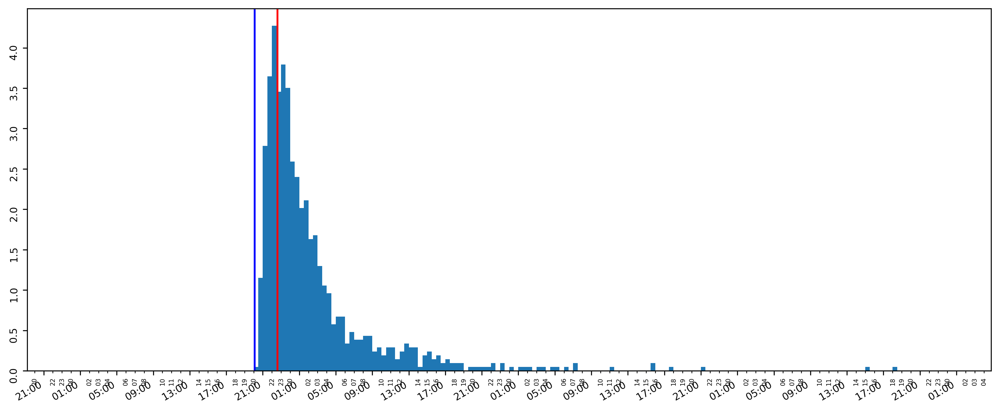

10367 2023-04-03 20:05:40.249000 2023-04-03 22:36:46.804000 [2.80114881] 0.0 2023-04-03 20:28:47.964871 2023-04-06 18:07:59.457498 2 days, 21:39:11.492627
16375


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


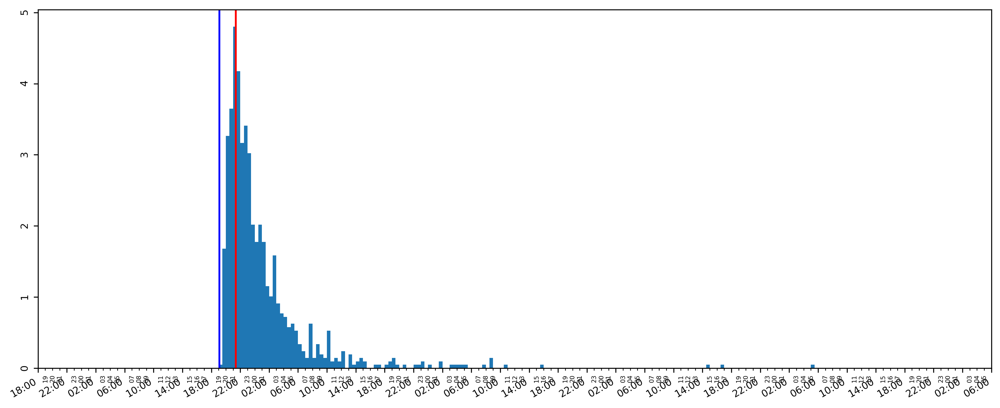

16375 2023-05-16 19:06:11.597000 2023-05-16 21:22:23.844000 [2.876502] 0.0 2023-05-16 19:29:44.636872 2023-05-20 05:13:45.309582 3 days, 9:44:00.672710
16671


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


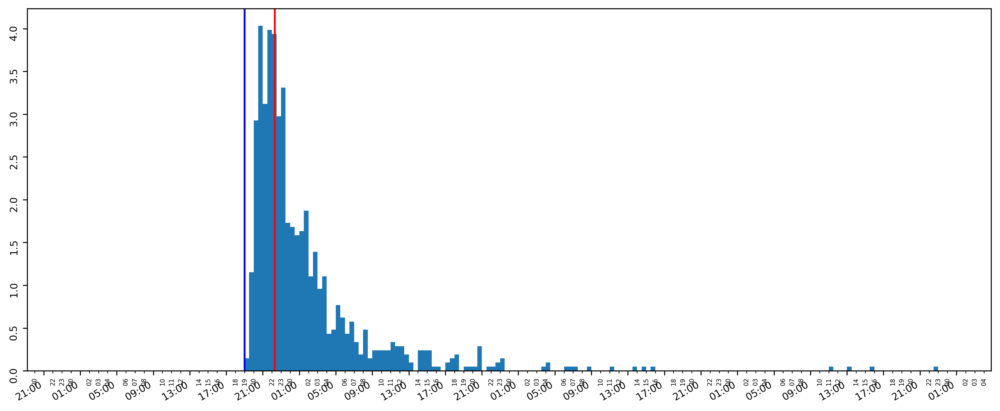

16671 2023-05-22 19:00:28.276000 2023-05-22 22:19:10.547000 [2.70198587] 0.0 2023-05-22 19:21:21.391827 2023-05-25 22:37:34.914233 3 days, 3:16:13.522406
12794


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


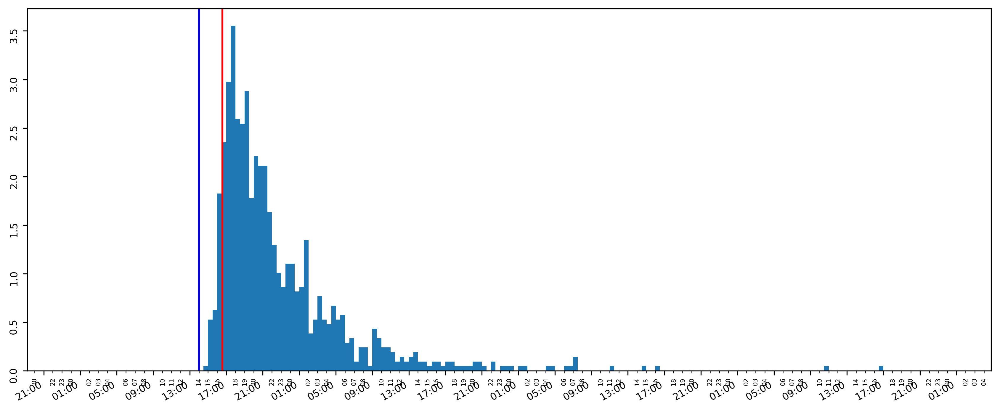

12794 2023-04-15 14:00:56.845000 2023-04-15 16:34:05.327000 [1.69932422] 0.0 2023-04-15 14:56:44.754034 2023-04-18 16:38:54.933051 3 days, 1:42:10.179017
12677


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


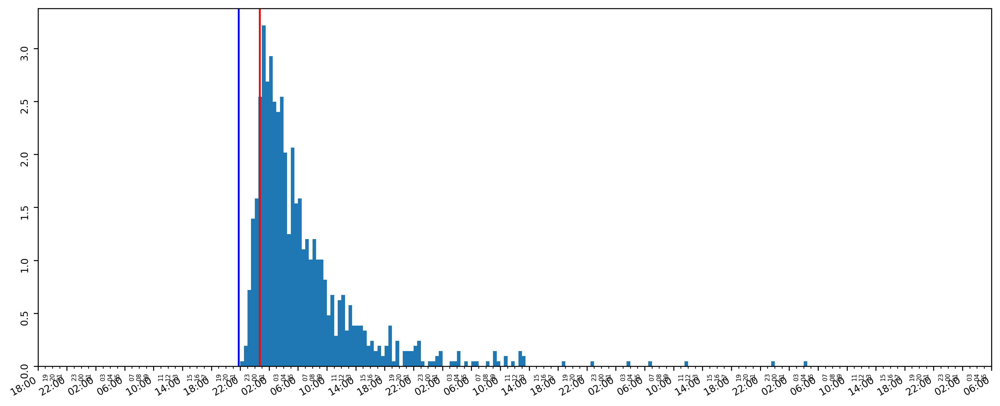

12677 2023-04-14 21:46:36.566000 2023-04-15 00:42:44.169000 [1.78484162] 0.0 2023-04-14 22:28:02.294426 2023-04-18 04:24:12.116023 3 days, 5:56:09.821597
13687


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


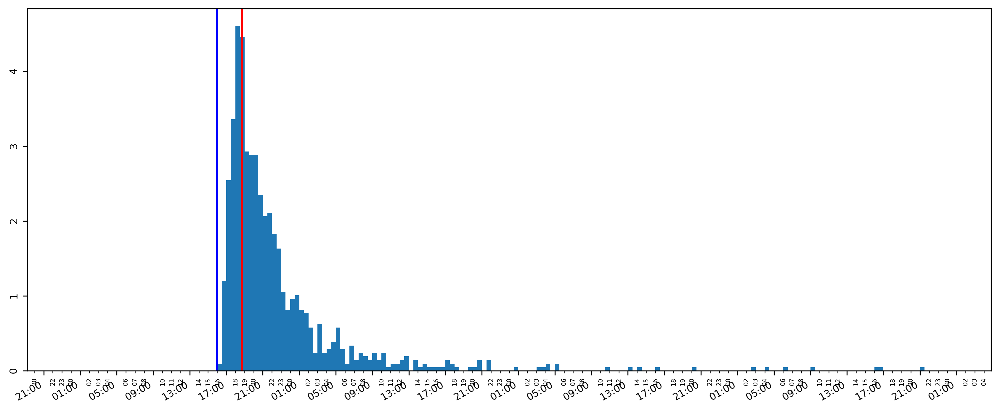

13687 2023-04-21 15:59:48.166000 2023-04-21 18:42:32.061000 [2.56039156] 21.28909378051759 2023-04-21 16:27:23.639575 2023-04-24 21:20:08.498632 3 days, 4:52:44.859057
13921


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


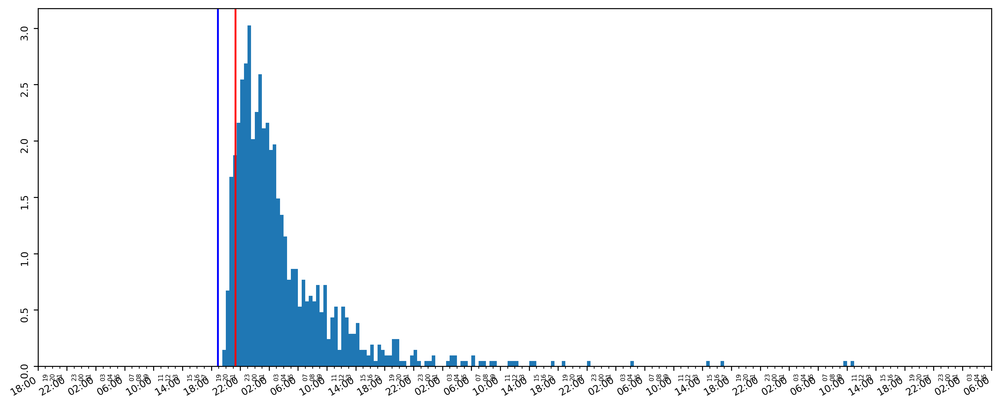

13921 2023-04-22 18:54:46.659000 2023-04-22 21:19:30.359000 [1.53639499] 0.0 2023-04-22 19:47:32.104580 2023-04-26 10:59:12.037139 3 days, 15:11:39.932559
10335


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


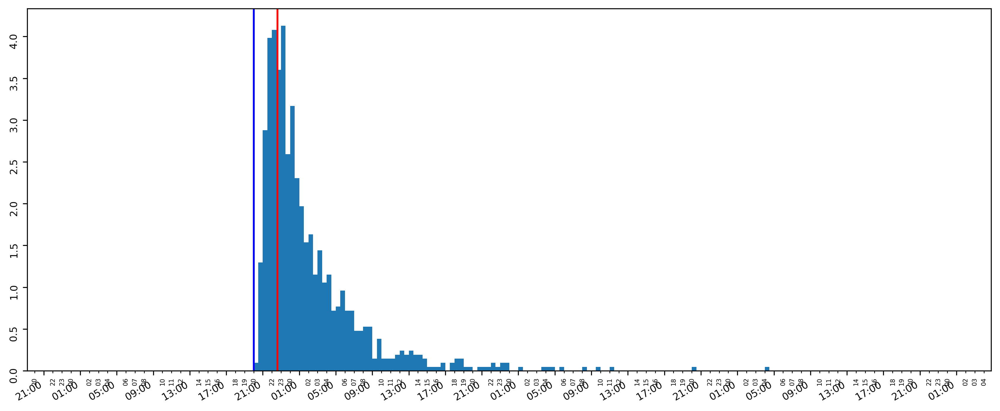

10335 2023-04-03 20:00:41.679000 2023-04-03 22:36:42.012000 [3.03834671] 0.0 2023-04-03 20:23:26.393880 2023-04-06 04:02:47.787446 2 days, 7:39:21.393566
15527


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


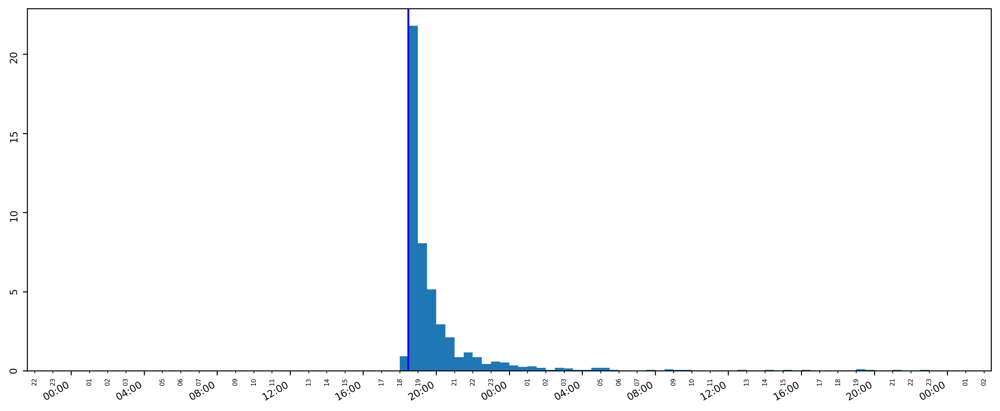

15527 2023-05-05 18:28:21.419000 2023-05-05 18:28:26.044000 [7.46039773] 0.0 2023-05-05 18:28:42.770044 2023-05-06 22:43:51.871924 1 day, 4:15:09.101880
15795


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


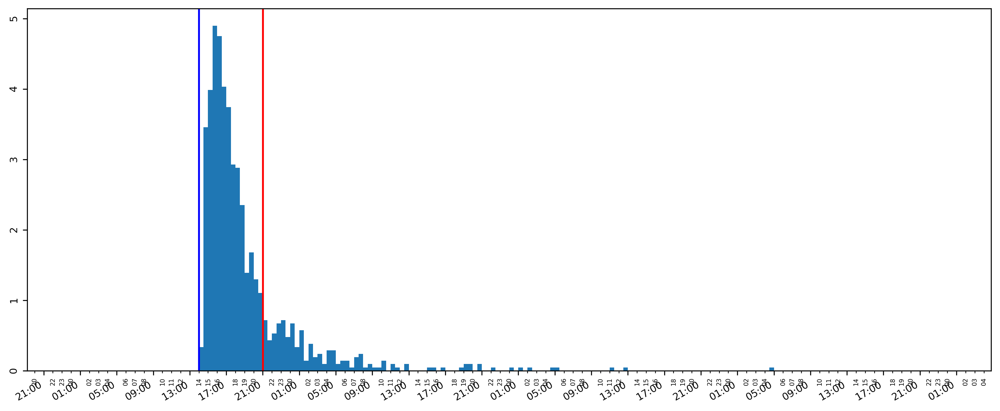

15795 2023-05-09 14:01:23.047000 2023-05-09 21:01:32.331000 [1.06356955] 0.0 2023-05-09 14:19:57.972345 2023-05-12 04:36:52.166056 2 days, 14:16:54.193711
13043


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


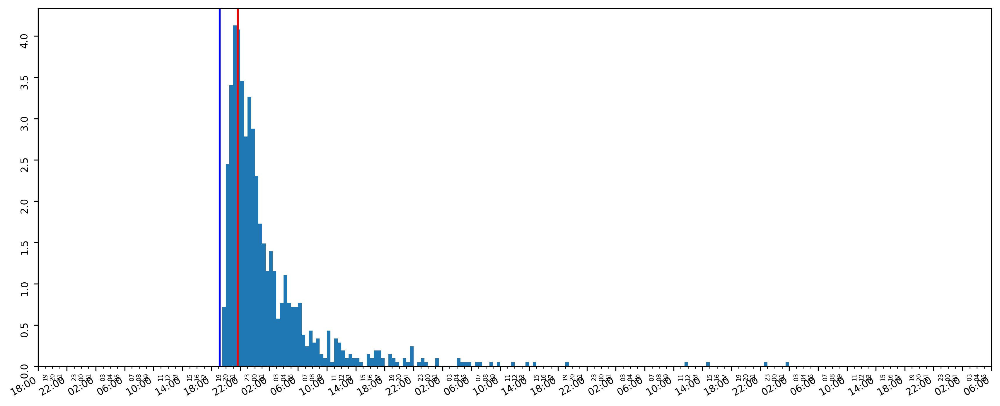

13043 2023-04-17 19:09:20.882000 2023-04-17 21:39:52.335000 [2.60885148] 0.0 2023-04-17 19:39:38.602038 2023-04-21 01:58:57.790670 3 days, 6:19:19.188632
14481


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


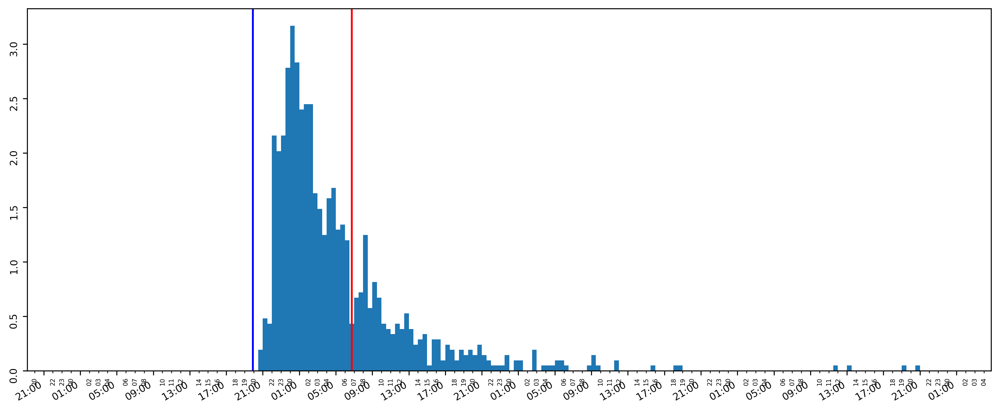

14481 2023-04-26 19:54:52.238000 2023-04-27 06:45:51.689000 [1.02111677] 0.0 2023-04-26 20:35:17.930163 2023-04-29 20:43:58.191375 3 days, 0:08:40.261212
14905


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


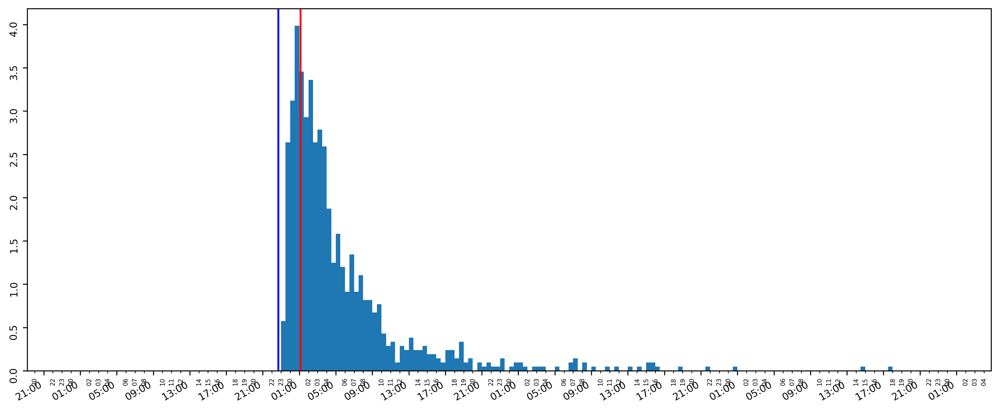

14905 2023-04-28 22:42:23.998000 2023-04-29 01:08:45.047000 [2.51306025] 0.0 2023-04-28 23:06:31.419552 2023-05-01 17:49:27.822809 2 days, 18:42:56.403257
10583


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


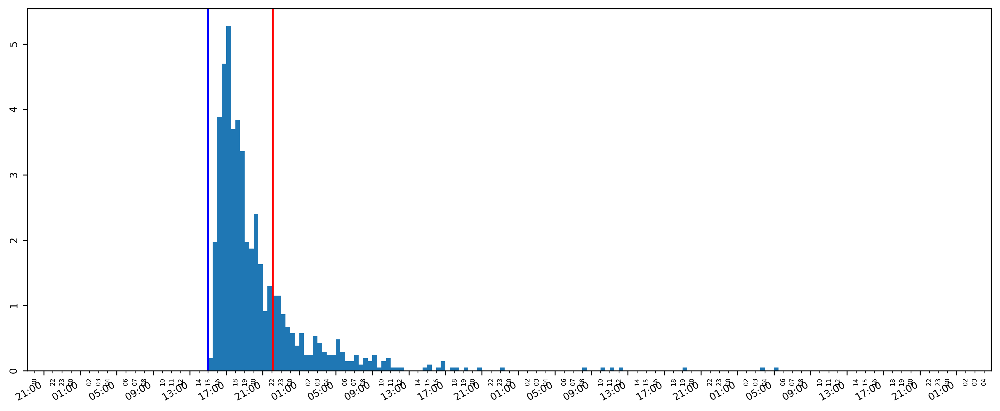

10583 2023-04-04 14:59:06.847000 2023-04-04 22:05:45.561000 [1.225542] 0.0 2023-04-04 15:15:18.067359 2023-04-07 05:16:03.385151 2 days, 14:00:45.317792
11218


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


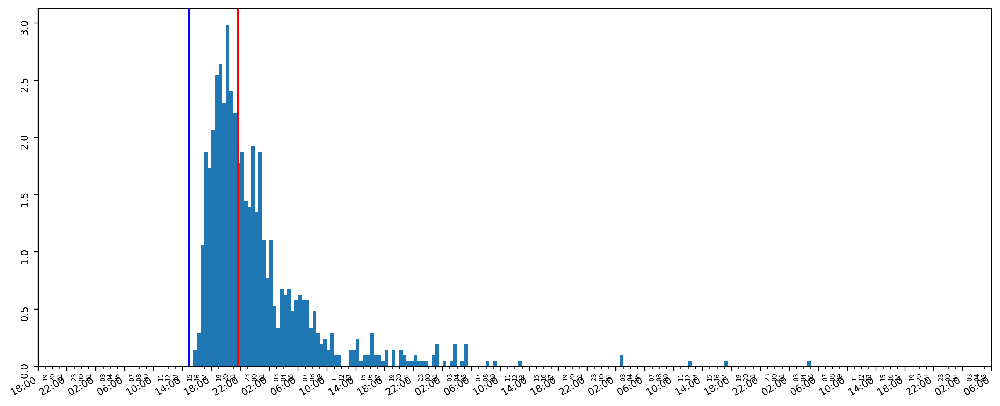

11218 2023-04-07 14:53:25.679000 2023-04-07 21:41:50.816000 [1.95467769] 0.0 2023-04-07 15:43:00.201886 2023-04-11 04:33:33.855021 3 days, 12:50:33.653135
14513


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


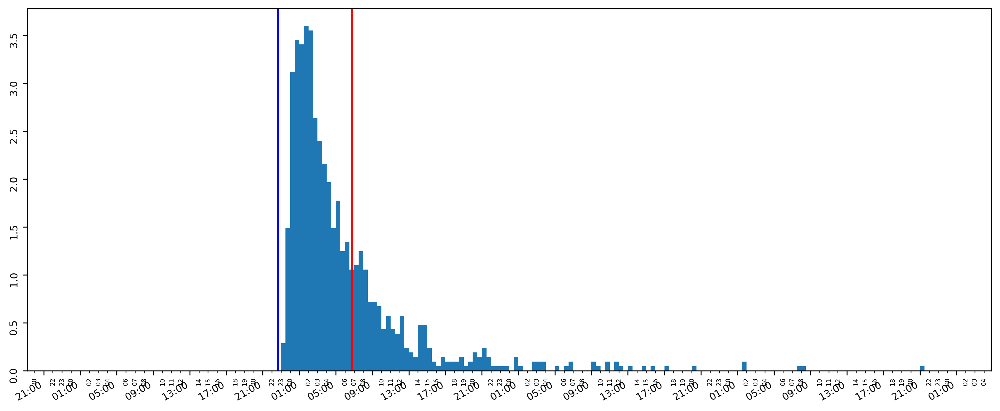

14513 2023-04-26 22:39:45.046000 2023-04-27 06:45:49.666000 [1.2818474] 0.0 2023-04-26 23:08:10.636489 2023-04-29 21:06:51.251397 2 days, 21:58:40.614908
17911


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


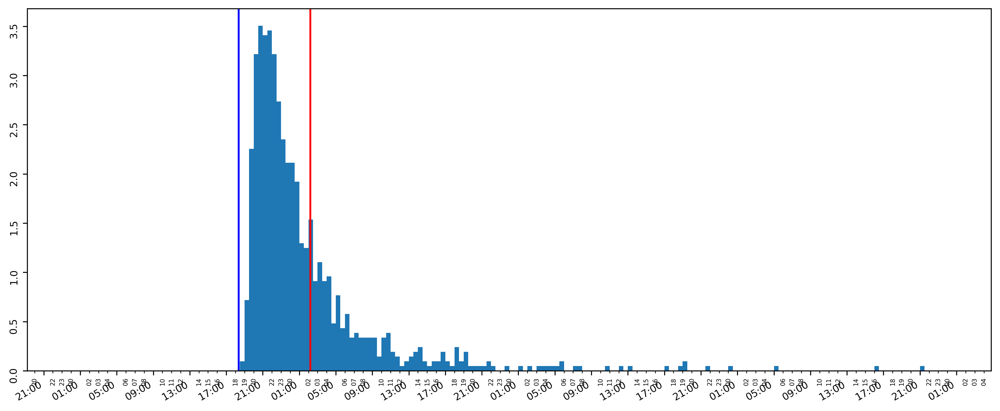

17911 2023-06-09 18:22:24.449000 2023-06-10 02:11:45.319000 [1.3786595] 0.0 2023-06-09 18:48:05.126438 2023-06-12 21:06:32.538095 3 days, 2:18:27.411657
13608


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


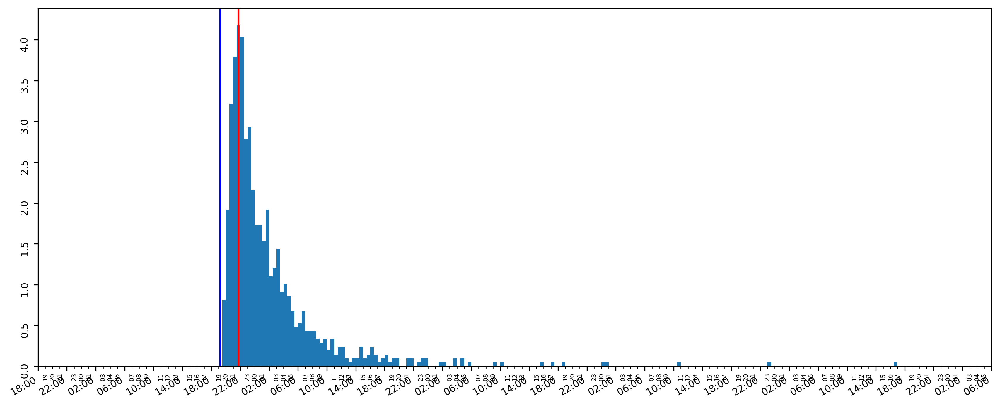

13608 2023-04-20 19:13:42.428000 2023-04-20 21:44:32.409000 [2.52247869] 0.0 2023-04-20 19:33:31.035147 2023-04-24 16:33:41.299176 3 days, 21:00:10.264029
16300


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


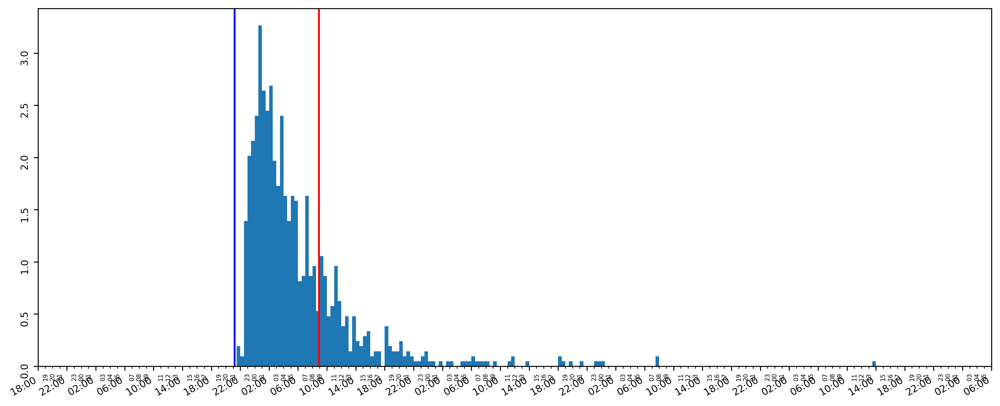

16300 2023-05-15 21:12:28.614000 2023-05-16 08:54:19.287000 [0.88076233] 0.0 2023-05-15 21:48:43.276031 2023-05-19 13:49:01.493717 3 days, 16:00:18.217686
12472


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


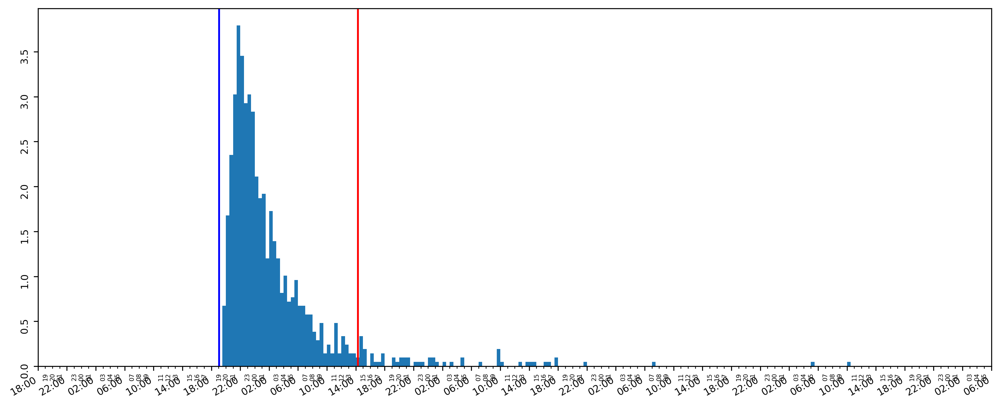

12472 2023-04-13 19:05:22.223000 2023-04-14 14:17:48.742000 [0.17340134] 0.0 2023-04-13 19:30:49.357646 2023-04-17 10:05:39.278473 3 days, 14:34:49.920827
10251


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


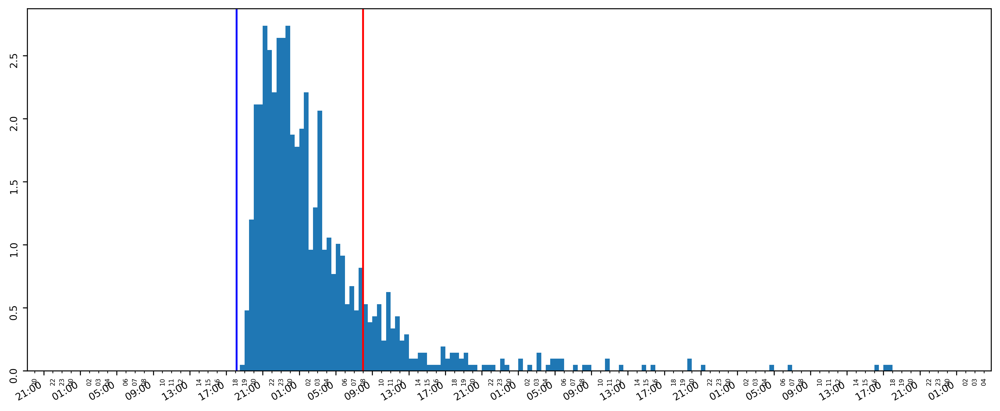

10251 2023-04-03 18:06:59.261000 2023-04-04 07:58:10.697000 [0.59259708] 0.0 2023-04-03 18:51:54.857943 2023-04-06 17:42:06.280546 2 days, 22:50:11.422603
12684


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


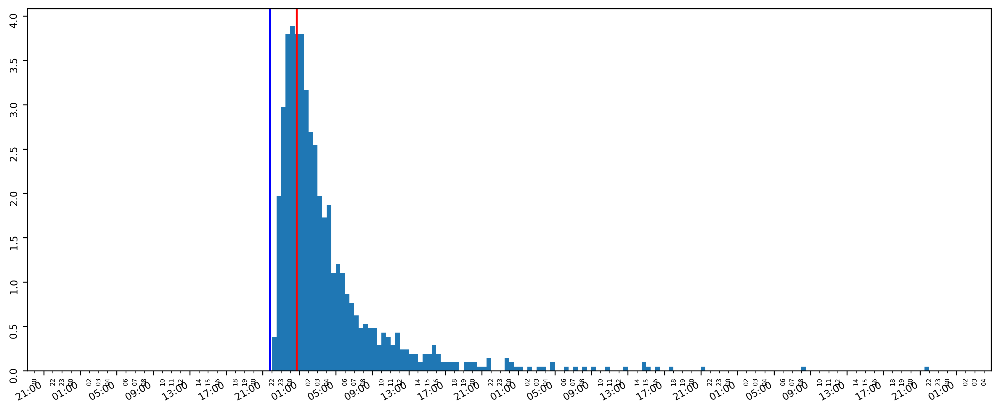

12684 2023-04-14 21:47:37.742000 2023-04-15 00:42:26.275000 [2.89946868] 0.0 2023-04-14 22:09:39.547646 2023-04-17 21:41:46.977212 2 days, 23:32:07.429566
13104


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


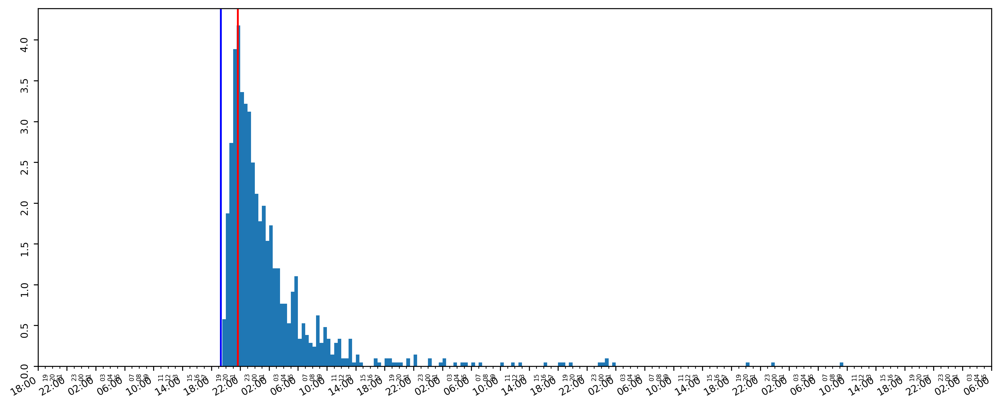

13104 2023-04-17 19:19:05.212000 2023-04-17 21:39:52.178000 [2.41287783] 0.0 2023-04-17 19:37:30.682343 2023-04-21 09:19:11.999155 3 days, 13:41:41.316812
10223


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


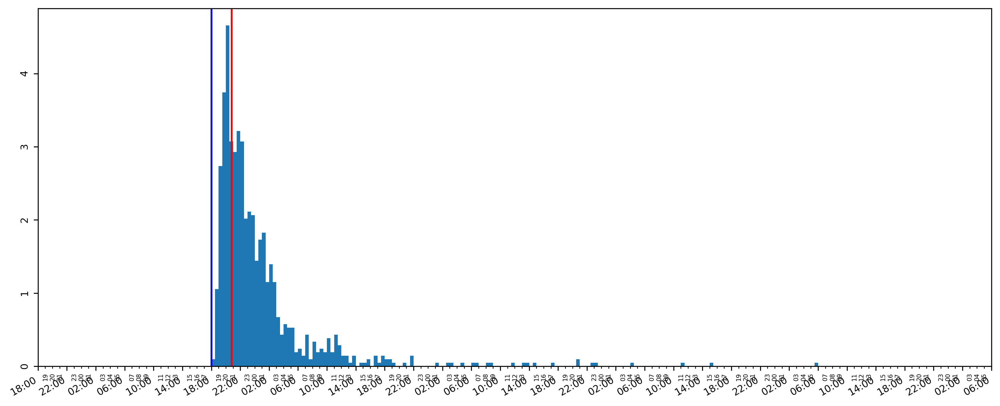

10223 2023-04-03 18:01:32.069000 2023-04-03 20:49:41.783000 [2.56787367] 0.0 2023-04-03 18:20:47.681233 2023-04-07 05:51:46.292901 3 days, 11:30:58.611668
490


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


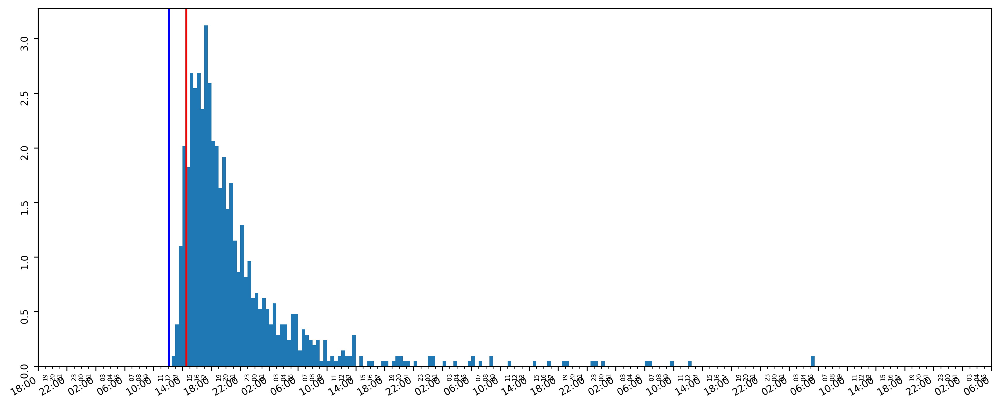

490 2023-04-11 12:08:06.588000 2023-04-11 14:32:04.671000 [1.50317999] 0.0 2023-04-11 12:55:59.863200 2023-04-15 05:09:09.633496 3 days, 16:13:09.770296
10184


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


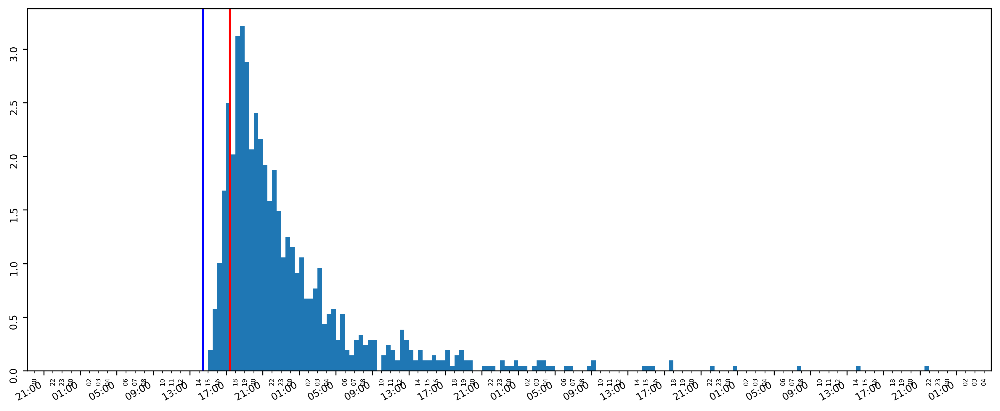

10184 2023-04-03 14:26:32.415000 2023-04-03 17:23:55.946000 [1.72046462] 0.0 2023-04-03 15:03:11.924332 2023-04-06 21:46:10.812099 3 days, 6:42:58.887767
12842


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


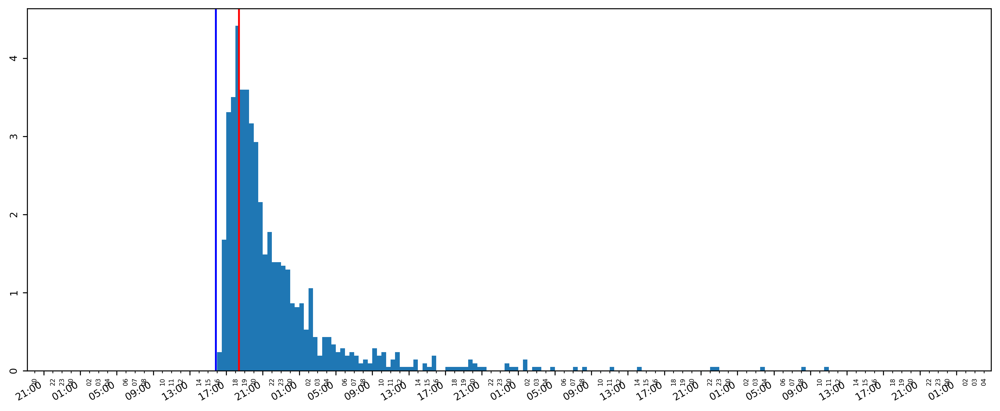

12842 2023-04-16 15:50:40.077000 2023-04-16 18:23:27.696000 [2.6948858] 0.0 2023-04-16 16:18:33.839296 2023-04-19 10:44:07.971296 2 days, 18:25:34.132000
13394


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


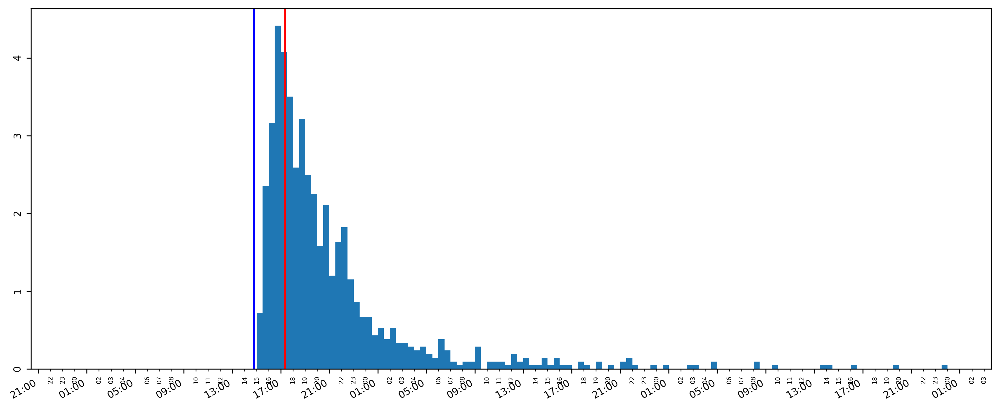

13394 2023-04-19 14:47:11.356000 2023-04-19 17:22:31.952000 [2.76911844] 0.0 2023-04-19 15:07:07.204556 2023-04-21 23:46:49.321428 2 days, 8:39:42.116872
15577


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


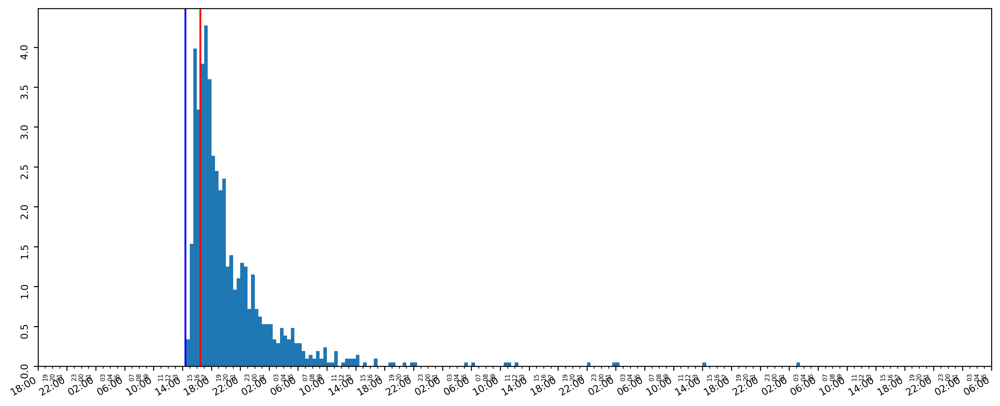

15577 2023-05-06 14:23:30.397000 2023-05-06 16:28:57.176000 [2.55658847] 0.0 2023-05-06 14:44:56.263429 2023-05-10 03:13:53.720002 3 days, 12:28:57.456573
13575


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


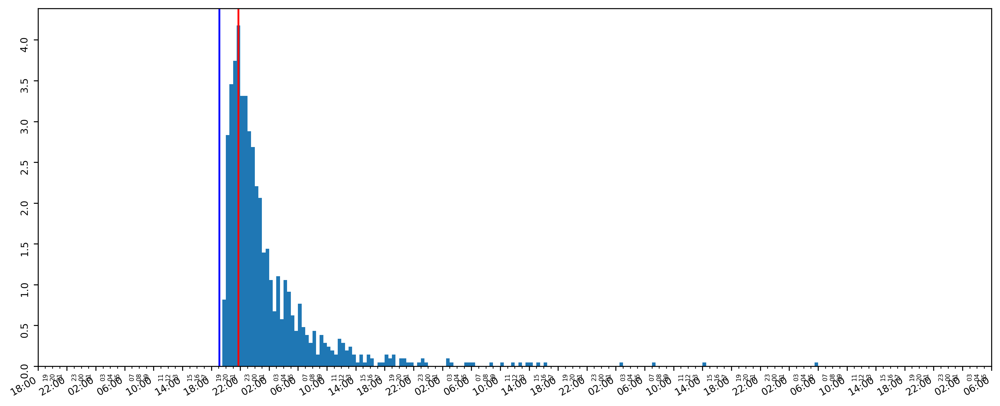

13575 2023-04-20 19:06:59.666000 2023-04-20 21:44:31.411000 [2.6707007] 0.0 2023-04-20 19:30:35.736669 2023-04-24 05:48:57.979639 3 days, 10:18:22.242970
12286


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


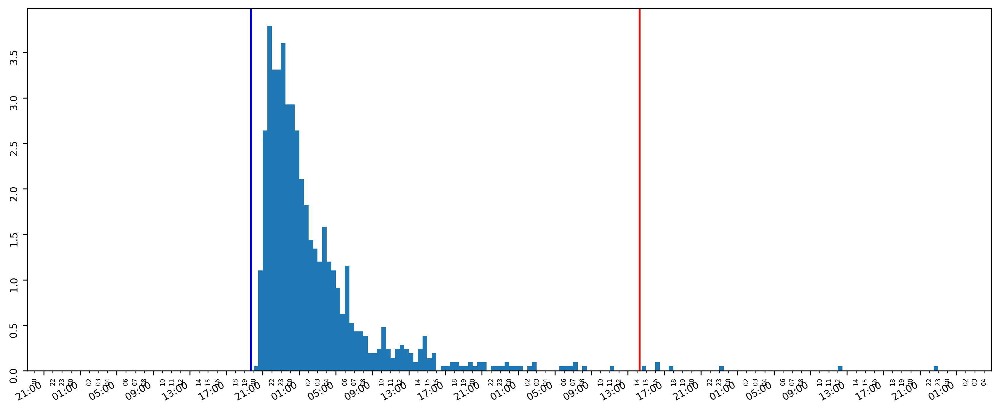

12286 2023-04-12 19:42:59.765000 2023-04-14 14:17:41.027000 [0.01306112] 0.0 2023-04-12 20:23:46.605390 2023-04-15 22:32:10.481409 3 days, 2:08:23.876019
10825


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


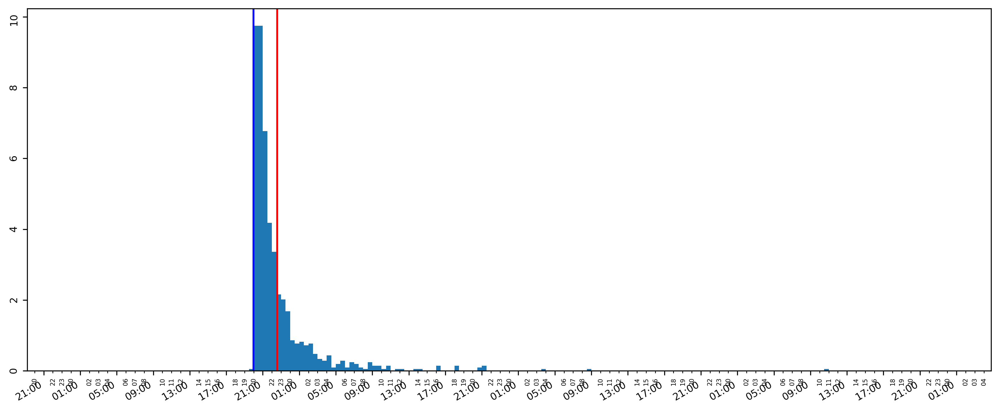

10825 2023-04-05 19:58:00.949000 2023-04-05 22:33:53.142000 [3.30219389] 0.0 2023-04-05 19:58:51.099476 2023-04-08 10:46:02.883605 2 days, 14:47:11.784129
14873


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


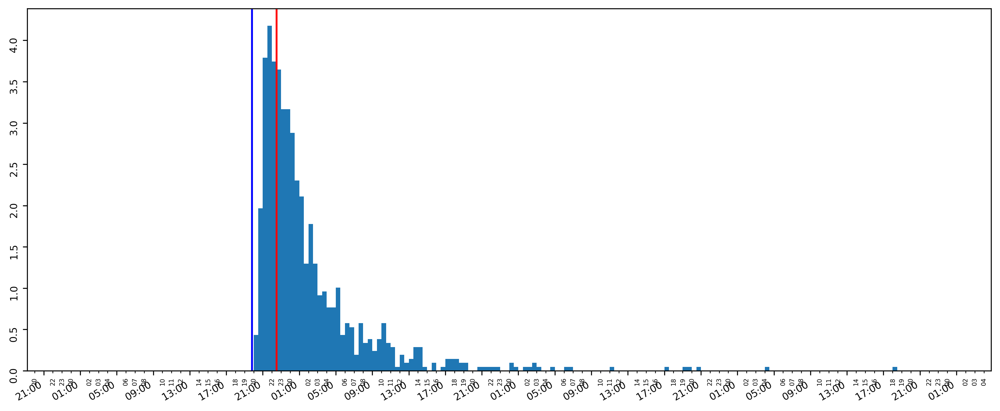

14873 2023-04-28 19:48:58.358000 2023-04-28 22:30:55.718000 [2.89333269] 0.0 2023-04-28 20:16:20.715092 2023-05-01 18:02:23.933706 2 days, 21:46:03.218614
13690


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


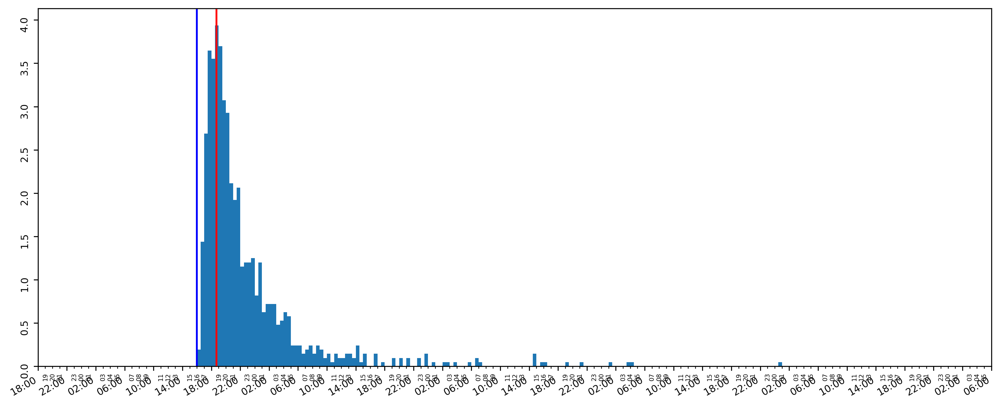

13690 2023-04-21 16:00:15.252000 2023-04-21 18:42:32.085000 [2.572171] 0.0 2023-04-21 16:20:09.106752 2023-04-25 00:44:35.743594 3 days, 8:24:26.636842
16931


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


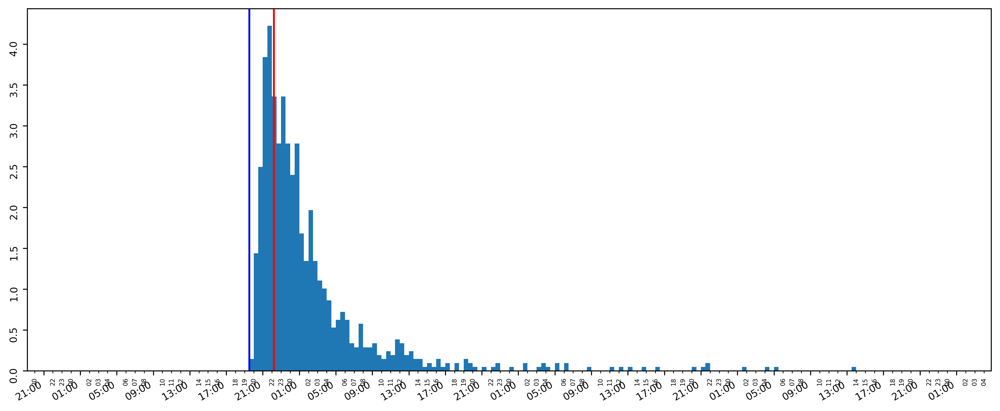

16931 2023-05-26 19:32:30.506000 2023-05-26 22:13:10.406000 [2.63106126] 0.0 2023-05-26 19:56:19.272909 2023-05-29 13:52:37.348795 2 days, 17:56:18.075886
14954


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


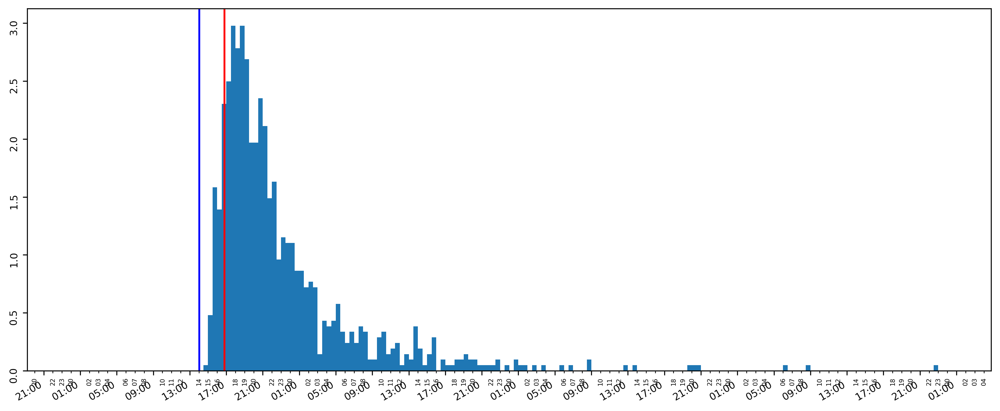

14954 2023-04-29 14:02:12.876000 2023-04-29 16:48:04.703000 [1.74053732] 0.0 2023-04-29 14:50:24.470458 2023-05-02 22:45:08.681710 3 days, 7:54:44.211252
14424


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


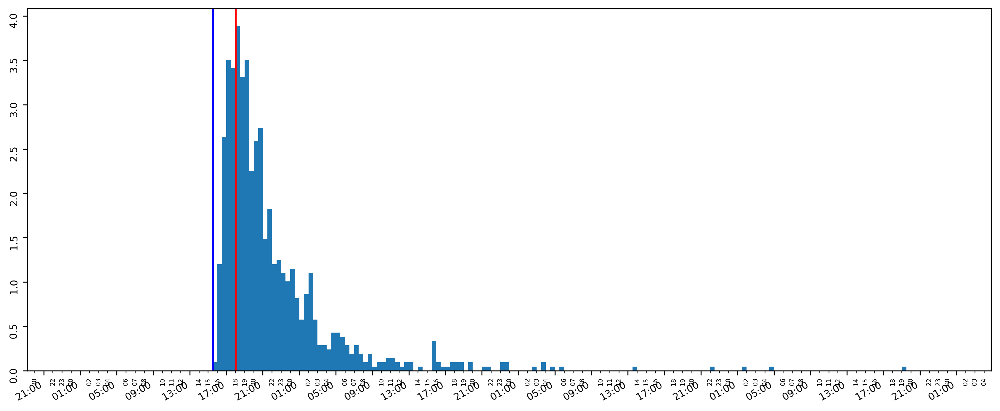

14424 2023-04-26 15:32:06.536000 2023-04-26 18:01:43.236000 [2.6392829] 0.0 2023-04-26 15:50:34.921998 2023-04-29 19:23:01.275382 3 days, 3:32:26.353384
10346


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


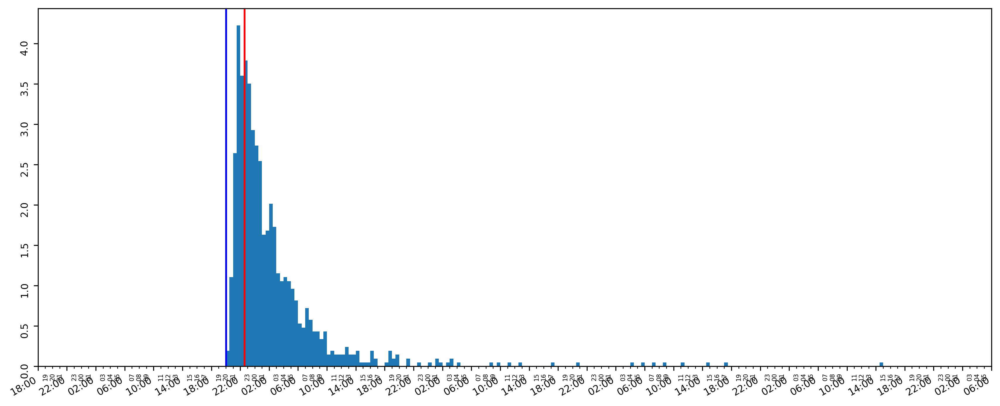

10346 2023-04-03 20:02:31.462000 2023-04-03 22:36:43.082000 [2.54593091] 0.0 2023-04-03 20:21:28.274142 2023-04-07 14:45:47.725663 3 days, 18:24:19.451521
750


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


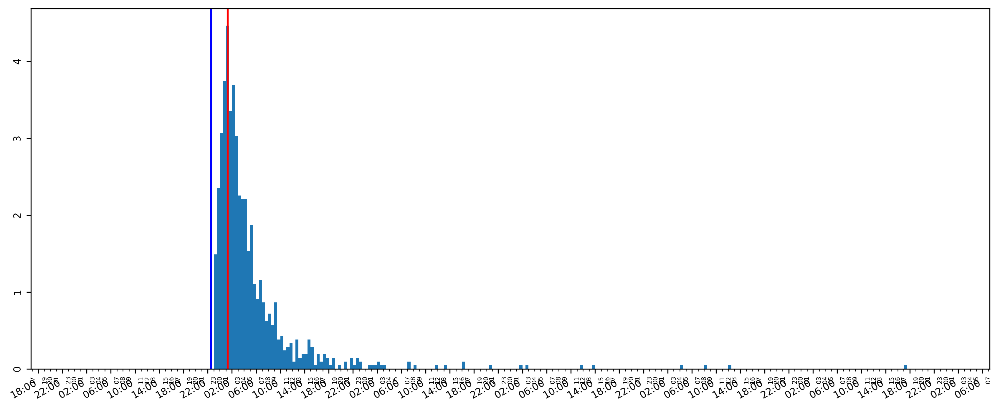

750 2023-04-11 22:33:19.435000 2023-04-12 01:16:59.870000 [2.55411282] 0.0 2023-04-11 23:02:43.157736 2023-04-16 17:19:57.914143 4 days, 18:17:14.756407
15115


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


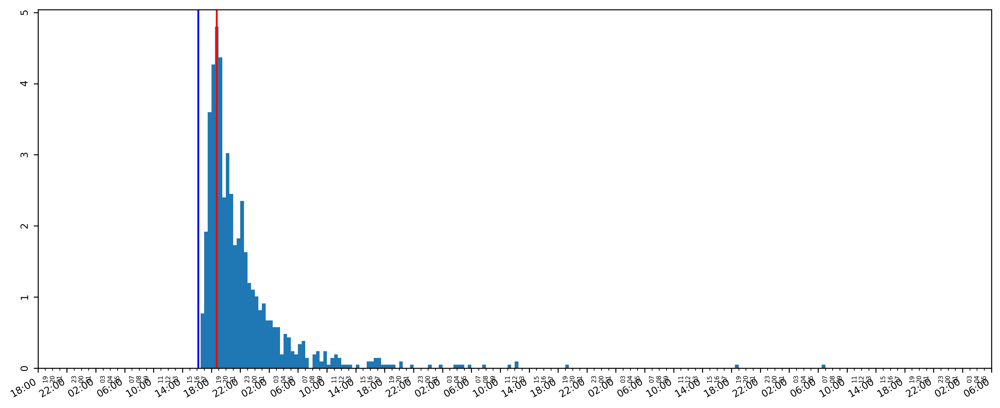

15115 2023-05-02 16:12:41.436000 2023-05-02 18:45:25.753000 [2.87033396] 0.0 2023-05-02 16:36:07.880493 2023-05-06 06:52:44.792149 3 days, 14:16:36.911656
15243


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


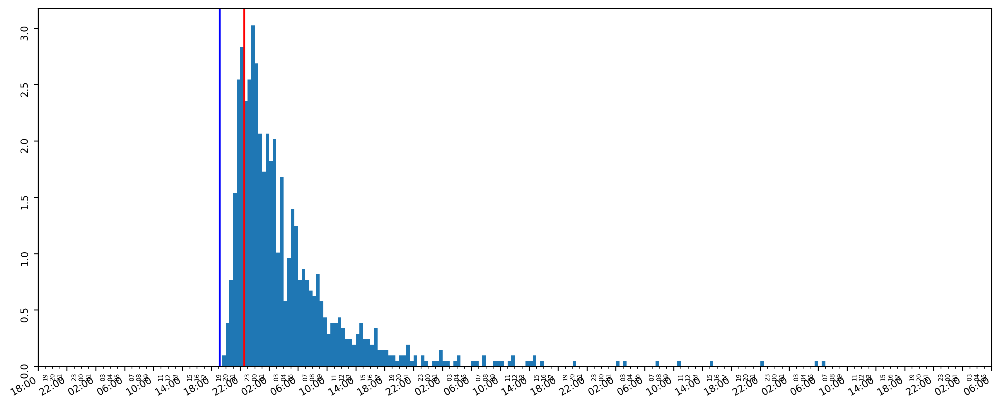

15243 2023-05-02 19:08:18.830000 2023-05-02 22:32:44.256000 [1.83507976] 0.0 2023-05-02 19:42:50.645813 2023-05-06 06:56:32.501213 3 days, 11:13:41.855400
12147


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


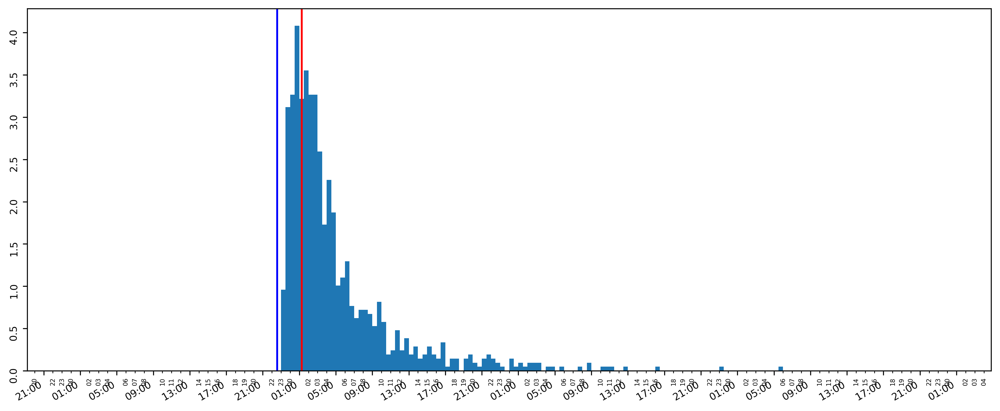

12147 2023-04-11 22:35:13.513000 2023-04-12 01:17:00.178000 [2.83976889] 0.0 2023-04-11 23:09:21.302770 2023-04-14 05:43:01.062103 2 days, 6:33:39.759333
17924


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


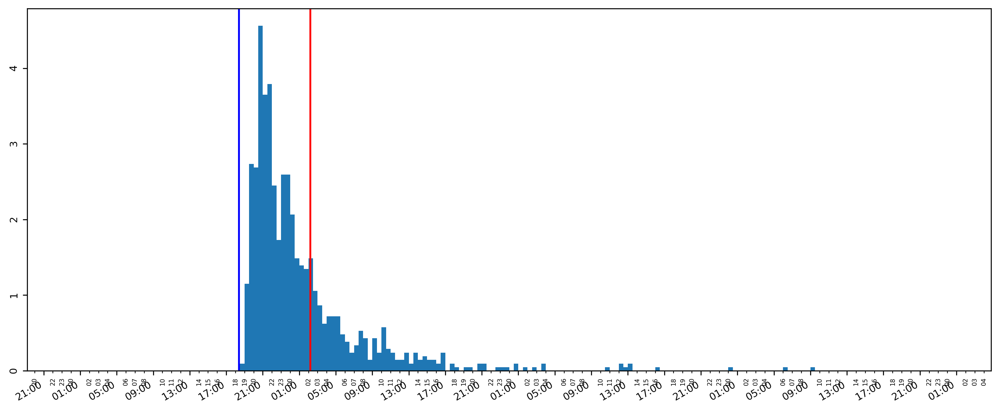

17924 2023-06-09 18:24:18.695000 2023-06-10 02:11:46.069000 [1.30599753] 0.0 2023-06-09 18:48:54.120437 2023-06-12 09:20:50.134619 2 days, 14:31:56.014182
10389


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


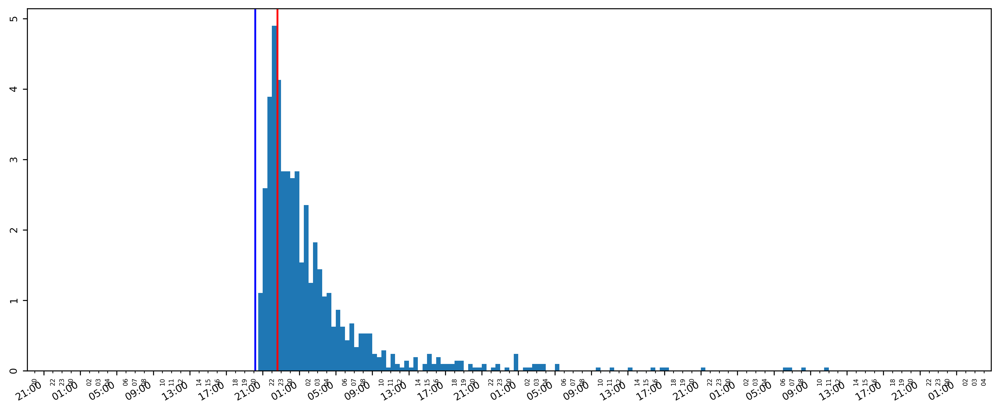

10389 2023-04-03 20:10:00.797000 2023-04-03 22:36:44.616000 [2.73530756] 0.0 2023-04-03 20:30:40.675886 2023-04-06 10:31:02.290209 2 days, 14:00:21.614323
395


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


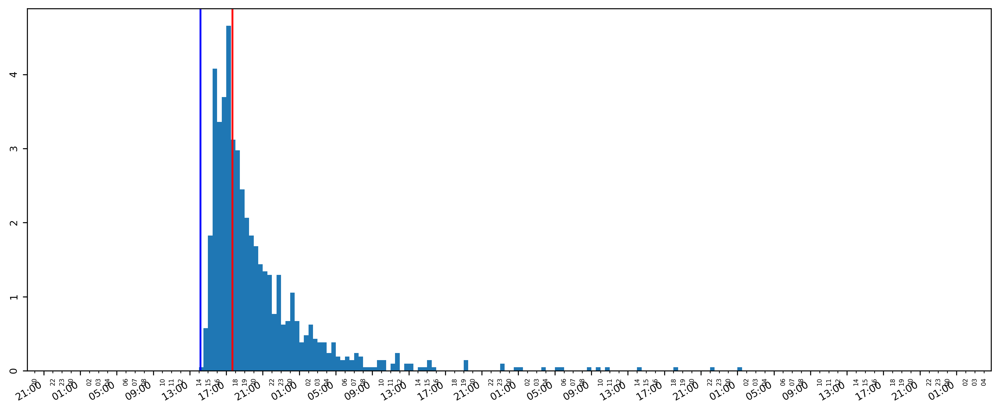

395 2023-04-10 14:09:46.559000 2023-04-10 17:40:50.279000 [2.91035954] 0.0 2023-04-10 14:25:42.942782 2023-04-13 01:22:14.413762 2 days, 10:56:31.470980
13962


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


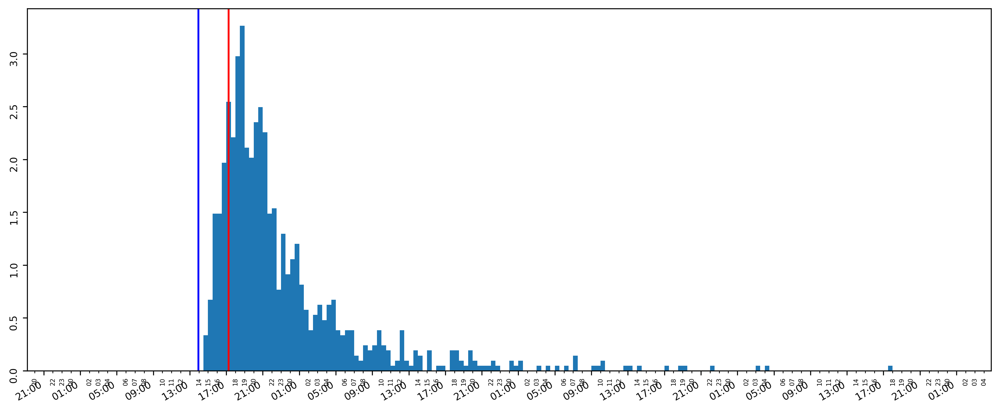

13962 2023-04-23 13:56:08.689000 2023-04-23 17:16:04.546000 [1.82474219] 0.0 2023-04-23 14:30:57.220880 2023-04-26 17:56:14.598984 3 days, 3:25:17.378104
16914


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


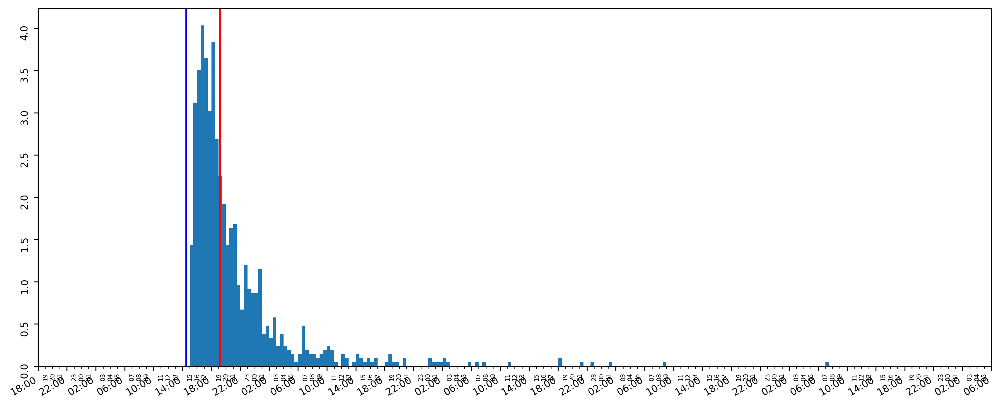

16914 2023-05-26 14:31:33.124000 2023-05-26 19:10:41.842000 [2.33949918] 0.0 2023-05-26 15:06:51.873529 2023-05-30 07:09:34.289651 3 days, 16:02:42.416122
16734


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


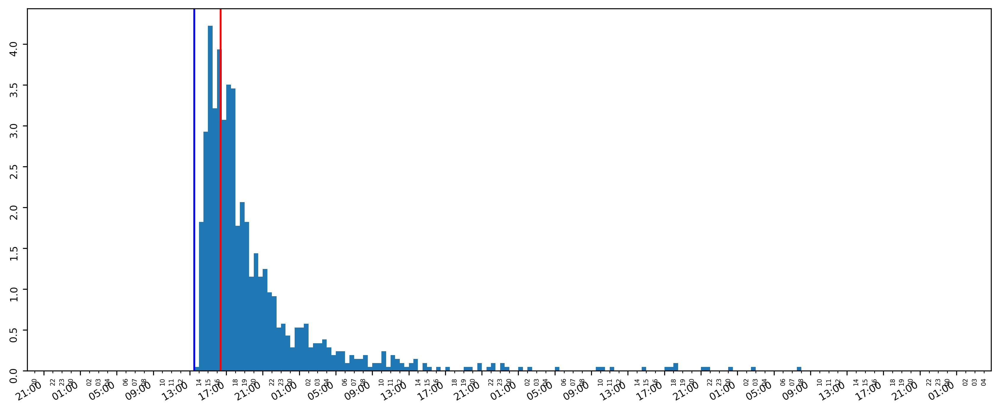

16734 2023-05-23 13:29:33.325000 2023-05-23 16:21:48.745000 [2.62099571] 0.0 2023-05-23 13:46:59.614813 2023-05-26 07:33:31.970252 2 days, 17:46:32.355439
12511


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


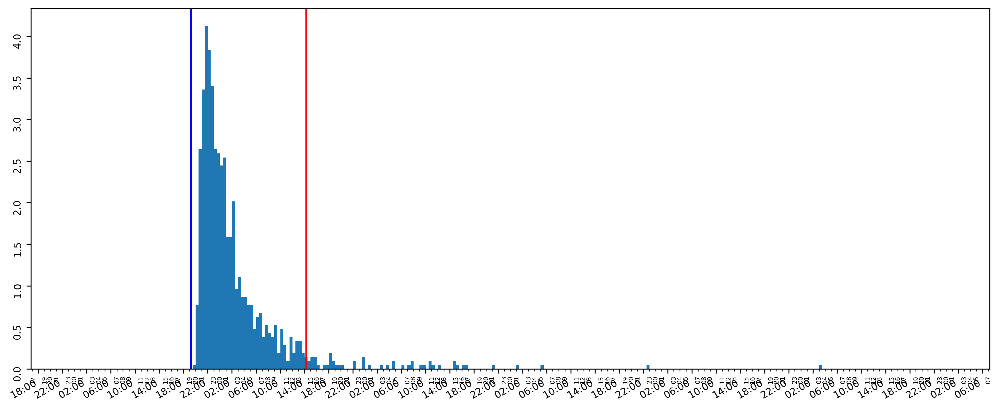

12511 2023-04-13 19:14:38.493000 2023-04-14 14:17:45.589000 [0.17866783] 0.0 2023-04-13 19:42:10.966511 2023-04-18 03:23:33.394031 4 days, 7:41:22.427520
14282


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


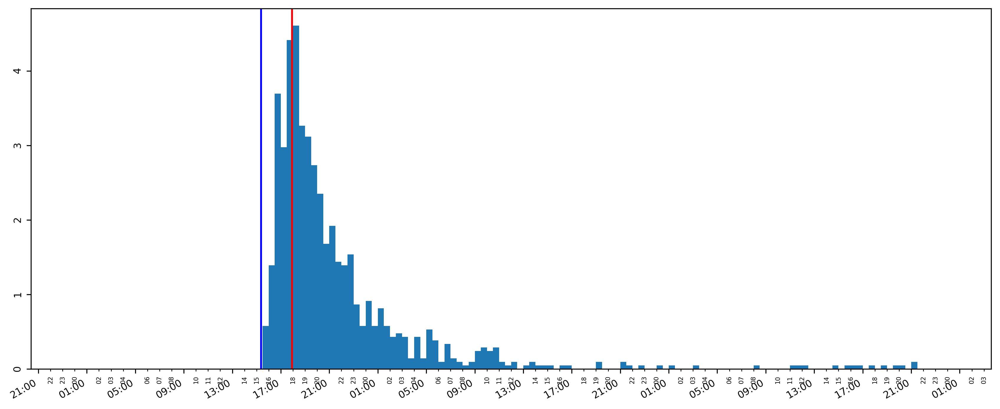

14282 2023-04-25 15:23:00.297000 2023-04-25 17:55:33.349000 [2.78190568] 75.34947052001952 2023-04-25 15:34:05.359059 2023-04-27 21:26:56.606823 2 days, 5:52:51.247764
12257


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


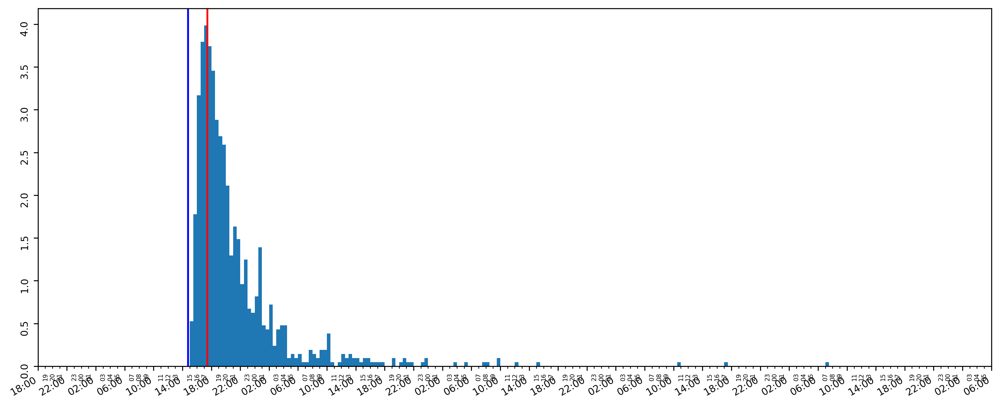

12257 2023-04-12 14:46:49.916000 2023-04-12 17:28:04.249000 [2.68510106] 0.0 2023-04-12 15:13:01.684412 2023-04-16 07:16:36.873062 3 days, 16:03:35.188650
17112


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


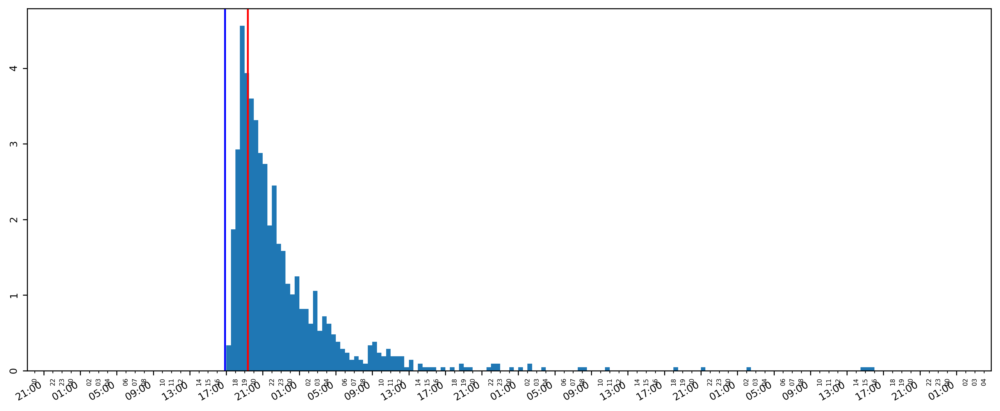

17112 2023-05-31 16:52:51.913000 2023-05-31 19:22:18.360000 [2.7190757] 24.7484275817871 2023-05-31 17:14:41.441851 2023-06-03 15:38:49.323495 2 days, 22:24:07.881644
14799


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


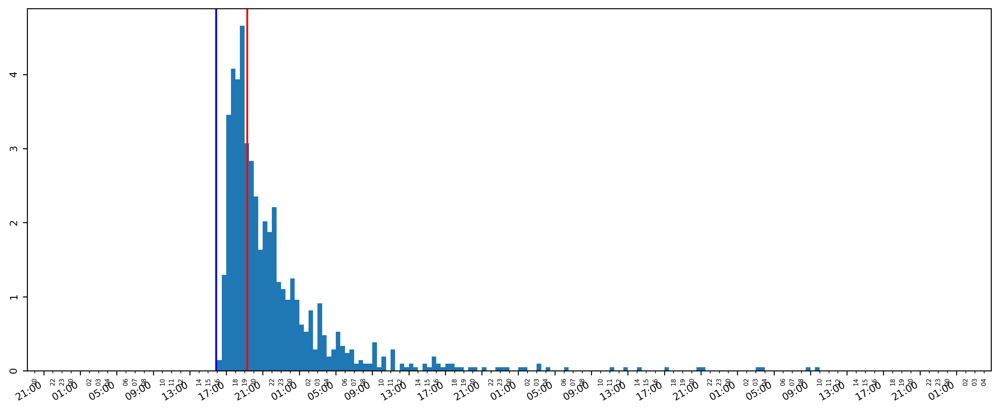

14799 2023-04-28 15:53:39.186000 2023-04-28 19:17:39.193000 [2.71567722] 0.0 2023-04-28 16:13:14.128708 2023-05-01 09:32:22.757695 2 days, 17:19:08.628987
15288


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


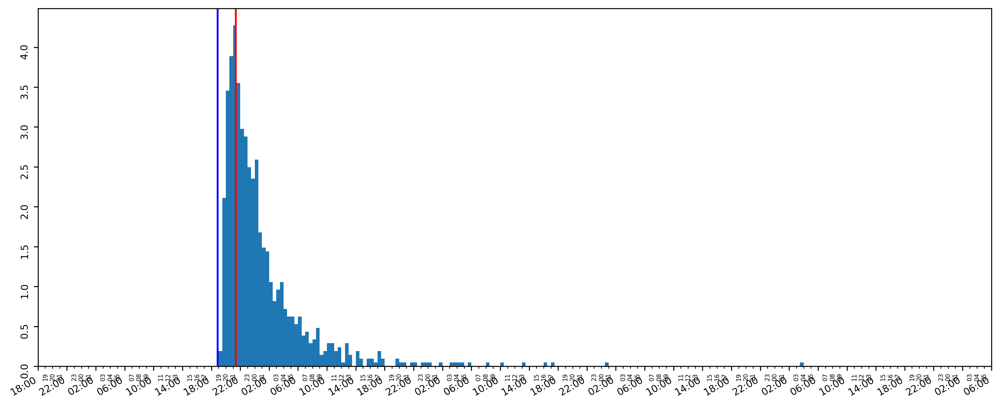

15288 2023-05-03 18:52:41.817000 2023-05-03 21:21:52.679000 [2.82643544] 70.30542755126953 2023-05-03 19:17:14.431034 2023-05-07 03:34:30.908935 3 days, 8:17:16.477901
16658


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


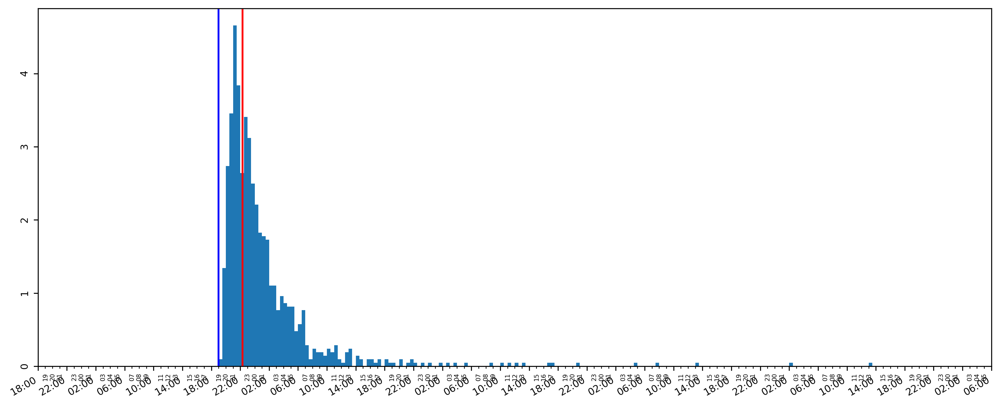

16658 2023-05-22 18:58:15.748000 2023-05-22 22:19:09.905000 [2.74588926] 0.0 2023-05-22 19:19:48.602668 2023-05-26 13:19:28.751277 3 days, 17:59:40.148609
15480


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


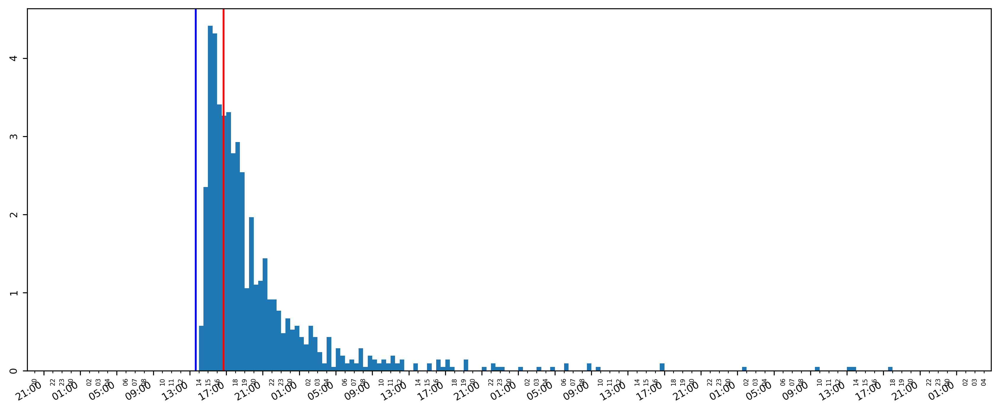

15480 2023-05-05 13:39:34.013000 2023-05-05 16:42:36.239000 [2.65381744] 59.313462066650395 2023-05-05 14:03:42.171189 2023-05-08 17:53:41.012126 3 days, 3:49:58.840937
13015


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


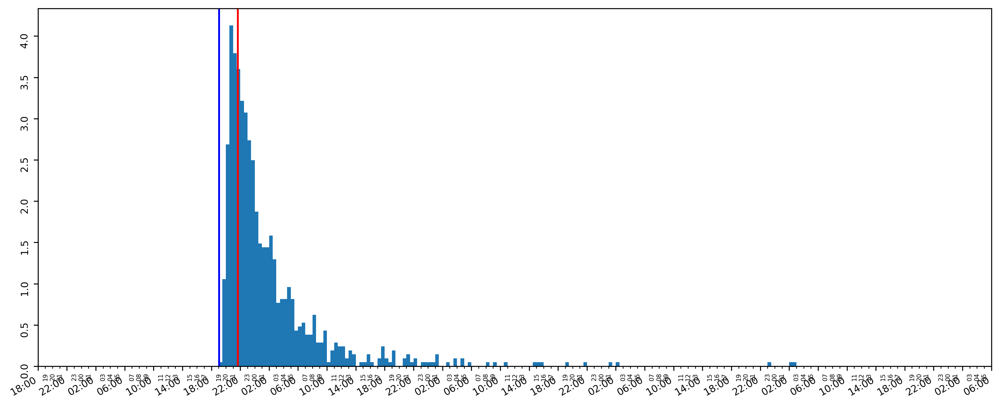

13015 2023-04-17 19:04:21.664000 2023-04-17 21:39:52.107000 [2.50543954] 0.0 2023-04-17 19:25:27.270669 2023-04-21 02:37:11.365583 3 days, 7:11:44.094914
15859


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


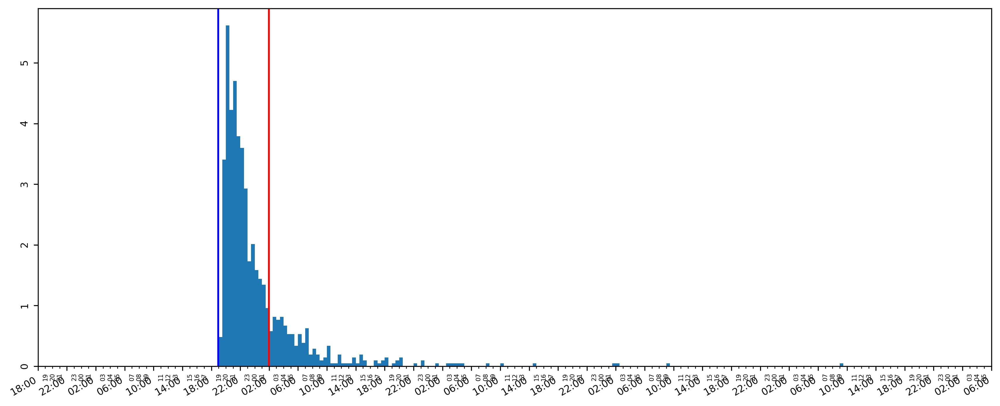

15859 2023-05-09 18:57:24.058000 2023-05-10 01:57:32.835000 [1.12432286] 0.0 2023-05-09 19:16:05.239684 2023-05-13 09:24:19.887002 3 days, 14:08:14.647318
12497


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


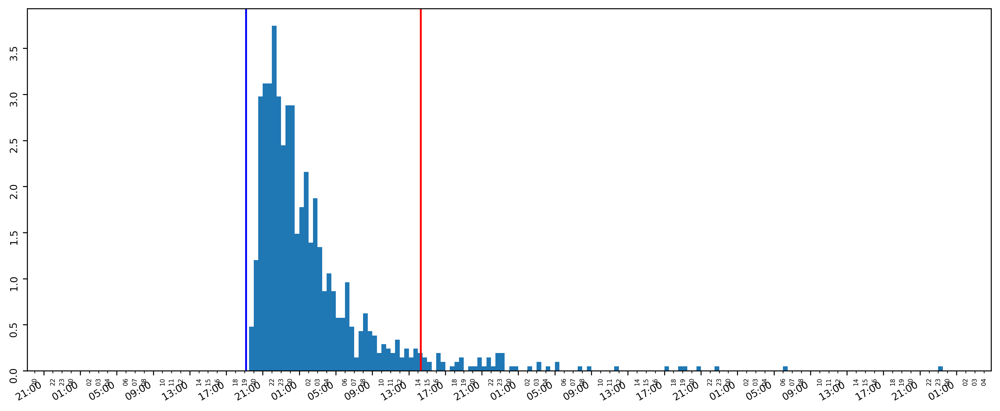

12497 2023-04-13 19:10:25.919000 2023-04-14 14:17:48.811000 [0.16067515] 0.0 2023-04-13 19:40:20.389091 2023-04-16 23:27:00.296989 3 days, 3:46:39.907898
15649


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


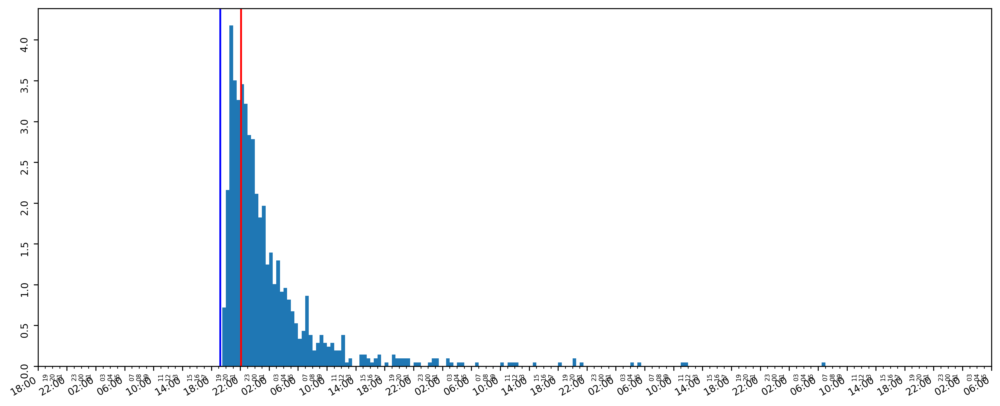

15649 2023-05-08 19:13:12.740000 2023-05-08 22:06:37.221000 [2.5729573] 0.0 2023-05-08 19:31:14.245280 2023-05-12 06:46:50.756696 3 days, 11:15:36.511416
17134


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


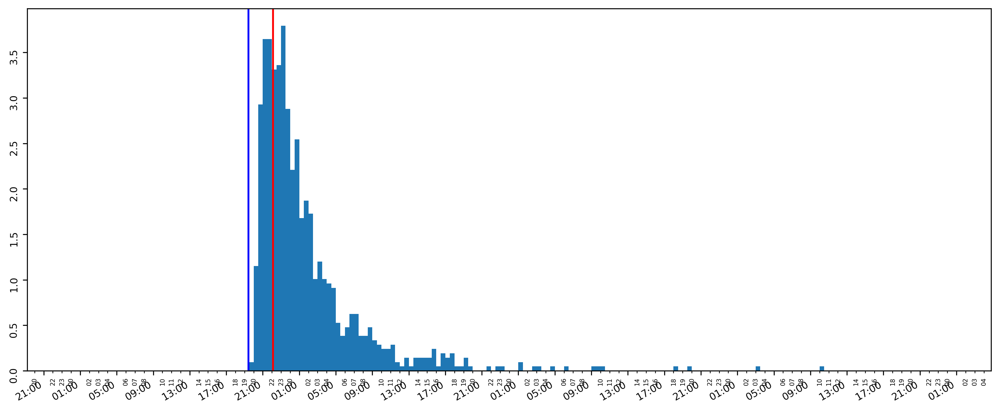

17134 2023-05-31 19:25:58.979000 2023-05-31 22:07:17.786000 [2.85419233] 0.0 2023-05-31 19:54:40.491195 2023-06-03 10:04:48.763039 2 days, 14:10:08.271844
16065


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


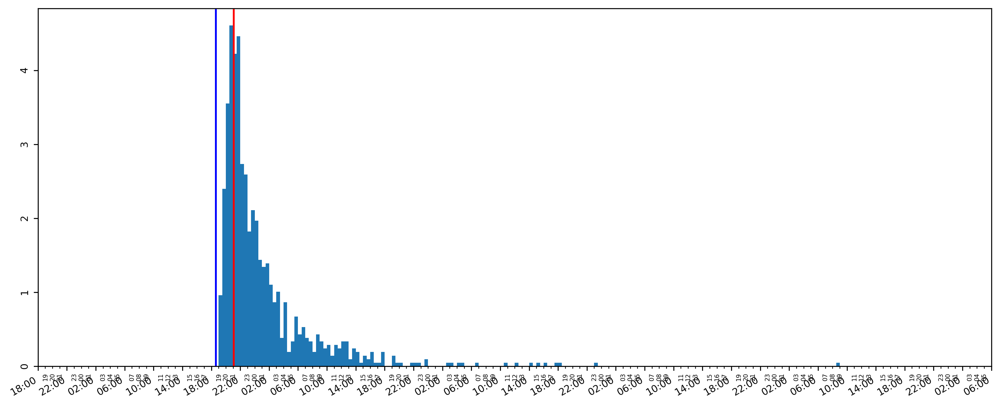

16065 2023-05-11 18:37:01.323000 2023-05-11 21:06:19.821000 [2.7949123] 0.0 2023-05-11 19:06:08.831120 2023-05-15 08:37:59.894979 3 days, 13:31:51.063859
11139


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


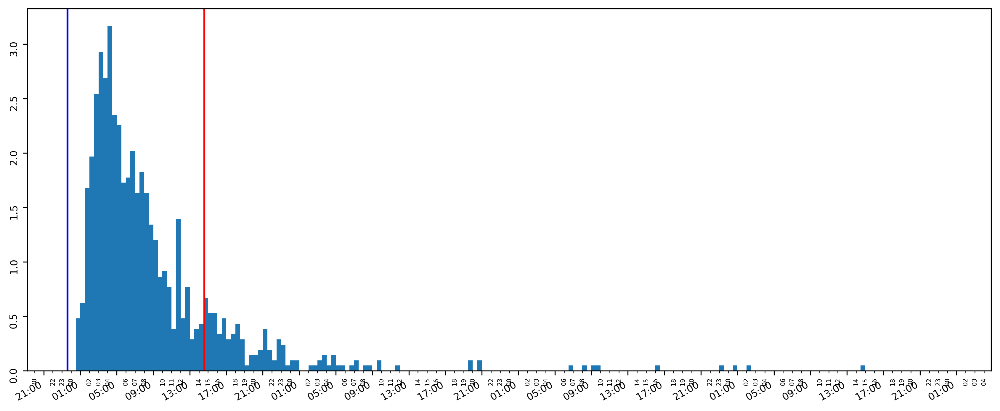

11139 2023-04-06 23:35:36.732000 2023-04-07 14:36:19.991000 [0.51849362] 0.0 2023-04-07 00:32:49.865553 2023-04-10 14:31:21.006106 3 days, 13:58:31.140553
16972


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


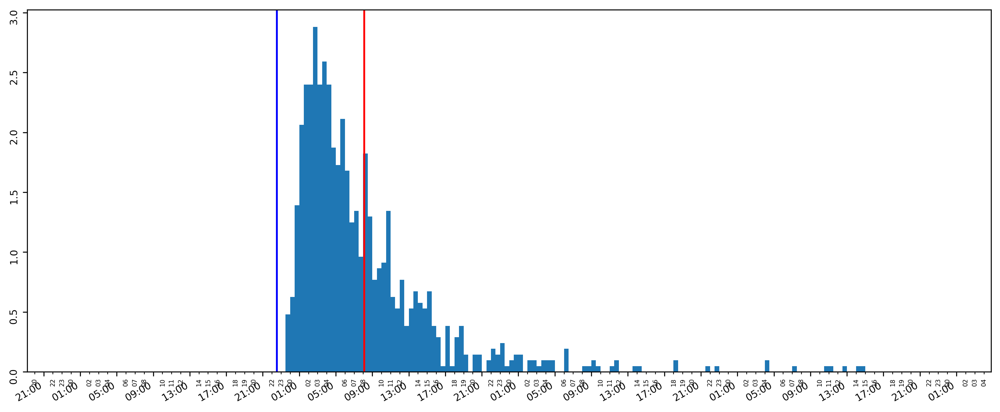

16972 2023-05-26 22:32:01.721000 2023-05-27 08:06:04.702000 [1.31200804] 0.0 2023-05-26 23:34:12.613543 2023-05-29 14:31:14.141560 2 days, 14:57:01.528017
13853


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


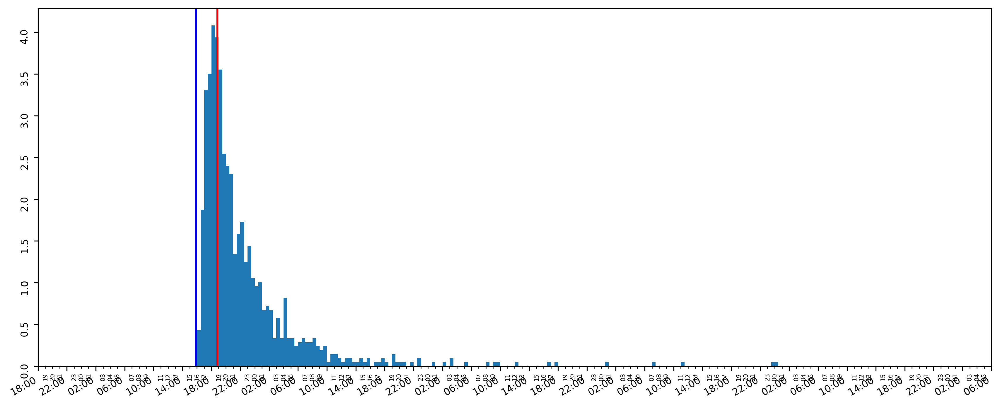

13853 2023-04-22 15:52:09.151000 2023-04-22 18:50:41.819000 [2.60853617] 0.0 2023-04-22 16:19:20.072258 2023-04-26 00:10:39.908511 3 days, 7:51:19.836253
16978


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


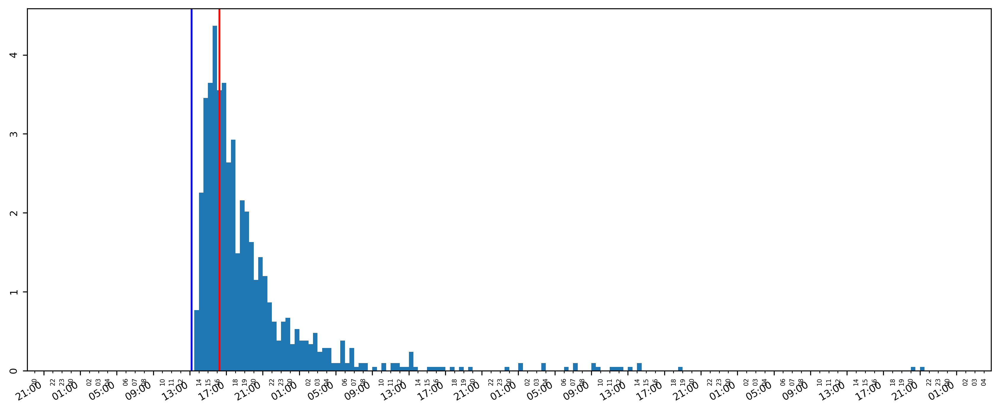

16978 2023-05-27 13:12:46.524000 2023-05-27 16:15:25.400000 [2.71620758] 0.0 2023-05-27 13:34:21.731474 2023-05-30 21:08:57.521598 3 days, 7:34:35.790124
15352


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


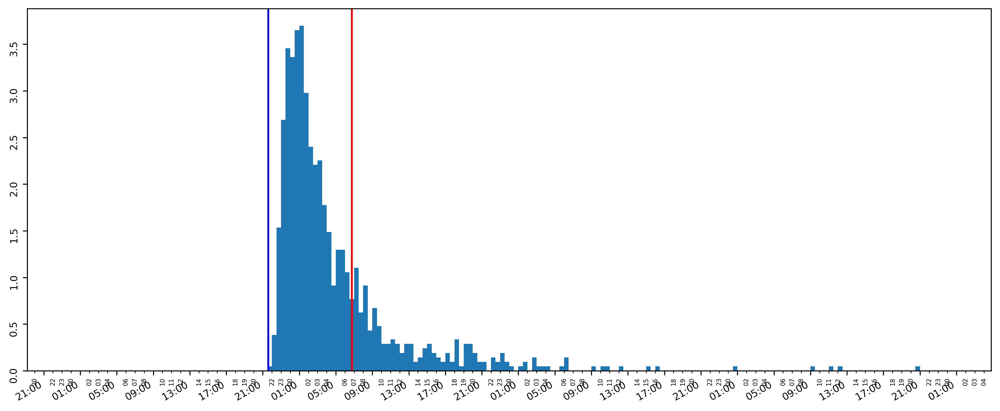

15352 2023-05-03 21:35:26.490000 2023-05-04 06:45:55.522000 [0.99671881] 0.0 2023-05-03 21:59:09.178638 2023-05-06 20:47:43.296488 2 days, 22:48:34.117850
10531


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


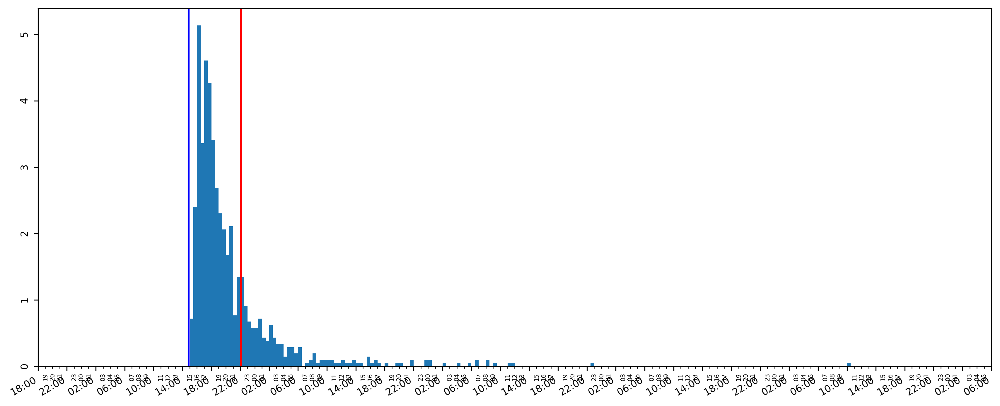

10531 2023-04-04 14:51:24.028000 2023-04-04 22:05:44.880000 [1.2331408] 0.0 2023-04-04 15:07:09.399879 2023-04-08 10:17:18.784145 3 days, 19:10:09.384266
567


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


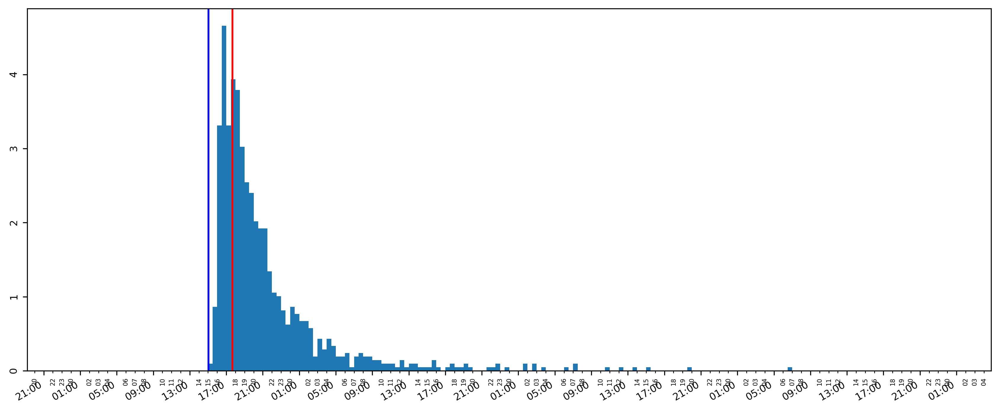

567 2023-04-11 15:02:21.079000 2023-04-11 17:41:11.755000 [2.82837599] 0.0 2023-04-11 15:25:31.038236 2023-04-14 06:53:11.861110 2 days, 15:27:40.822874
13775


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


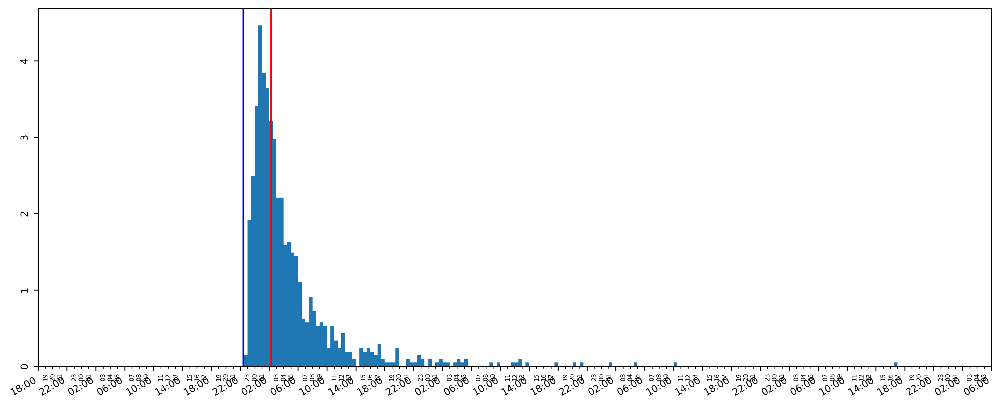

13775 2023-04-21 22:26:22.615000 2023-04-22 02:16:57.496000 [2.75942502] 0.0 2023-04-21 22:52:00.489112 2023-04-25 16:53:25.351116 3 days, 18:01:24.862004
16231


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


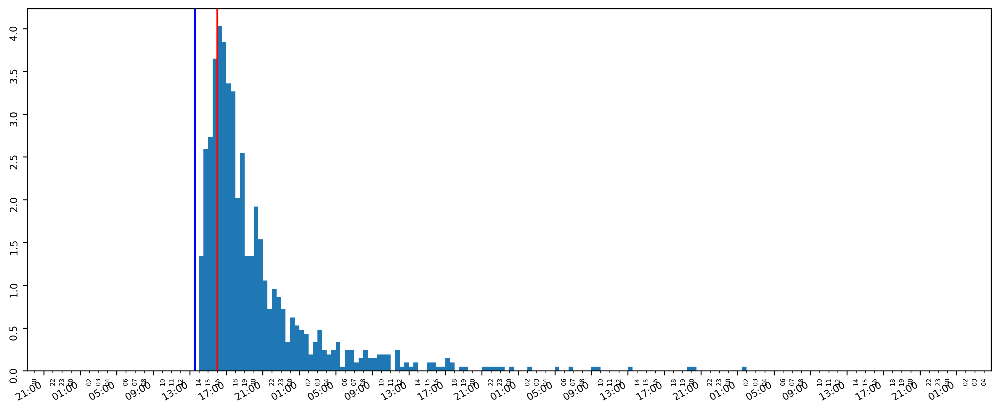

16231 2023-05-15 13:34:22.608000 2023-05-15 16:01:27.006000 [2.66994393] 0.0 2023-05-15 14:03:47.266326 2023-05-18 01:55:15.549417 2 days, 11:51:28.283091
15760


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


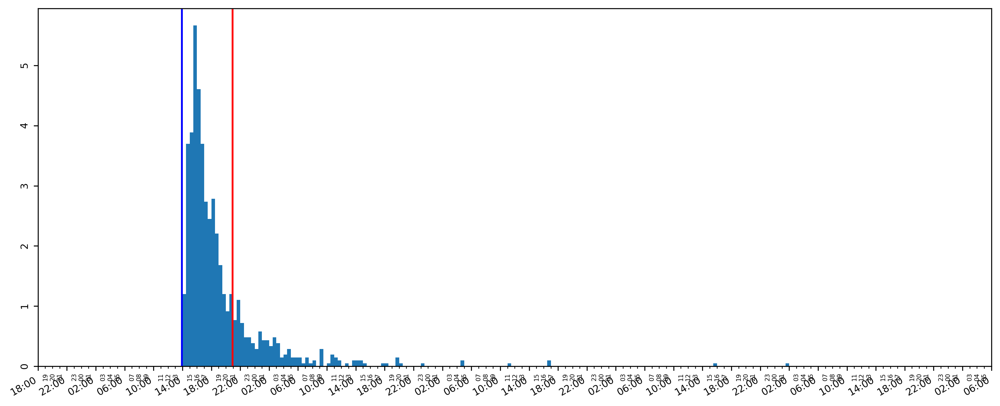

15760 2023-05-09 13:55:07.580000 2023-05-09 20:55:32.282000 [1.14038757] 0.0 2023-05-09 14:05:39.101257 2023-05-13 01:30:59.943570 3 days, 11:25:20.842313
15384


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


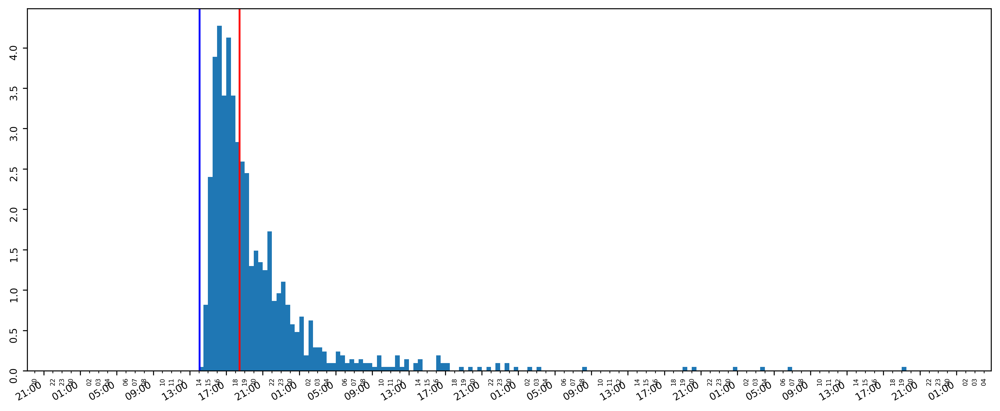

15384 2023-05-04 14:03:51.634000 2023-05-04 18:27:14.647000 [2.60817848] 0.0 2023-05-04 14:29:28.855086 2023-05-07 19:24:03.507084 3 days, 4:54:34.651998
10135


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


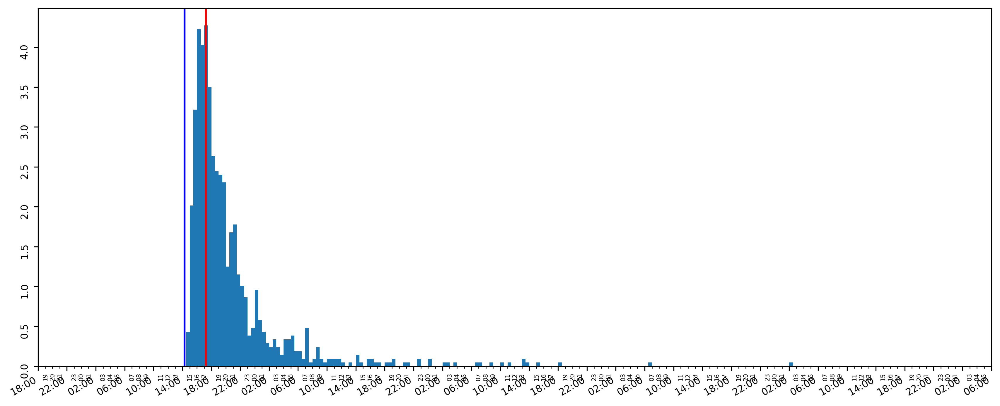

10135 2023-04-03 14:18:19.550000 2023-04-03 17:13:51.711000 [2.79298083] 0.0 2023-04-03 14:40:03.348891 2023-04-07 02:08:48.875901 3 days, 11:28:45.527010
713


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


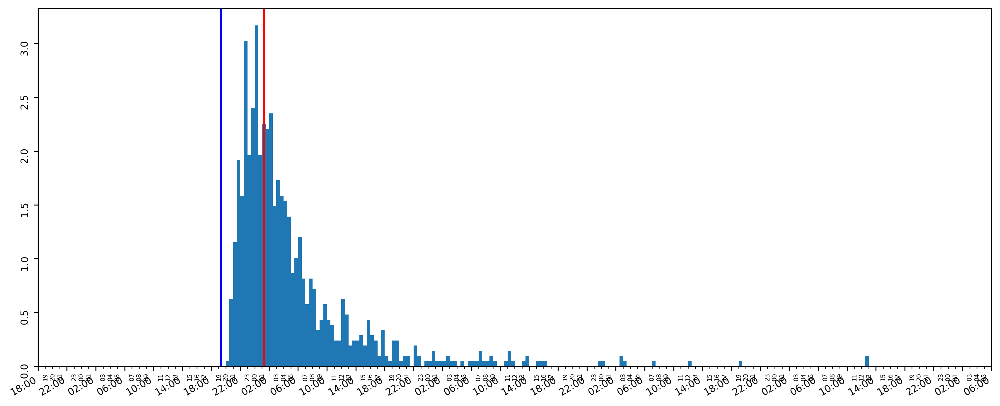

713 2023-04-11 19:21:41.080000 2023-04-12 01:19:38.307000 [1.96807423] 0.0 2023-04-11 20:24:25.543591 2023-04-15 12:49:57.861485 3 days, 16:25:32.317894
15619


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


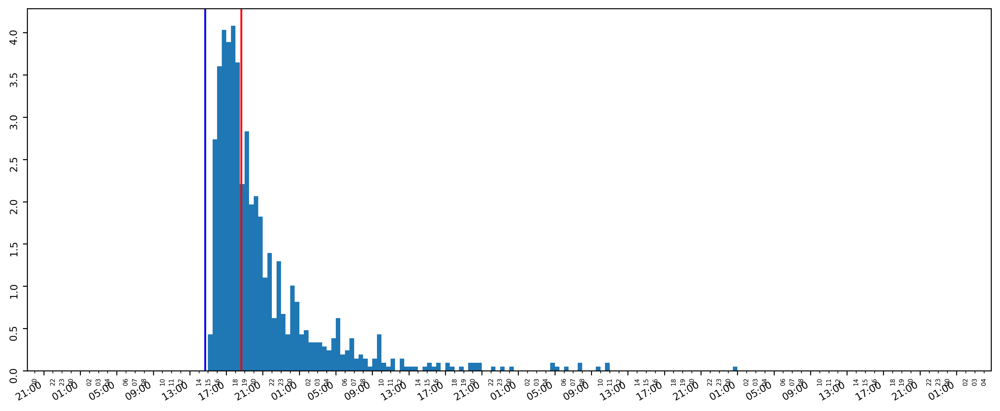

15619 2023-05-08 14:41:42.070000 2023-05-08 18:39:37.688000 [2.79844526] 0.0 2023-05-08 15:08:52.253767 2023-05-11 00:48:21.650912 2 days, 9:39:29.397145
11036


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


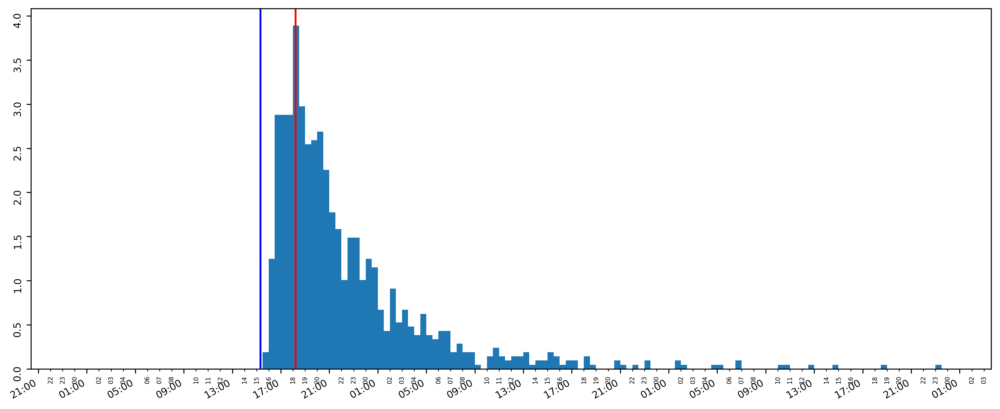

11036 2023-04-06 15:19:33.277000 2023-04-06 18:12:41.854000 [2.49120813] 0.0 2023-04-06 15:42:02.454067 2023-04-08 23:21:57.536629 2 days, 7:39:55.082562
14625


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


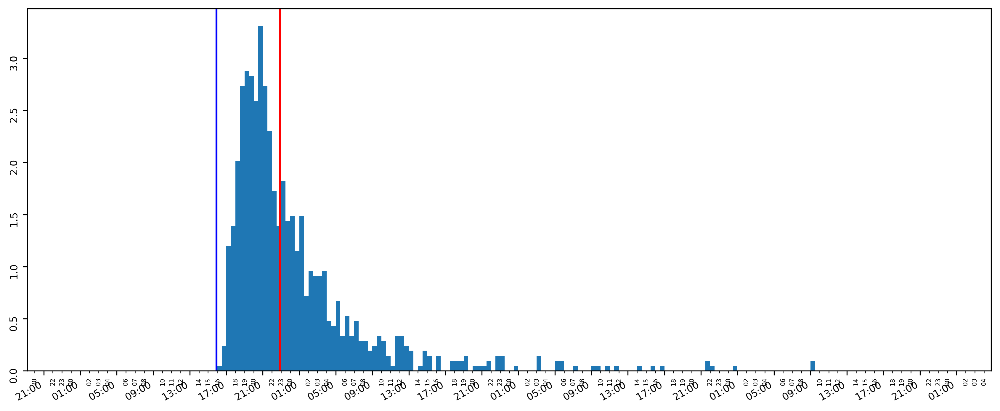

14625 2023-04-27 15:54:44.249000 2023-04-27 22:53:36.515000 [1.8336224] 32.5887725830078 2023-04-27 16:21:00.677177 2023-04-30 09:13:18.806871 2 days, 16:52:18.129694
11109


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


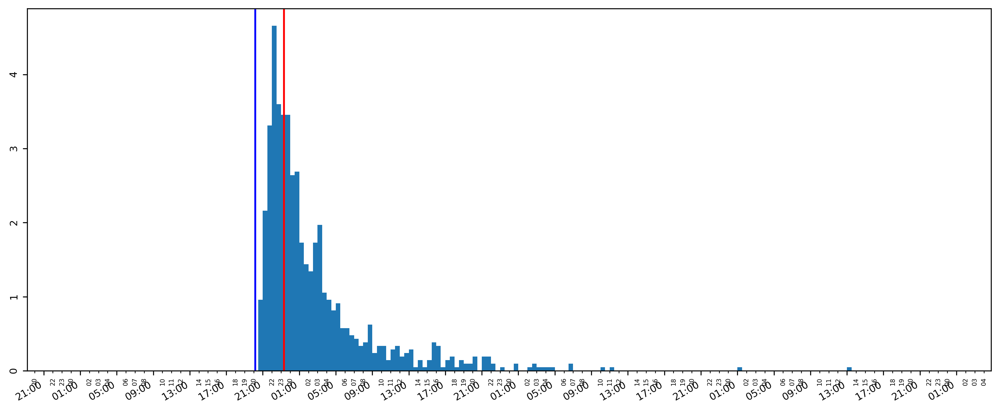

11109 2023-04-06 20:10:54.816000 2023-04-06 23:19:24.948000 [2.85146218] 0.0 2023-04-06 20:33:50.531300 2023-04-09 13:01:16.066093 2 days, 16:27:25.534793
11226


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


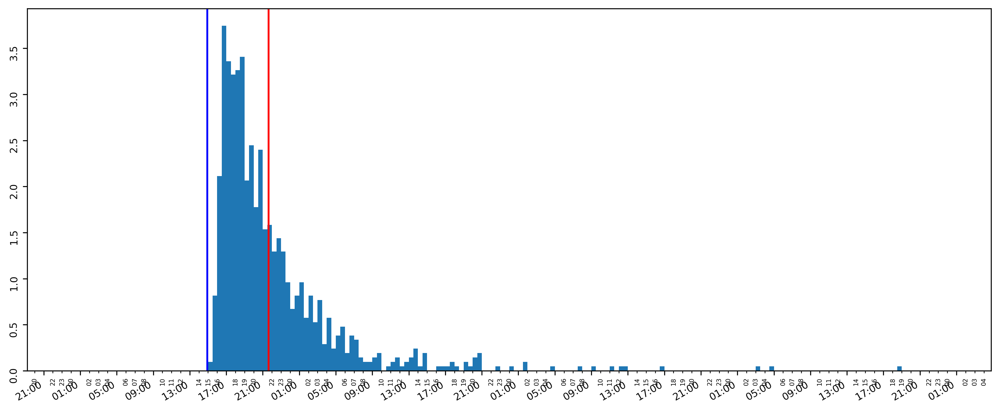

11226 2023-04-07 14:54:50.780000 2023-04-07 21:37:15.759000 [1.69977905] 0.0 2023-04-07 15:22:02.875149 2023-04-10 18:48:20.557793 3 days, 3:26:17.682644
14358


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


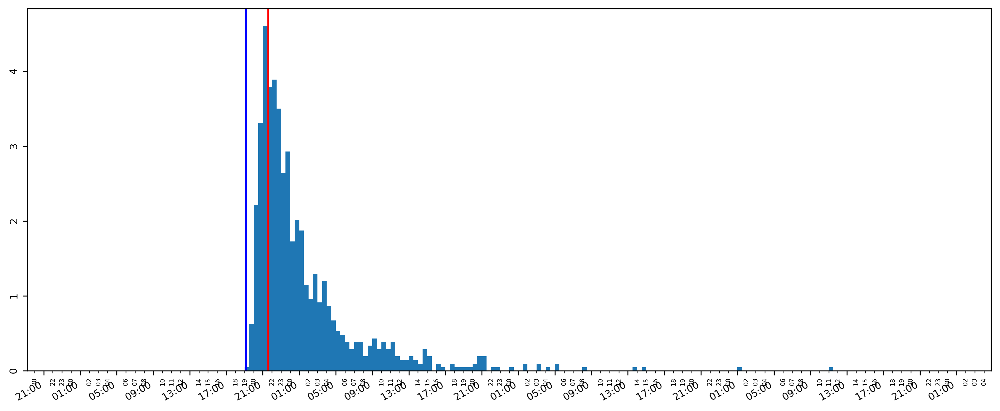

14358 2023-04-25 19:08:19.481000 2023-04-25 21:36:48.225000 [2.89192378] 0.0 2023-04-25 19:26:17.903553 2023-04-28 11:26:26.004289 2 days, 16:00:08.100736
10633


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


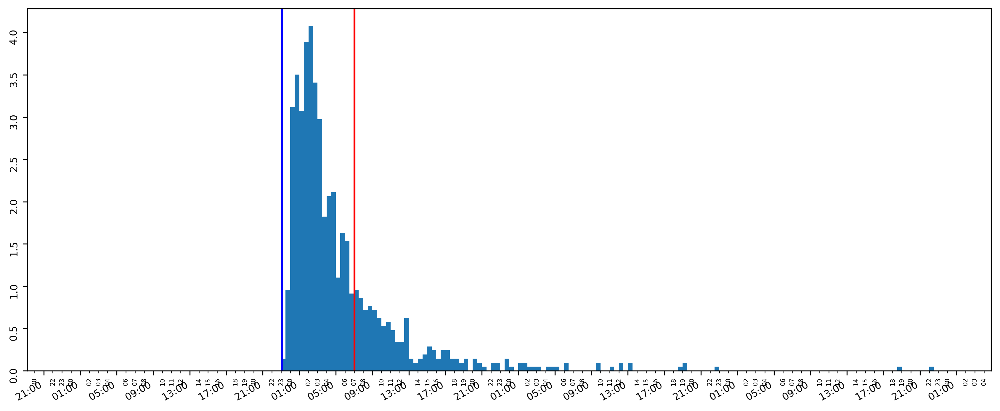

10633 2023-04-04 23:07:16.616000 2023-04-05 07:03:09.387000 [1.14026174] 0.0 2023-04-04 23:27:36.495486 2023-04-07 22:13:58.436819 2 days, 22:46:21.941333
12848


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


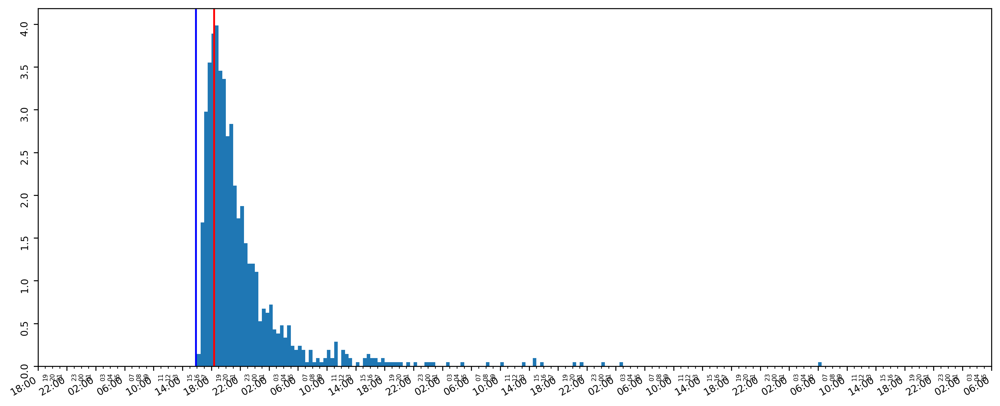

12848 2023-04-16 15:51:45.679000 2023-04-16 18:23:28.364000 [2.6897421] 0.0 2023-04-16 16:20:32.268872 2023-04-20 06:01:11.871346 3 days, 13:40:39.602474
17024


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


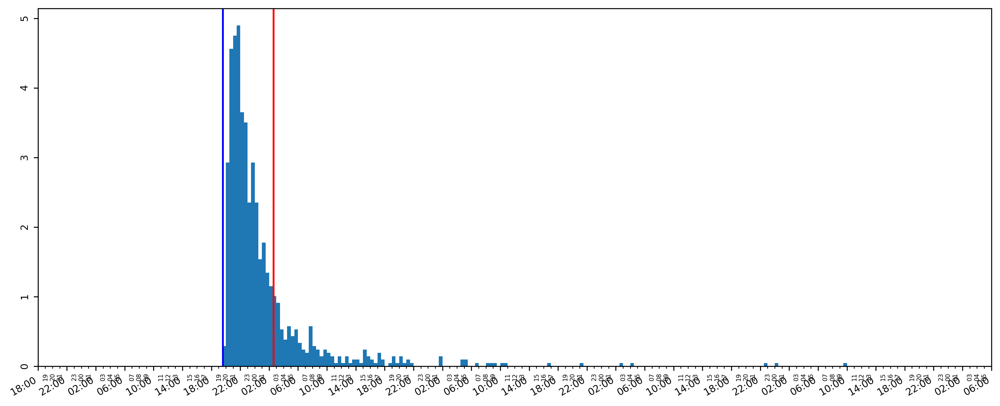

17024 2023-05-30 19:36:57.977000 2023-05-31 02:37:57.775000 [1.20304368] 0.0 2023-05-30 19:53:32.754728 2023-06-03 09:43:47.237992 3 days, 13:50:14.483264
10713


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


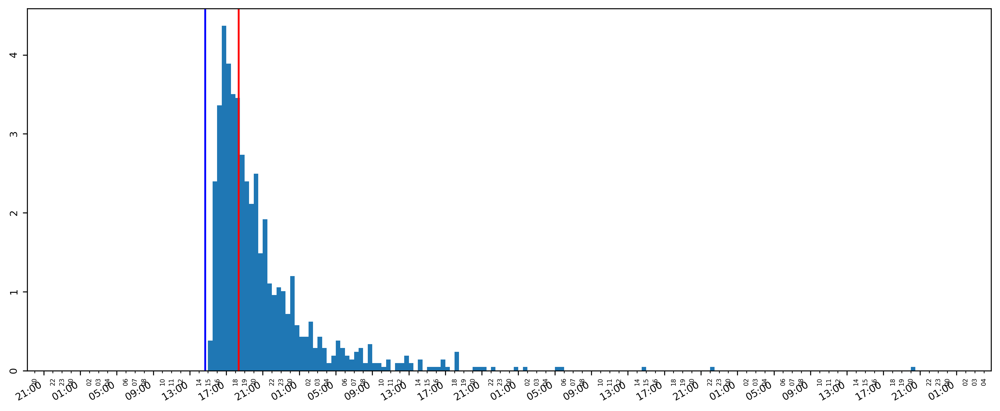

10713 2023-04-05 14:41:13.839000 2023-04-05 18:20:39.244000 [2.89567249] 0.0 2023-04-05 15:15:31.703489 2023-04-08 20:14:32.828198 3 days, 4:59:01.124709
12536


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


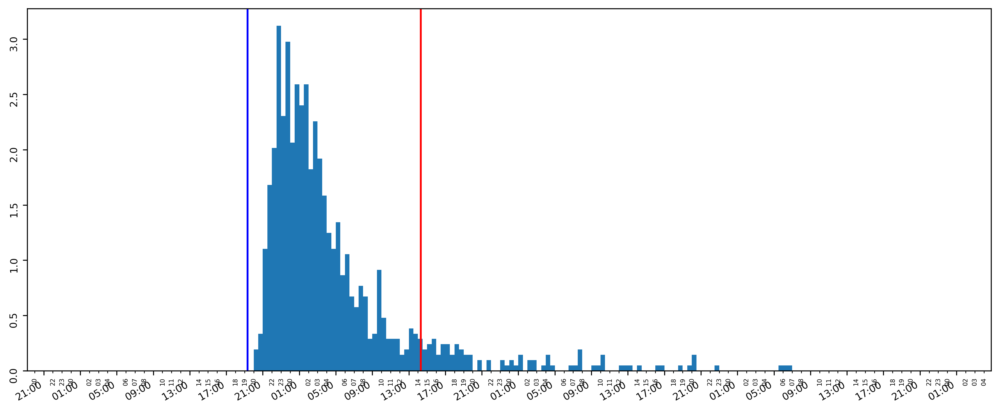

12536 2023-04-13 19:18:56.903000 2023-04-14 14:17:47.718000 [0.25959007] 0.0 2023-04-13 20:18:23.938094 2023-04-16 06:41:34.794138 2 days, 10:23:10.856044
13542


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


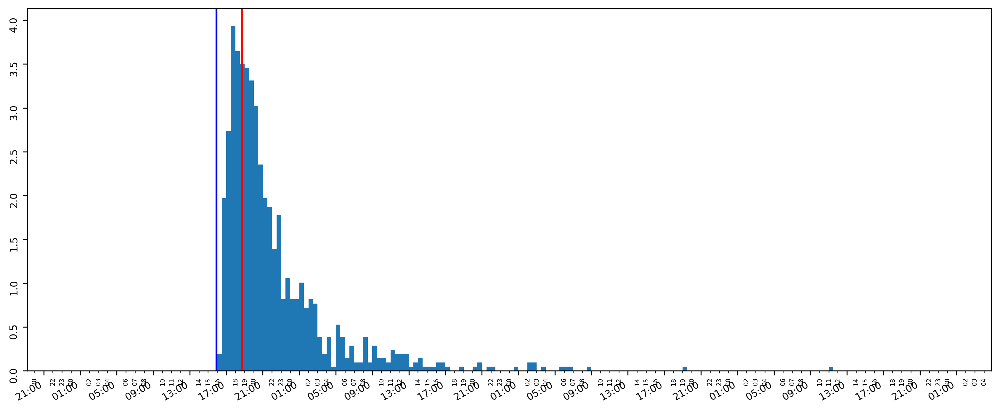

13542 2023-04-20 15:54:36.932000 2023-04-20 18:42:07.690000 [2.88350985] 0.0 2023-04-20 16:20:17.604489 2023-04-23 11:02:10.649179 2 days, 18:41:53.044690
13595


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


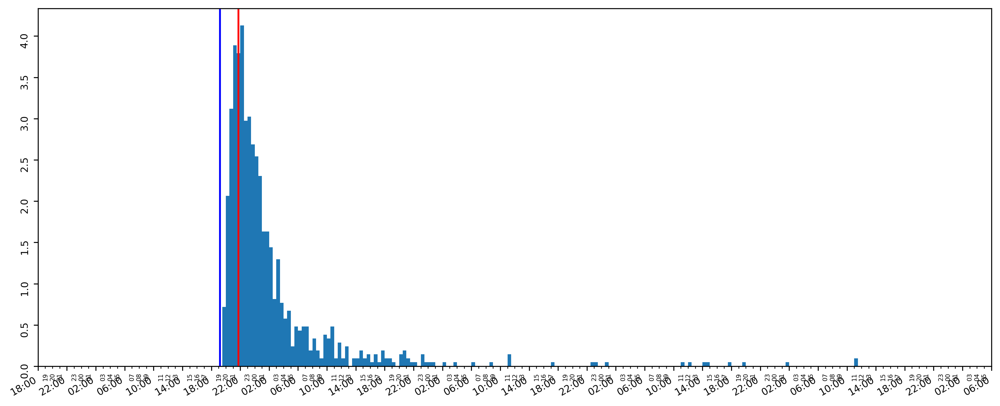

13595 2023-04-20 19:11:37.341000 2023-04-20 21:44:32.104000 [2.37732994] 0.0 2023-04-20 19:35:14.429520 2023-04-24 11:14:18.666744 3 days, 15:39:04.237224
10798


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


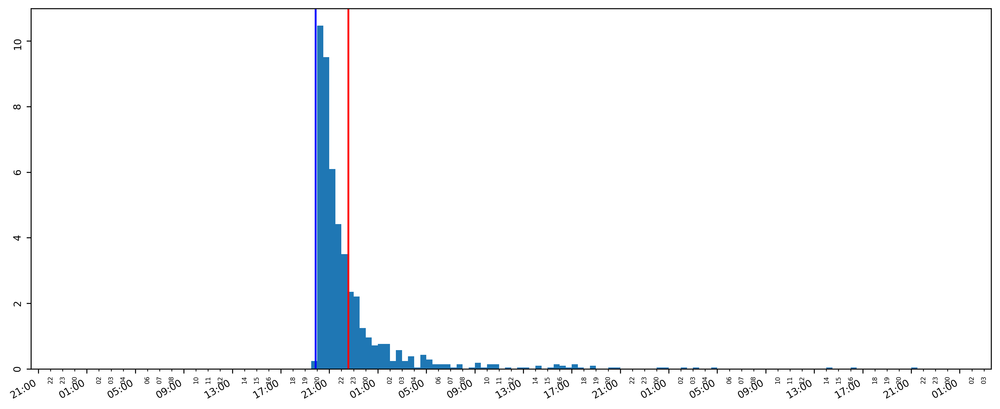

10798 2023-04-05 19:52:47.073000 2023-04-05 22:33:52.908000 [3.3811775] 0.0 2023-04-05 19:55:39.671430 2023-04-07 21:21:12.581540 2 days, 1:25:32.910110
15028


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


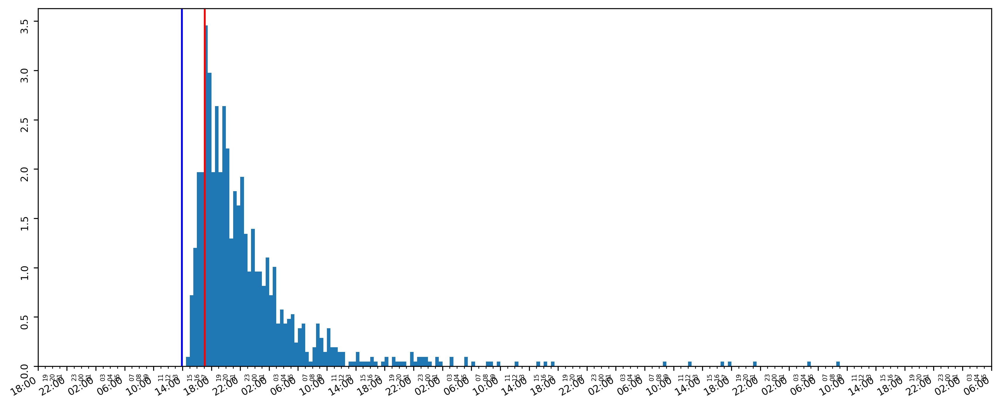

15028 2023-04-30 13:56:05.953000 2023-04-30 17:05:41.150000 [1.74431009] 0.0 2023-04-30 14:49:49.865183 2023-05-04 08:58:43.731282 3 days, 18:08:53.866099
16434


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


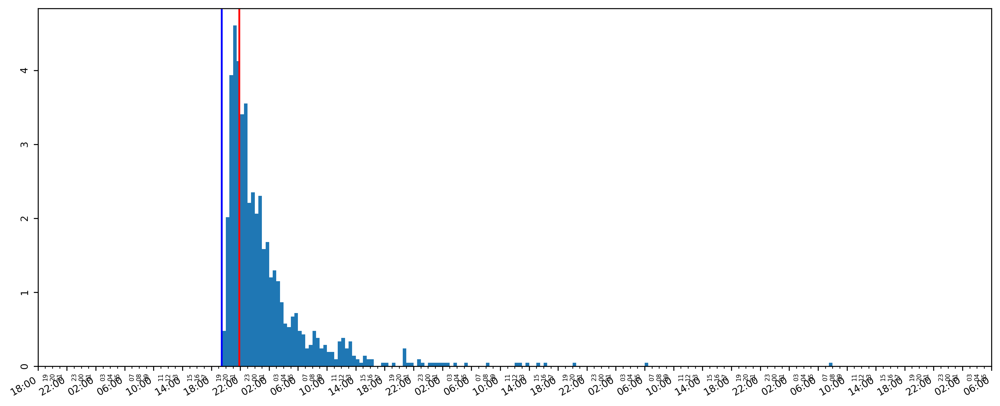

16434 2023-05-17 19:25:11.359000 2023-05-17 21:52:50.643000 [2.83129266] 0.0 2023-05-17 19:44:51.774719 2023-05-21 07:30:42.721433 3 days, 11:45:50.946714
15711


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


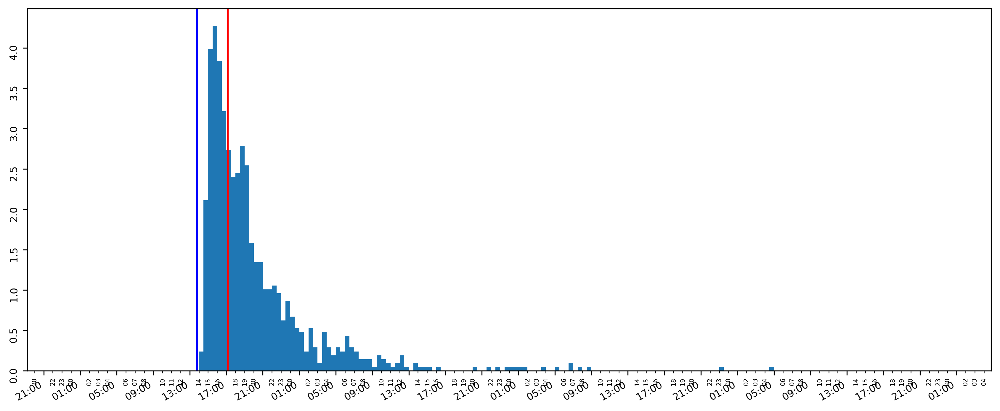

15711 2023-05-09 13:46:46.139000 2023-05-09 17:09:31.376000 [2.79318983] 0.0 2023-05-09 14:01:16.828893 2023-05-12 04:48:13.340927 2 days, 14:46:56.512034
12378


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


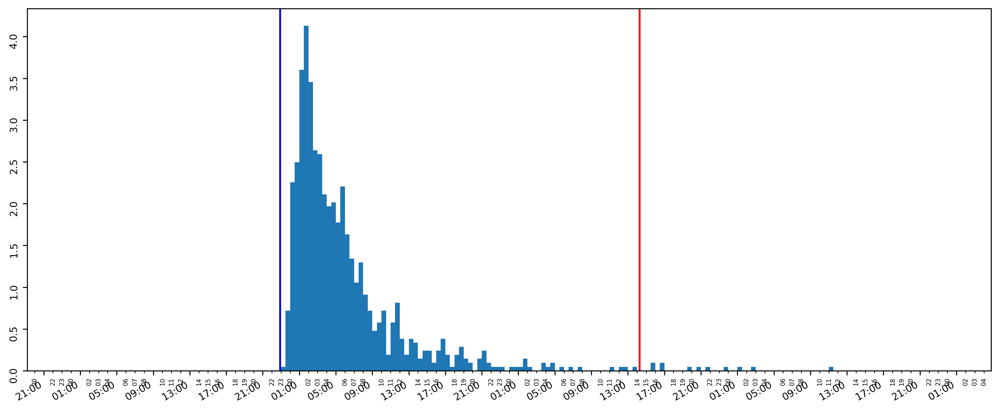

12378 2023-04-12 22:54:43.840000 2023-04-14 14:17:44.182000 [0.02454684] 0.0 2023-04-12 23:21:59.902143 2023-04-15 11:14:08.336192 2 days, 11:52:08.434049
12565


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


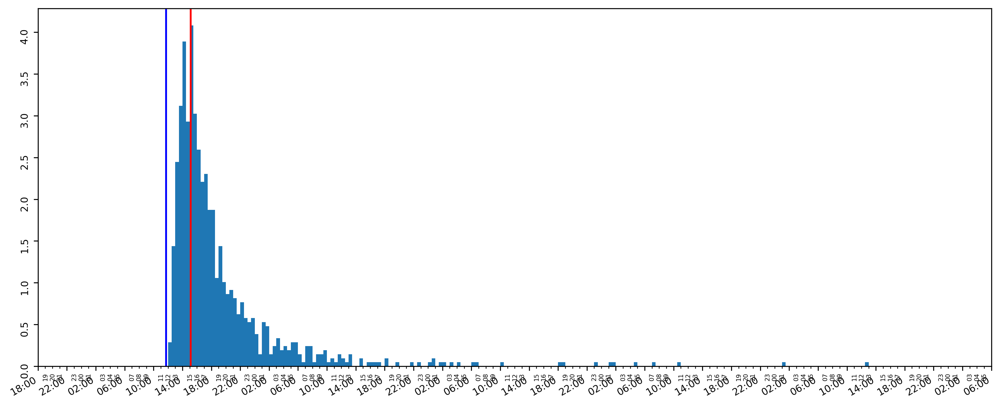

12565 2023-04-14 11:42:48.394000 2023-04-14 15:07:42.895000 [2.38040742] 0.0 2023-04-14 12:14:38.880870 2023-04-18 12:44:32.684677 4 days, 0:29:53.803807
13090


/tmp/ipykernel_854635/858202317.py:54: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),


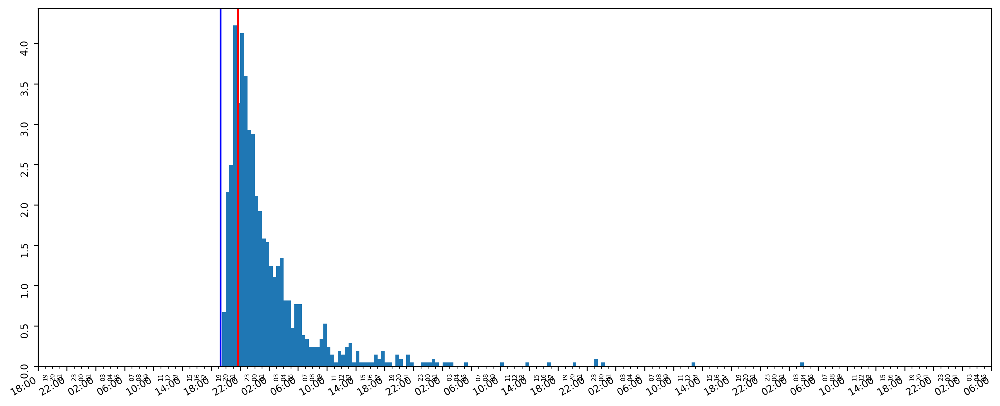

13090 2023-04-17 19:17:11.729000 2023-04-17 21:39:53.090000 [2.63900879] 0.0 2023-04-17 19:36:02.109689 2023-04-21 03:55:12.193264 3 days, 8:19:10.083575
14932


KeyboardInterrupt: 

In [5]:
from scipy.stats import gaussian_kde
from sklearn.neighbors import KernelDensity

kde_likelihood = lambda samples, ground_truth : gaussian_kde(samples).pdf(ground_truth) * (3600*24)
kde_likelihood3 = lambda samples, ground_truth : np.exp(
                                                        KernelDensity(kernel='linear')\
                                                            .fit(np.expand_dims(np.array(samples), axis=1)).score([[ground_truth]])
                                                    ) * (3600*24)



get_real_end_time = lambda case_name : test_event_log[test_event_log['case:concept:name'] == case_name]['time:timestamp_complete'].max().timestamp()
get_real_start_time = lambda case_name : test_event_log[test_event_log['case:concept:name'] == case_name]['time:timestamp_start'].min().timestamp()



results = []
n = 1000
cases = test_event_log['case:concept:name'].unique()
print('num cases', len(cases))
random.shuffle(cases)
for case_name in cases:
    print(case_name)
    case_log = test_event_log[test_event_log['case:concept:name'] == case_name]
    real_end_time = get_real_end_time(case_name)
    real_start_time = get_real_start_time(case_name)

    
    case_samples = [sample_dumas.sample_case(case_name) for i in range(n)]
    #print(case_samples)
    likelihood = kde_likelihood(case_samples, real_end_time)
    likelihood3 = kde_likelihood3(case_samples, real_end_time)

    
    case_samples = [datetime.datetime.fromtimestamp(ts) for ts in case_samples]
    real_end_time = datetime.datetime.fromtimestamp(real_end_time)
    real_start_time = datetime.datetime.fromtimestamp(real_start_time)

    plt.figure(figsize=(14, 6))
    #plt.xticks( rotation=25 )
    #print(case_samples)
    ax=plt.gca()
    xfmt = md.DateFormatter('%H:%M')
    ax.xaxis.set_major_formatter(xfmt)
    ax.xaxis.set_major_locator(md.HourLocator(interval=4))
    mxfmt = md.DateFormatter('%H')
    ax.xaxis.set_minor_formatter(mxfmt)
    ax.xaxis.set_minor_locator(md.HourLocator(interval=1))
    ax.tick_params(axis='both', which='major', labelsize=8, rotation=90)
    ax.tick_params(axis='both', which='minor', labelsize=5, rotation=90)
    
    plt.gcf().autofmt_xdate()
    plt.gcf().set_dpi(300)
    plt.hist(case_samples, bins=pandas.date_range(start= pandas.to_datetime(min(case_samples)).floor('D'), end=pandas.to_datetime(max(case_samples)).ceil('D'),
                                                  freq='30T'), density=True)
    plt.axvline(x=real_end_time, color='red')
    plt.axvline(x=real_start_time, color='blue')
    plt.show()
    results.append(likelihood[0])
    print(case_name, real_start_time, real_end_time, likelihood, likelihood3, min(case_samples), max(case_samples),  max(case_samples)-min(case_samples))


In [ ]:
test_event_log[test_event_log['case:concept:name'] == 10642]